# Normalizing flows:  re-implementation of the Glow paper

* train model on CelebaA dataset
* images are resized to 48x48

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
import numpy as np
import tensorflow as tf
from scipy.stats import norm
import matplotlib.pyplot as plt

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
import utils
import nets
import flow_layers as fl

In [ ]:
tf.set_random_seed(0)
sess = tf.InteractiveSession()

## Import dataset

In [6]:
batch_size = 8
image_size = 48
x_train_samples = utils.create_tfrecord_dataset_iterator(
    "datasets/celeba/celeba_train.tfrecords", batch_size=batch_size, image_size=image_size
)
x_valid_samples = utils.create_tfrecord_dataset_iterator(
    "datasets/celeba/celeba_valid.tfrecords", batch_size=batch_size, image_size=image_size
)

x_train_samples

<tf.Tensor 'truediv:0' shape=(8, 48, 48, 3) dtype=float32>

### Check shapes:

In [7]:
x_valid_samples.eval().shape

(8, 48, 48, 3)

In [8]:
x_exampled = x_valid_samples.eval()

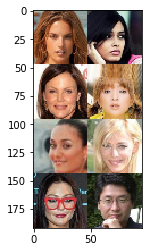

In [9]:
plt.imshow(utils.plot_grid(x_valid_samples).eval())

In [12]:
# benchmark dataset reading
%timeit -n 100 x_valid_samples.eval()

1.4 ms ± 113 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


## Build Flow

* here we use OpenAITemplate class to create shallow NN inside AffineCouplingLayer

In [10]:
nn_template_fn = nets.OpenAITemplate(
    width=148
)

In [11]:
layers, actnorm_layers = nets.create_simple_flow(
    num_steps=22, 
    num_scales=3, 
    template_fn=nn_template_fn
)

# create model
images = x_train_samples
flow = fl.InputLayer(images)
model_flow = fl.ChainLayer(layers)
output_flow = model_flow(flow, forward=True)

QuantizeImage/Forward/                  : x=[8, 48, 48, 3]	z=[None]	logdet=[8]
SqueezingLayer/Forward/Scale1           : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormBiasLayer/Forward/               : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormScaleLayer/Forward/              : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ChainLayer/Forward/                     : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormLayer/Forward/                   : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
InvertibleConv1x1Layer/Forward/         : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
AffineCouplingLayer/Forward/            : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ChainLayer/Forward/Step1                : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormBiasLayer/Forward/               : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormScaleLayer/Forward/              : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ChainLayer/Forward/                     : x=[8, 24, 24, 12]	z=[None]	logdet=[8]
ActnormLayer/Forward/                   :

## Prepare output tensors

In [12]:
y, logdet, z = output_flow
output_flow

(<tf.Tensor 'ChainLayer/outputs/x:0' shape=(8, 6, 6, 24) dtype=float32>,
 <tf.Tensor 'ChainLayer/outputs/lodget:0' shape=(8,) dtype=float32>,
 <tf.Tensor 'ChainLayer/outputs/z:0' shape=(8, 6, 6, 168) dtype=float32>)

## Build loss function

* Here simply the $-logp(x)$

In [13]:
tfd = tf.contrib.distributions

beta_ph = tf.placeholder(tf.float32, [])

y_flatten = tf.reshape(y, [batch_size, -1])
z_flatten = tf.reshape(z, [batch_size, -1])

prior_y = tfd.MultivariateNormalDiag(loc=tf.zeros_like(y_flatten), scale_diag=beta_ph * tf.ones_like(y_flatten))
prior_z = tfd.MultivariateNormalDiag(loc=tf.zeros_like(z_flatten), scale_diag=beta_ph * tf.ones_like(z_flatten))

log_prob_y =  prior_y.log_prob(y_flatten)
log_prob_z =  prior_z.log_prob(z_flatten)

In [14]:
prior_z

<tf.distributions.MultivariateNormalDiag 'MultivariateNormalDiag' batch_shape=(8,) event_shape=(6048,) dtype=float32>

### The MLE loss

In [15]:
loss = log_prob_y + log_prob_z + logdet
loss = - tf.reduce_mean(loss)

### The L2 regularization loss 

In [16]:
trainable_variables = tf.trainable_variables() 
l2_reg = 0.00001 
l2_loss = l2_reg * tf.add_n([ tf.nn.l2_loss(v) for v in trainable_variables])

### Debug model, print variables 

In [17]:
total_params = 0
for k, v in enumerate(trainable_variables):
    num_params = np.prod(v.shape.as_list())
    total_params += num_params
#     print(f"[{k:4}][{num_params:6}] {v.op.name[:96]}")

print(f"total_params: {total_params/1e6} M")

total_params: 5.42388 M


### Total loss -logp(x) + l2_loss

In [18]:
sess.run(tf.global_variables_initializer())

In [19]:
loss_per_pixel = loss / image_size / image_size  

In [20]:
total_loss = l2_loss + loss_per_pixel 

In [21]:
l2_loss.eval(feed_dict={beta_ph: 1.0}), loss_per_pixel.eval(feed_dict={beta_ph: 1.0})

(0.11592529, 2.883359)

## Create backward flow to generate samples

In [22]:
sample_y_flatten = prior_y.sample()
sample_y = tf.reshape(sample_y_flatten, y.shape.as_list())
sample_z = tf.reshape(prior_z.sample(), z.shape.as_list())
sampled_logdet = prior_y.log_prob(sample_y_flatten)

In [23]:
inverse_flow = sample_y, sampled_logdet, sample_z
sampled_flow = model_flow(inverse_flow, forward=False)

FactorOutLayer/Backward/Scale3          : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
AffineCouplingLayer/Backward/           : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
InvertibleConv1x1Layer/Backward/        : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormScaleLayer/Backward/             : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormBiasLayer/Backward/              : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ChainLayer/Backward/                    : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormLayer/Backward/                  : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ChainLayer/Backward/Step22              : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
AffineCouplingLayer/Backward/           : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
InvertibleConv1x1Layer/Backward/        : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormScaleLayer/Backward/             : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormBiasLayer/Backward/              : y=[8, 6, 6, 

In [24]:
total_params = 0
for k, v in enumerate(trainable_variables):
    num_params = np.prod(v.shape.as_list())
    total_params += num_params
print(f"total_params: {total_params/1e6} M")

total_params: 5.42388 M


In [25]:
x_flow_sampled, _, _ = sampled_flow

In [26]:
x_flow_sampled.eval({beta_ph: 1.0}).shape

(8, 48, 48, 3)

## Define optimizer and learning rate

In [27]:
lr_ph = tf.placeholder(tf.float32)
optimizer = tf.train.AdamOptimizer(lr_ph)
train_op = optimizer.minimize(total_loss)

## Initialize Actnorms using DDI

* Initialize Actnorms layers using Data Dependent Initialization as described in the paper. 
* Here the algorithm is a little bit different since it allows for using multiple mini-batches to set the actnorms weights.

In [37]:
sess.run(tf.global_variables_initializer())
nets.initialize_actnorms(
    sess,
    feed_dict_fn=lambda: {beta_ph: 1.0},
    actnorm_layers=actnorm_layers,
    num_steps=10,
)


100%|██████████| 66/66 [02:45<00:00,  2.51s/it]


## Train model, define metrics and trainer

In [41]:
metrics = utils.Metrics(50, metrics_tensors={"total_loss": total_loss, "loss_per_pixel": loss_per_pixel, "l2_loss": l2_loss})
plot_metrics_hook = utils.PlotMetricsHook(metrics, step=1000)

In [42]:
sess.run(train_op, feed_dict={lr_ph: 0.0, beta_ph: 1.0})

In [43]:
total_loss.eval(feed_dict={lr_ph: 0.0, beta_ph: 1.0})

-3.733277

### Initial samples from model

In [44]:
quantize_image_layer = layers[0]
aux_feed_dict = {lr_ph: 0.0, beta_ph: 1.0}

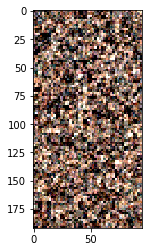

In [45]:
x_flow_sampled_uint = quantize_image_layer.to_uint8(x_flow_sampled)
plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval(aux_feed_dict))

### Train model

* The model is quite bit, we start with small LR for warm-up its weights

In [46]:
utils.trainer(
    sess, 
    num_steps=100, 
    train_op=train_op, 
    feed_dict_fn=lambda: {lr_ph: 0.0001, beta_ph: 1.0}, 
    metrics=[metrics], 
    hooks=[plot_metrics_hook]
)


 50%|█████     | 50/100 [00:10<00:10,  4.82it/s]

total_loss -5.3344965
loss_per_pixel -5.4501557
l2_loss 0.11565937



100%|██████████| 100/100 [00:20<00:00,  4.78it/s]


total_loss -5.814645
loss_per_pixel -5.930015
l2_loss 0.115370326



  5%|▌         | 51/1000 [00:10<03:13,  4.90it/s]

total_loss -5.681225
loss_per_pixel -5.795908
l2_loss 0.1146833



 10%|█         | 101/1000 [00:20<03:04,  4.88it/s]

total_loss -5.985132
loss_per_pixel -6.0989537
l2_loss 0.11382171



 15%|█▌        | 150/1000 [00:30<02:55,  4.84it/s]

total_loss -6.33194
loss_per_pixel -6.4449344
l2_loss 0.11299406



 20%|██        | 200/1000 [00:41<02:44,  4.85it/s]

total_loss -6.098794
loss_per_pixel -6.2110114
l2_loss 0.112217516



 25%|██▌       | 250/1000 [00:51<02:33,  4.88it/s]

total_loss -6.000573
loss_per_pixel -6.1120543
l2_loss 0.111481346



 30%|███       | 300/1000 [01:01<02:22,  4.90it/s]

total_loss -6.1803455
loss_per_pixel -6.2911334
l2_loss 0.11078797



 35%|███▌      | 350/1000 [01:11<02:12,  4.90it/s]

total_loss -6.349984
loss_per_pixel -6.4601154
l2_loss 0.11013115



 40%|████      | 401/1000 [01:22<02:02,  4.89it/s]

total_loss -6.231526
loss_per_pixel -6.3410306
l2_loss 0.10950463



 45%|████▌     | 451/1000 [01:32<01:52,  4.89it/s]

total_loss -6.0232325
loss_per_pixel -6.132133
l2_loss 0.108900584



 50%|█████     | 501/1000 [01:42<01:42,  4.89it/s]

total_loss -6.339796
loss_per_pixel -6.4481235
l2_loss 0.10832755



 55%|█████▌    | 551/1000 [01:52<01:31,  4.91it/s]

total_loss -6.1468244
loss_per_pixel -6.2546062
l2_loss 0.107781924



 60%|██████    | 601/1000 [02:02<01:21,  4.93it/s]

total_loss -6.2403164
loss_per_pixel -6.347565
l2_loss 0.10724889



 65%|██████▌   | 650/1000 [02:11<01:10,  4.93it/s]

total_loss -6.334031
loss_per_pixel -6.440762
l2_loss 0.10673071



 70%|███████   | 700/1000 [02:21<01:00,  4.93it/s]

total_loss -6.3375163
loss_per_pixel -6.443758
l2_loss 0.106241696



 75%|███████▌  | 750/1000 [02:32<00:50,  4.93it/s]

total_loss -6.309874
loss_per_pixel -6.415655
l2_loss 0.10578123



 80%|████████  | 801/1000 [02:42<00:40,  4.93it/s]

total_loss -6.341448
loss_per_pixel -6.44681
l2_loss 0.10536186



 85%|████████▌ | 850/1000 [02:52<00:30,  4.93it/s]

total_loss -6.309646
loss_per_pixel -6.4145947
l2_loss 0.10494855



 90%|█████████ | 901/1000 [03:02<00:20,  4.93it/s]

total_loss -5.9950004
loss_per_pixel -6.0995426
l2_loss 0.10454235



 95%|█████████▌| 951/1000 [03:12<00:09,  4.94it/s]

total_loss -6.4420567
loss_per_pixel -6.546219
l2_loss 0.104162276



100%|█████████▉| 999/1000 [03:22<00:00,  4.94it/s]

total_loss -6.460824
loss_per_pixel -6.5646186
l2_loss 0.10379442


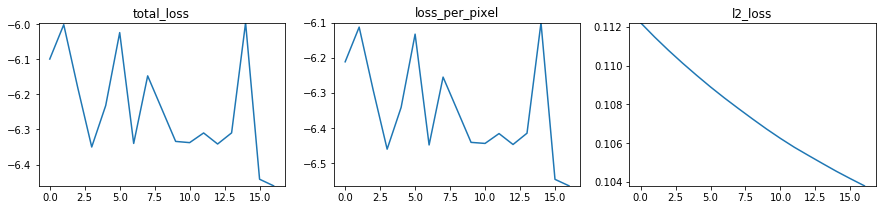


100%|██████████| 1000/1000 [03:22<00:00,  4.93it/s]


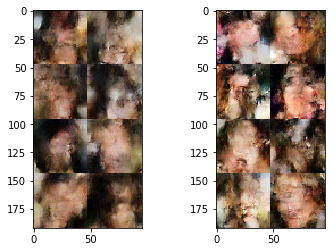


  5%|▌         | 50/1000 [00:09<03:09,  5.02it/s]

total_loss -6.325299
loss_per_pixel -6.4287496
l2_loss 0.103450604



 10%|█         | 100/1000 [00:19<02:58,  5.05it/s]

total_loss -6.236012
loss_per_pixel -6.3391194
l2_loss 0.10310762



 15%|█▌        | 151/1000 [00:30<02:49,  5.02it/s]

total_loss -6.5636706
loss_per_pixel -6.666446
l2_loss 0.10277561



 20%|██        | 201/1000 [00:40<02:39,  5.02it/s]

total_loss -6.4061613
loss_per_pixel -6.5086765
l2_loss 0.10251543



 25%|██▌       | 250/1000 [00:49<02:29,  5.01it/s]

total_loss -6.3894567
loss_per_pixel -6.4917035
l2_loss 0.10224657



 30%|███       | 301/1000 [00:59<02:18,  5.03it/s]

total_loss -6.378535
loss_per_pixel -6.4805064
l2_loss 0.10197149



 35%|███▌      | 350/1000 [01:09<02:09,  5.03it/s]

total_loss -6.534905
loss_per_pixel -6.6366086
l2_loss 0.101703756



 40%|████      | 400/1000 [01:20<02:00,  4.98it/s]

total_loss -6.3728137
loss_per_pixel -6.474258
l2_loss 0.1014443



 45%|████▌     | 451/1000 [01:30<01:50,  4.99it/s]

total_loss -6.548519
loss_per_pixel -6.649719
l2_loss 0.1012002



 50%|█████     | 500/1000 [01:40<01:40,  4.97it/s]

total_loss -6.457683
loss_per_pixel -6.5586395
l2_loss 0.10095637



 55%|█████▌    | 551/1000 [01:50<01:30,  4.98it/s]

total_loss -6.5982924
loss_per_pixel -6.6990643
l2_loss 0.100772135



 60%|██████    | 600/1000 [02:00<01:20,  4.98it/s]


total_loss -6.3658323
loss_per_pixel -6.4664
l2_loss 0.10056769


 65%|██████▌   | 650/1000 [02:10<01:10,  4.96it/s]

total_loss -6.3284
loss_per_pixel -6.4287663
l2_loss 0.100366004



 70%|███████   | 700/1000 [02:21<01:00,  4.96it/s]

total_loss -6.3044224
loss_per_pixel -6.4045925
l2_loss 0.10017015



 75%|███████▌  | 751/1000 [02:31<00:50,  4.96it/s]

total_loss -6.3485756
loss_per_pixel -6.4485583
l2_loss 0.09998298



 80%|████████  | 801/1000 [02:41<00:40,  4.96it/s]

total_loss -6.4604974
loss_per_pixel -6.5602946
l2_loss 0.0997971



 85%|████████▌ | 850/1000 [02:51<00:30,  4.97it/s]

total_loss -6.4949884
loss_per_pixel -6.594618
l2_loss 0.09962956



 90%|█████████ | 901/1000 [03:01<00:19,  4.97it/s]

total_loss -6.57053
loss_per_pixel -6.6700015
l2_loss 0.099471465



 95%|█████████▌| 951/1000 [03:10<00:09,  4.98it/s]

total_loss -6.3864875
loss_per_pixel -6.485804
l2_loss 0.09931666



100%|█████████▉| 999/1000 [03:20<00:00,  4.99it/s]

total_loss -6.4979577
loss_per_pixel -6.5971184
l2_loss 0.09916055


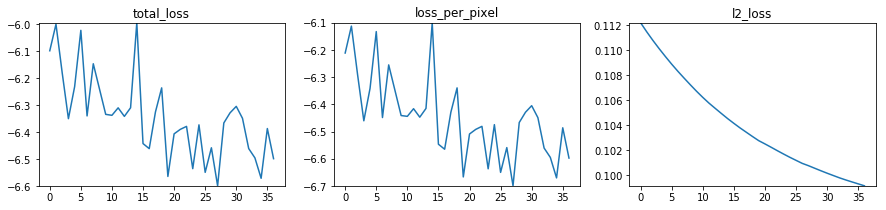


100%|██████████| 1000/1000 [03:20<00:00,  4.98it/s]


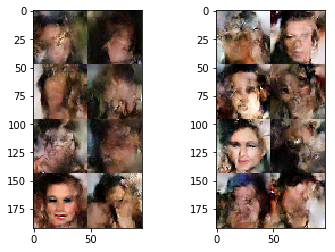


  5%|▌         | 51/1000 [00:09<03:04,  5.14it/s]

total_loss -6.440788
loss_per_pixel -6.539805
l2_loss 0.099017



 10%|█         | 100/1000 [00:19<02:56,  5.11it/s]

total_loss -6.3982363
loss_per_pixel -6.4971137
l2_loss 0.09887739



 15%|█▌        | 151/1000 [00:29<02:45,  5.12it/s]

total_loss -6.536673
loss_per_pixel -6.6354175
l2_loss 0.09874445



 20%|██        | 201/1000 [00:39<02:36,  5.10it/s]

total_loss -6.4021616
loss_per_pixel -6.5007834
l2_loss 0.098621696



 25%|██▌       | 251/1000 [00:49<02:27,  5.07it/s]

total_loss -6.495108
loss_per_pixel -6.5936127
l2_loss 0.09850433



 30%|███       | 300/1000 [00:58<02:17,  5.09it/s]

total_loss -6.564724
loss_per_pixel -6.6631217
l2_loss 0.098397955



 35%|███▌      | 351/1000 [01:09<02:07,  5.08it/s]

total_loss -6.6919923
loss_per_pixel -6.7902865
l2_loss 0.09829418



 40%|████      | 400/1000 [01:18<01:58,  5.07it/s]

total_loss -6.4843326
loss_per_pixel -6.5825353
l2_loss 0.09820272



 45%|████▌     | 451/1000 [01:28<01:48,  5.08it/s]

total_loss -6.4841557
loss_per_pixel -6.5822673
l2_loss 0.09811153



 50%|█████     | 501/1000 [01:39<01:38,  5.06it/s]

total_loss -6.439199
loss_per_pixel -6.5372167
l2_loss 0.09801753



 55%|█████▌    | 550/1000 [01:48<01:28,  5.06it/s]

total_loss -6.528208
loss_per_pixel -6.626142
l2_loss 0.09793416



 60%|██████    | 601/1000 [01:58<01:18,  5.06it/s]

total_loss -6.6731725
loss_per_pixel -6.7710195
l2_loss 0.097847216



 65%|██████▌   | 651/1000 [02:08<01:08,  5.07it/s]

total_loss -6.5978312
loss_per_pixel -6.6955967
l2_loss 0.097765654



 70%|███████   | 701/1000 [02:18<00:58,  5.07it/s]

total_loss -6.550116
loss_per_pixel -6.647808
l2_loss 0.09769184



 75%|███████▌  | 751/1000 [02:28<00:49,  5.06it/s]

total_loss -6.447516
loss_per_pixel -6.54513
l2_loss 0.09761361



 80%|████████  | 801/1000 [02:38<00:39,  5.07it/s]

total_loss -6.559973
loss_per_pixel -6.6575236
l2_loss 0.097550854



 85%|████████▌ | 851/1000 [02:47<00:29,  5.07it/s]

total_loss -6.320523
loss_per_pixel -6.4180126
l2_loss 0.09748987



 90%|█████████ | 901/1000 [02:57<00:19,  5.08it/s]

total_loss -6.5756335
loss_per_pixel -6.6730633
l2_loss 0.0974299



 95%|█████████▌| 951/1000 [03:07<00:09,  5.07it/s]

total_loss -6.569411
loss_per_pixel -6.666779
l2_loss 0.09736831



100%|█████████▉| 999/1000 [03:17<00:00,  5.07it/s]

total_loss -6.5172133
loss_per_pixel -6.6145177
l2_loss 0.09730426


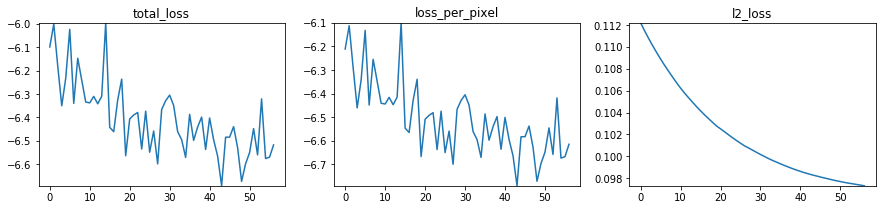


100%|██████████| 1000/1000 [03:17<00:00,  5.06it/s]


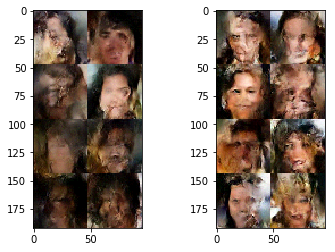


  5%|▌         | 50/1000 [00:09<02:59,  5.29it/s]


total_loss -6.3716245
loss_per_pixel -6.4688816
l2_loss 0.09725713


 10%|█         | 101/1000 [00:19<02:54,  5.14it/s]

total_loss -6.394606
loss_per_pixel -6.4918036
l2_loss 0.09719762



 15%|█▌        | 151/1000 [00:29<02:45,  5.12it/s]

total_loss -6.5628567
loss_per_pixel -6.6600013
l2_loss 0.09714453



 20%|██        | 200/1000 [00:39<02:36,  5.11it/s]

total_loss -6.7055182
loss_per_pixel -6.8026104
l2_loss 0.09709214



 25%|██▌       | 251/1000 [00:49<02:27,  5.09it/s]

total_loss -6.399328
loss_per_pixel -6.4963856
l2_loss 0.09705756



 30%|███       | 300/1000 [00:58<02:16,  5.11it/s]

total_loss -6.455126
loss_per_pixel -6.5521393
l2_loss 0.09701356



 35%|███▌      | 351/1000 [01:08<02:06,  5.11it/s]

total_loss -6.5478315
loss_per_pixel -6.644802
l2_loss 0.09697038



 40%|████      | 401/1000 [01:18<01:57,  5.10it/s]

total_loss -6.710919
loss_per_pixel -6.8078513
l2_loss 0.09693245



 45%|████▌     | 451/1000 [01:28<01:47,  5.10it/s]

total_loss -6.627701
loss_per_pixel -6.7245884
l2_loss 0.096887745



 50%|█████     | 500/1000 [01:38<01:38,  5.08it/s]

total_loss -6.55375
loss_per_pixel -6.650595
l2_loss 0.096845195



 55%|█████▌    | 551/1000 [01:48<01:28,  5.09it/s]

total_loss -6.573263
loss_per_pixel -6.670069
l2_loss 0.09680597



 60%|██████    | 601/1000 [01:58<01:18,  5.08it/s]

total_loss -6.6710033
loss_per_pixel -6.767776
l2_loss 0.096772715



 65%|██████▌   | 651/1000 [02:07<01:08,  5.09it/s]

total_loss -6.6663623
loss_per_pixel -6.763096
l2_loss 0.09673341



 70%|███████   | 701/1000 [02:17<00:58,  5.09it/s]

total_loss -6.380495
loss_per_pixel -6.477196
l2_loss 0.096701294



 75%|███████▌  | 751/1000 [02:27<00:48,  5.09it/s]

total_loss -6.630244
loss_per_pixel -6.726913
l2_loss 0.09666932



 80%|████████  | 801/1000 [02:37<00:39,  5.09it/s]

total_loss -6.458554
loss_per_pixel -6.5551896
l2_loss 0.09663561



 85%|████████▌ | 851/1000 [02:47<00:29,  5.09it/s]

total_loss -6.261738
loss_per_pixel -6.35834
l2_loss 0.0966021



 90%|█████████ | 901/1000 [02:57<00:19,  5.08it/s]

total_loss -6.539427
loss_per_pixel -6.6359963
l2_loss 0.09656969



 95%|█████████▌| 950/1000 [03:07<00:09,  5.08it/s]

total_loss -6.254389
loss_per_pixel -6.3509364
l2_loss 0.0965478



100%|█████████▉| 999/1000 [03:16<00:00,  5.08it/s]

total_loss -6.5527205
loss_per_pixel -6.6492543
l2_loss 0.09653399


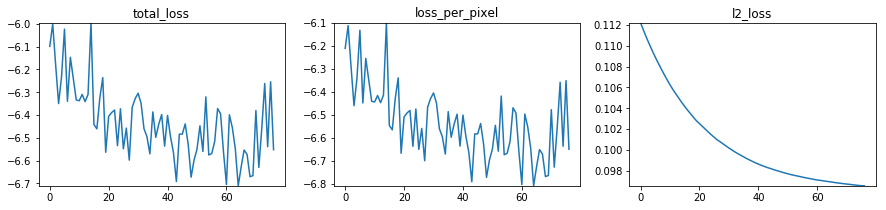


100%|██████████| 1000/1000 [03:17<00:00,  5.07it/s]


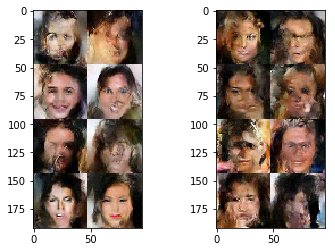


  5%|▌         | 51/1000 [00:09<03:04,  5.14it/s]

total_loss -6.486983
loss_per_pixel -6.583485
l2_loss 0.09650218



 10%|█         | 101/1000 [00:19<02:56,  5.08it/s]

total_loss -6.658393
loss_per_pixel -6.754862
l2_loss 0.096468754



 15%|█▌        | 150/1000 [00:29<02:44,  5.16it/s]

total_loss -6.654405
loss_per_pixel -6.7508435
l2_loss 0.09643855



 20%|██        | 200/1000 [00:39<02:36,  5.10it/s]

total_loss -6.511632
loss_per_pixel -6.6080494
l2_loss 0.09641763



 25%|██▌       | 251/1000 [00:49<02:27,  5.06it/s]

total_loss -6.820829
loss_per_pixel -6.9172206
l2_loss 0.09639188



 30%|███       | 300/1000 [00:59<02:17,  5.07it/s]

total_loss -6.423445
loss_per_pixel -6.519813
l2_loss 0.09636766



 35%|███▌      | 351/1000 [01:09<02:08,  5.06it/s]

total_loss -6.529581
loss_per_pixel -6.6259236
l2_loss 0.09634269



 40%|████      | 400/1000 [01:19<01:58,  5.06it/s]


total_loss -6.574536
loss_per_pixel -6.6708465
l2_loss 0.09631082


 45%|████▌     | 451/1000 [01:29<01:48,  5.06it/s]

total_loss -6.6868114
loss_per_pixel -6.7831063
l2_loss 0.09629472



 50%|█████     | 500/1000 [01:38<01:38,  5.06it/s]

total_loss -6.7377825
loss_per_pixel -6.8340607
l2_loss 0.09627823



 55%|█████▌    | 551/1000 [01:49<01:29,  5.04it/s]

total_loss -6.341406
loss_per_pixel -6.43766
l2_loss 0.096254386



 60%|██████    | 601/1000 [01:59<01:19,  5.04it/s]

total_loss -6.3629518
loss_per_pixel -6.4591928
l2_loss 0.096240856



 65%|██████▌   | 650/1000 [02:09<01:09,  5.03it/s]

total_loss -6.6449375
loss_per_pixel -6.7411537
l2_loss 0.09621641



 70%|███████   | 701/1000 [02:19<00:59,  5.03it/s]

total_loss -6.693056
loss_per_pixel -6.789253
l2_loss 0.096196935



 75%|███████▌  | 751/1000 [02:29<00:49,  5.03it/s]

total_loss -6.822716
loss_per_pixel -6.9188914
l2_loss 0.09617531



 80%|████████  | 801/1000 [02:38<00:39,  5.04it/s]

total_loss -6.643593
loss_per_pixel -6.739746
l2_loss 0.096153416



 85%|████████▌ | 851/1000 [02:48<00:29,  5.04it/s]

total_loss -6.5312448
loss_per_pixel -6.6273837
l2_loss 0.09613877



 90%|█████████ | 900/1000 [02:58<00:19,  5.06it/s]

total_loss -6.666912
loss_per_pixel -6.763033
l2_loss 0.09612071



 95%|█████████▌| 950/1000 [03:08<00:09,  5.05it/s]

total_loss -6.457467
loss_per_pixel -6.553578
l2_loss 0.09611061



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.4616575
loss_per_pixel -6.5577445
l2_loss 0.096086845


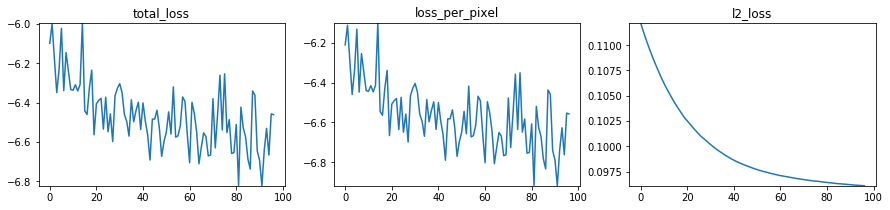


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


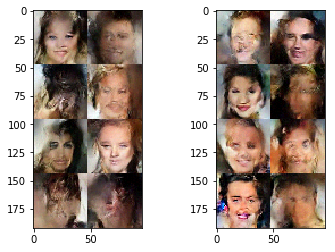

In [47]:
for i in range(5):
    utils.trainer(
        sess, 
        num_steps=1000, 
        train_op=train_op, 
        feed_dict_fn=lambda: {lr_ph: 0.0005, beta_ph: 1.0}, 
        metrics=[metrics], 
        hooks=[plot_metrics_hook]
    )
    
    plt.subplot(121)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))
    plt.subplot(122)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 1.0}))
    plt.show()


  5%|▌         | 51/1000 [00:10<03:11,  4.95it/s]

total_loss -6.643838
loss_per_pixel -6.7398925
l2_loss 0.09605451



 10%|█         | 100/1000 [00:20<03:03,  4.92it/s]

total_loss -6.7201033
loss_per_pixel -6.8161244
l2_loss 0.0960211



 15%|█▌        | 151/1000 [00:30<02:50,  4.98it/s]

total_loss -6.5391126
loss_per_pixel -6.635097
l2_loss 0.09598427



 20%|██        | 201/1000 [00:40<02:39,  5.00it/s]

total_loss -6.658671
loss_per_pixel -6.7546196
l2_loss 0.09594865



 25%|██▌       | 251/1000 [00:50<02:30,  4.99it/s]

total_loss -6.84768
loss_per_pixel -6.9435935
l2_loss 0.09591335



 30%|███       | 301/1000 [01:00<02:20,  4.97it/s]

total_loss -6.6895556
loss_per_pixel -6.785433
l2_loss 0.09587697



 35%|███▌      | 351/1000 [01:10<02:09,  4.99it/s]

total_loss -6.802039
loss_per_pixel -6.897883
l2_loss 0.09584375



 40%|████      | 401/1000 [01:19<01:59,  5.02it/s]

total_loss -6.6425066
loss_per_pixel -6.738315
l2_loss 0.0958087



 45%|████▌     | 451/1000 [01:30<01:49,  5.00it/s]

total_loss -6.8548374
loss_per_pixel -6.950613
l2_loss 0.09577554



 50%|█████     | 500/1000 [01:39<01:39,  5.03it/s]

total_loss -6.734863
loss_per_pixel -6.830604
l2_loss 0.09574144



 55%|█████▌    | 550/1000 [01:49<01:29,  5.04it/s]


total_loss -6.5502987
loss_per_pixel -6.646004
l2_loss 0.09570542


 60%|██████    | 601/1000 [01:59<01:19,  5.03it/s]

total_loss -6.602126
loss_per_pixel -6.6977973
l2_loss 0.095671415



 65%|██████▌   | 651/1000 [02:09<01:09,  5.03it/s]

total_loss -6.8440547
loss_per_pixel -6.939694
l2_loss 0.09563918



 70%|███████   | 700/1000 [02:18<00:59,  5.04it/s]

total_loss -6.609715
loss_per_pixel -6.7053227
l2_loss 0.09560775



 75%|███████▌  | 751/1000 [02:28<00:49,  5.04it/s]

total_loss -6.539727
loss_per_pixel -6.635301
l2_loss 0.095573686



 80%|████████  | 800/1000 [02:38<00:39,  5.05it/s]

total_loss -6.764753
loss_per_pixel -6.860295
l2_loss 0.09554172



 85%|████████▌ | 850/1000 [02:48<00:29,  5.05it/s]

total_loss -6.3729706
loss_per_pixel -6.468481
l2_loss 0.0955107



 90%|█████████ | 900/1000 [02:58<00:19,  5.03it/s]

total_loss -6.704516
loss_per_pixel -6.799996
l2_loss 0.095480025



 95%|█████████▌| 951/1000 [03:08<00:09,  5.04it/s]

total_loss -6.6412897
loss_per_pixel -6.736738
l2_loss 0.09544872



100%|█████████▉| 999/1000 [03:18<00:00,  5.04it/s]

total_loss -6.606737
loss_per_pixel -6.7021556
l2_loss 0.09541868


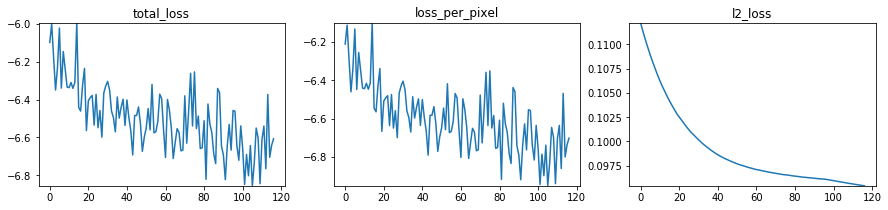


100%|██████████| 1000/1000 [03:18<00:00,  5.03it/s]


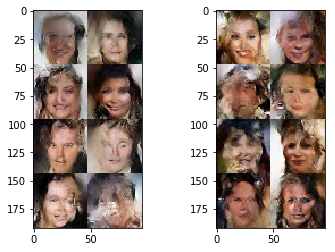


  5%|▌         | 51/1000 [00:10<03:09,  5.01it/s]

total_loss -6.7539563
loss_per_pixel -6.8493457
l2_loss 0.09538926



 10%|█         | 101/1000 [00:19<02:56,  5.10it/s]

total_loss -6.768382
loss_per_pixel -6.8637404
l2_loss 0.09535827



 15%|█▌        | 151/1000 [00:29<02:45,  5.13it/s]

total_loss -6.917883
loss_per_pixel -7.0132117
l2_loss 0.09532864



 20%|██        | 200/1000 [00:39<02:36,  5.12it/s]

total_loss -6.7081566
loss_per_pixel -6.803455
l2_loss 0.095298395



 25%|██▌       | 250/1000 [00:48<02:26,  5.13it/s]

total_loss -6.528063
loss_per_pixel -6.6233325
l2_loss 0.095269814



 30%|███       | 300/1000 [00:59<02:17,  5.08it/s]

total_loss -6.690436
loss_per_pixel -6.7856746
l2_loss 0.09523886



 35%|███▌      | 351/1000 [01:09<02:08,  5.07it/s]

total_loss -7.02381
loss_per_pixel -7.1190205
l2_loss 0.09521032



 40%|████      | 401/1000 [01:19<01:58,  5.06it/s]

total_loss -6.902642
loss_per_pixel -6.997823
l2_loss 0.09518139



 45%|████▌     | 451/1000 [01:29<01:48,  5.05it/s]

total_loss -6.7476215
loss_per_pixel -6.842776
l2_loss 0.095154196



 50%|█████     | 501/1000 [01:38<01:38,  5.06it/s]

total_loss -6.7192163
loss_per_pixel -6.814341
l2_loss 0.09512491



 55%|█████▌    | 550/1000 [01:48<01:28,  5.07it/s]

total_loss -6.8847528
loss_per_pixel -6.9798503
l2_loss 0.09509742



 60%|██████    | 600/1000 [01:58<01:18,  5.06it/s]

total_loss -6.61135
loss_per_pixel -6.706421
l2_loss 0.095070876



 65%|██████▌   | 650/1000 [02:08<01:09,  5.07it/s]

total_loss -7.1062775
loss_per_pixel -7.2013245
l2_loss 0.095046885



 70%|███████   | 701/1000 [02:18<00:59,  5.07it/s]

total_loss -6.5530953
loss_per_pixel -6.64811
l2_loss 0.095014594



 75%|███████▌  | 751/1000 [02:28<00:49,  5.07it/s]

total_loss -6.6247554
loss_per_pixel -6.7197423
l2_loss 0.094986886



 80%|████████  | 800/1000 [02:38<00:39,  5.06it/s]

total_loss -6.9111176
loss_per_pixel -7.00608
l2_loss 0.09496248



 85%|████████▌ | 851/1000 [02:48<00:29,  5.06it/s]

total_loss -6.800805
loss_per_pixel -6.8957424
l2_loss 0.09493709



 90%|█████████ | 901/1000 [02:58<00:19,  5.06it/s]

total_loss -6.7296033
loss_per_pixel -6.824514
l2_loss 0.09491083



 95%|█████████▌| 951/1000 [03:08<00:09,  5.06it/s]

total_loss -7.1072927
loss_per_pixel -7.202177
l2_loss 0.0948844



100%|█████████▉| 999/1000 [03:17<00:00,  5.06it/s]

total_loss -6.5989122
loss_per_pixel -6.693772
l2_loss 0.09485963


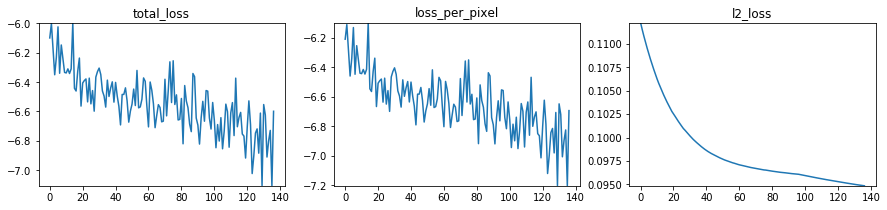


100%|██████████| 1000/1000 [03:18<00:00,  5.05it/s]


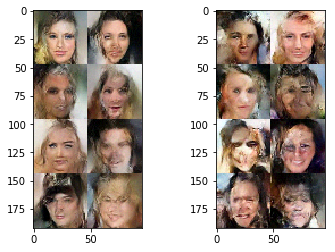


  5%|▌         | 51/1000 [00:10<03:09,  5.02it/s]

total_loss -6.748336
loss_per_pixel -6.8431697
l2_loss 0.09483369



 10%|█         | 100/1000 [00:19<02:58,  5.04it/s]

total_loss -6.6384783
loss_per_pixel -6.7332864
l2_loss 0.094808094



 15%|█▌        | 150/1000 [00:29<02:49,  5.02it/s]

total_loss -6.7117667
loss_per_pixel -6.806551
l2_loss 0.09478431



 20%|██        | 201/1000 [00:40<02:39,  4.99it/s]

total_loss -6.811968
loss_per_pixel -6.9067264
l2_loss 0.094758585



 25%|██▌       | 251/1000 [00:50<02:29,  5.02it/s]

total_loss -6.7730975
loss_per_pixel -6.8678327
l2_loss 0.09473494



 30%|███       | 301/1000 [01:00<02:19,  5.00it/s]

total_loss -6.6996565
loss_per_pixel -6.7943683
l2_loss 0.09471161



 35%|███▌      | 351/1000 [01:09<02:09,  5.02it/s]

total_loss -6.7943835
loss_per_pixel -6.8890686
l2_loss 0.09468491



 40%|████      | 401/1000 [01:19<01:59,  5.03it/s]

total_loss -6.7367086
loss_per_pixel -6.83137
l2_loss 0.094661236



 45%|████▌     | 451/1000 [01:29<01:48,  5.05it/s]

total_loss -6.8929086
loss_per_pixel -6.987547
l2_loss 0.09463847



 50%|█████     | 500/1000 [01:39<01:39,  5.05it/s]

total_loss -6.625782
loss_per_pixel -6.7203975
l2_loss 0.094615616



 55%|█████▌    | 551/1000 [01:49<01:28,  5.05it/s]

total_loss -6.860169
loss_per_pixel -6.954761
l2_loss 0.09459211



 60%|██████    | 600/1000 [01:58<01:19,  5.06it/s]

total_loss -6.6306787
loss_per_pixel -6.725247
l2_loss 0.094568044



 65%|██████▌   | 651/1000 [02:09<01:09,  5.05it/s]

total_loss -6.60168
loss_per_pixel -6.6962237
l2_loss 0.09454385



 70%|███████   | 700/1000 [02:18<00:59,  5.04it/s]

total_loss -7.0893316
loss_per_pixel -7.1838536
l2_loss 0.09452184



 75%|███████▌  | 751/1000 [02:29<00:49,  5.04it/s]

total_loss -6.4878674
loss_per_pixel -6.5823674
l2_loss 0.09449994



 80%|████████  | 800/1000 [02:38<00:39,  5.04it/s]

total_loss -6.619079
loss_per_pixel -6.7135577
l2_loss 0.09447878



 85%|████████▌ | 850/1000 [02:48<00:29,  5.04it/s]

total_loss -6.9483337
loss_per_pixel -7.0427876
l2_loss 0.09445405



 90%|█████████ | 901/1000 [02:58<00:19,  5.04it/s]

total_loss -6.58738
loss_per_pixel -6.6818137
l2_loss 0.09443381



 95%|█████████▌| 950/1000 [03:08<00:09,  5.04it/s]

total_loss -6.5048604
loss_per_pixel -6.599273
l2_loss 0.094413



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.686304
loss_per_pixel -6.7806935
l2_loss 0.0943894


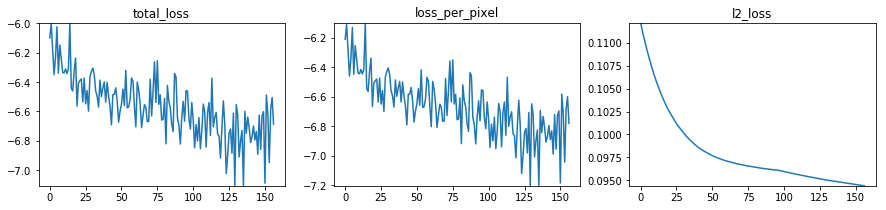


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


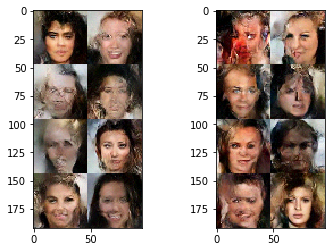


  5%|▌         | 51/1000 [00:10<03:06,  5.10it/s]

total_loss -6.6447124
loss_per_pixel -6.7390804
l2_loss 0.09436802



 10%|█         | 101/1000 [00:20<02:58,  5.05it/s]

total_loss -6.392949
loss_per_pixel -6.487297
l2_loss 0.09434781



 15%|█▌        | 150/1000 [00:29<02:48,  5.04it/s]

total_loss -6.68496
loss_per_pixel -6.779287
l2_loss 0.09432704



 20%|██        | 201/1000 [00:39<02:38,  5.05it/s]

total_loss -6.6941743
loss_per_pixel -6.7884793
l2_loss 0.094305165



 25%|██▌       | 250/1000 [00:49<02:29,  5.02it/s]

total_loss -6.793513
loss_per_pixel -6.887798
l2_loss 0.094284795



 30%|███       | 301/1000 [00:59<02:18,  5.03it/s]

total_loss -6.5584683
loss_per_pixel -6.6527324
l2_loss 0.094263904



 35%|███▌      | 351/1000 [01:09<02:08,  5.06it/s]

total_loss -6.782033
loss_per_pixel -6.8762774
l2_loss 0.0942447



 40%|████      | 401/1000 [01:18<01:57,  5.08it/s]

total_loss -6.700352
loss_per_pixel -6.7945743
l2_loss 0.094222



 45%|████▌     | 450/1000 [01:28<01:48,  5.06it/s]

total_loss -6.7251744
loss_per_pixel -6.8193765
l2_loss 0.094202265



 50%|█████     | 500/1000 [01:38<01:38,  5.06it/s]

total_loss -6.4761457
loss_per_pixel -6.570328
l2_loss 0.094182625



 55%|█████▌    | 550/1000 [01:48<01:28,  5.06it/s]

total_loss -6.7133117
loss_per_pixel -6.8074727
l2_loss 0.09416113



 60%|██████    | 601/1000 [01:58<01:18,  5.05it/s]

total_loss -6.753317
loss_per_pixel -6.8474584
l2_loss 0.09414165



 65%|██████▌   | 651/1000 [02:08<01:09,  5.06it/s]

total_loss -6.518843
loss_per_pixel -6.612964
l2_loss 0.09412099



 70%|███████   | 701/1000 [02:18<00:59,  5.06it/s]

total_loss -6.5528064
loss_per_pixel -6.646908
l2_loss 0.094101615



 75%|███████▌  | 751/1000 [02:28<00:49,  5.05it/s]

total_loss -6.557433
loss_per_pixel -6.6515155
l2_loss 0.09408221



 80%|████████  | 801/1000 [02:38<00:39,  5.05it/s]

total_loss -6.8810596
loss_per_pixel -6.97512
l2_loss 0.0940605



 85%|████████▌ | 851/1000 [02:48<00:29,  5.05it/s]

total_loss -6.911029
loss_per_pixel -7.005071
l2_loss 0.09404215



 90%|█████████ | 901/1000 [02:58<00:19,  5.05it/s]

total_loss -6.6009903
loss_per_pixel -6.6950154
l2_loss 0.09402511



 95%|█████████▌| 951/1000 [03:07<00:09,  5.06it/s]

total_loss -6.831527
loss_per_pixel -6.9255333
l2_loss 0.09400628



100%|█████████▉| 999/1000 [03:17<00:00,  5.06it/s]

total_loss -6.8023005
loss_per_pixel -6.896288
l2_loss 0.09398738


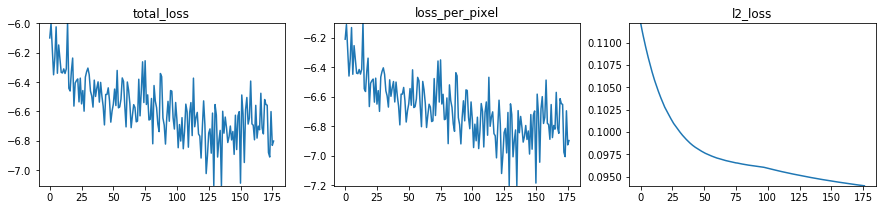


100%|██████████| 1000/1000 [03:17<00:00,  5.05it/s]


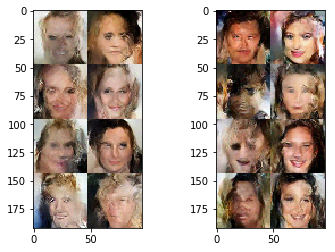


  5%|▌         | 50/1000 [00:10<03:10,  4.99it/s]

total_loss -6.742523
loss_per_pixel -6.83649
l2_loss 0.09396694



 10%|█         | 100/1000 [00:19<02:58,  5.06it/s]

total_loss -6.4410977
loss_per_pixel -6.535047
l2_loss 0.09394927



 15%|█▌        | 150/1000 [00:29<02:46,  5.11it/s]

total_loss -6.8397083
loss_per_pixel -6.933641
l2_loss 0.0939327



 20%|██        | 201/1000 [00:39<02:38,  5.05it/s]

total_loss -6.8677964
loss_per_pixel -6.9617114
l2_loss 0.09391477



 25%|██▌       | 250/1000 [00:49<02:27,  5.07it/s]

total_loss -6.6746273
loss_per_pixel -6.768521
l2_loss 0.093893595



 30%|███       | 300/1000 [00:59<02:18,  5.06it/s]

total_loss -6.669721
loss_per_pixel -6.763598
l2_loss 0.09387677



 35%|███▌      | 351/1000 [01:09<02:08,  5.07it/s]

total_loss -6.5020576
loss_per_pixel -6.5959153
l2_loss 0.09385772



 40%|████      | 401/1000 [01:19<01:58,  5.06it/s]

total_loss -6.7770205
loss_per_pixel -6.8708615
l2_loss 0.093840934



 45%|████▌     | 451/1000 [01:29<01:48,  5.06it/s]

total_loss -6.9289045
loss_per_pixel -7.022728
l2_loss 0.093823336



 50%|█████     | 501/1000 [01:38<01:38,  5.07it/s]

total_loss -6.6106014
loss_per_pixel -6.704407
l2_loss 0.09380558



 55%|█████▌    | 551/1000 [01:48<01:28,  5.07it/s]

total_loss -6.673676
loss_per_pixel -6.7674656
l2_loss 0.09378958



 60%|██████    | 600/1000 [01:58<01:18,  5.07it/s]

total_loss -6.799616
loss_per_pixel -6.893387
l2_loss 0.09377093



 65%|██████▌   | 651/1000 [02:08<01:08,  5.07it/s]

total_loss -6.58824
loss_per_pixel -6.6819935
l2_loss 0.09375346



 70%|███████   | 701/1000 [02:18<00:59,  5.07it/s]

total_loss -6.550577
loss_per_pixel -6.6443152
l2_loss 0.09373801



 75%|███████▌  | 751/1000 [02:28<00:49,  5.07it/s]

total_loss -6.6032405
loss_per_pixel -6.696962
l2_loss 0.09372134



 80%|████████  | 801/1000 [02:38<00:39,  5.07it/s]

total_loss -6.783343
loss_per_pixel -6.8770466
l2_loss 0.09370374



 85%|████████▌ | 851/1000 [02:48<00:29,  5.06it/s]

total_loss -6.4390774
loss_per_pixel -6.532765
l2_loss 0.09368776



 90%|█████████ | 901/1000 [02:58<00:19,  5.05it/s]

total_loss -6.7853174
loss_per_pixel -6.8789883
l2_loss 0.09367062



 95%|█████████▌| 951/1000 [03:08<00:09,  5.06it/s]

total_loss -6.5289025
loss_per_pixel -6.622555
l2_loss 0.093652256



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.737797
loss_per_pixel -6.831432
l2_loss 0.093634926


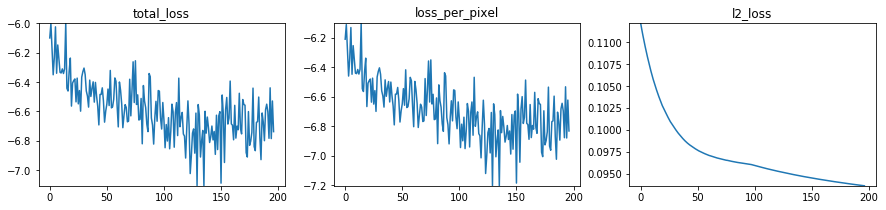


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


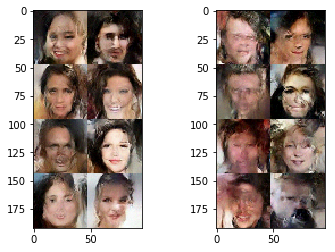

In [48]:
for i in range(5):
    utils.trainer(
        sess, 
        num_steps=1000,
        train_op=train_op, 
        feed_dict_fn=lambda: {lr_ph: 0.0001, beta_ph: 1.0}, 
        metrics=[metrics], 
        hooks=[plot_metrics_hook]
    )
    
    plt.subplot(121)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))
    plt.subplot(122)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 1.0}))
    plt.show()


  5%|▌         | 51/1000 [00:09<03:03,  5.17it/s]

total_loss -6.75711
loss_per_pixel -6.8507423
l2_loss 0.09363208



 10%|█         | 101/1000 [00:19<02:56,  5.10it/s]

total_loss -6.8303304
loss_per_pixel -6.9239597
l2_loss 0.09362914



 15%|█▌        | 151/1000 [00:29<02:46,  5.10it/s]

total_loss -6.614999
loss_per_pixel -6.7086253
l2_loss 0.09362671



 20%|██        | 201/1000 [00:39<02:36,  5.11it/s]

total_loss -6.811075
loss_per_pixel -6.9046993
l2_loss 0.09362416



 25%|██▌       | 250/1000 [00:49<02:27,  5.09it/s]

total_loss -6.856942
loss_per_pixel -6.950563
l2_loss 0.093621016



 30%|███       | 301/1000 [00:59<02:17,  5.10it/s]

total_loss -6.876079
loss_per_pixel -6.969698
l2_loss 0.09361876



 35%|███▌      | 351/1000 [01:08<02:07,  5.09it/s]

total_loss -6.631982
loss_per_pixel -6.725598
l2_loss 0.09361613



 40%|████      | 401/1000 [01:18<01:57,  5.09it/s]

total_loss -6.7403684
loss_per_pixel -6.833981
l2_loss 0.0936128



 45%|████▌     | 451/1000 [01:29<01:48,  5.07it/s]

total_loss -6.740465
loss_per_pixel -6.8340755
l2_loss 0.09361037



 50%|█████     | 501/1000 [01:39<01:38,  5.05it/s]

total_loss -6.5397143
loss_per_pixel -6.6333222
l2_loss 0.09360782



 55%|█████▌    | 550/1000 [01:49<01:29,  5.03it/s]

total_loss -6.9458876
loss_per_pixel -7.039493
l2_loss 0.0936054



 60%|██████    | 601/1000 [01:59<01:19,  5.02it/s]

total_loss -6.782468
loss_per_pixel -6.87607
l2_loss 0.09360242



 65%|██████▌   | 651/1000 [02:09<01:09,  5.03it/s]

total_loss -6.6653996
loss_per_pixel -6.7589993
l2_loss 0.09359961



 70%|███████   | 701/1000 [02:19<00:59,  5.03it/s]

total_loss -6.6692605
loss_per_pixel -6.7628574
l2_loss 0.09359699



 75%|███████▌  | 751/1000 [02:29<00:49,  5.03it/s]

total_loss -6.53367
loss_per_pixel -6.627264
l2_loss 0.09359425



 80%|████████  | 800/1000 [02:38<00:39,  5.04it/s]

total_loss -6.5889373
loss_per_pixel -6.682529
l2_loss 0.09359163



 85%|████████▌ | 851/1000 [02:48<00:29,  5.05it/s]

total_loss -6.664101
loss_per_pixel -6.75769
l2_loss 0.093588814



 90%|█████████ | 901/1000 [02:58<00:19,  5.05it/s]

total_loss -6.694336
loss_per_pixel -6.7879224
l2_loss 0.09358641



 95%|█████████▌| 951/1000 [03:08<00:09,  5.05it/s]

total_loss -6.579353
loss_per_pixel -6.672936
l2_loss 0.09358334



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.6404276
loss_per_pixel -6.7340083
l2_loss 0.093580835


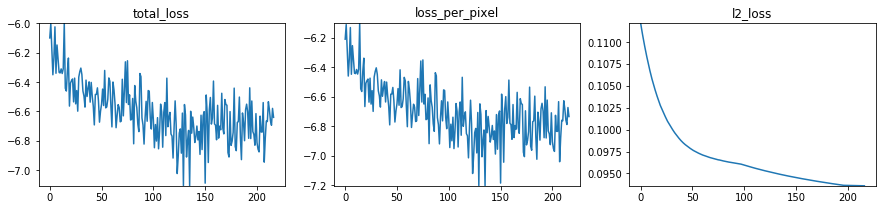


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


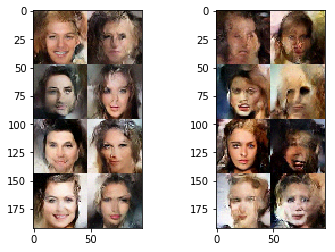


  5%|▌         | 51/1000 [00:10<03:10,  4.99it/s]

total_loss -6.733013
loss_per_pixel -6.826591
l2_loss 0.093577944



 10%|█         | 101/1000 [00:19<02:57,  5.07it/s]

total_loss -6.7430153
loss_per_pixel -6.8365903
l2_loss 0.093575135



 15%|█▌        | 150/1000 [00:29<02:48,  5.04it/s]


total_loss -6.7033052
loss_per_pixel -6.7968783
l2_loss 0.09357299


 20%|██        | 201/1000 [00:39<02:38,  5.04it/s]

total_loss -6.785157
loss_per_pixel -6.8787274
l2_loss 0.09357038



 25%|██▌       | 251/1000 [00:49<02:28,  5.04it/s]

total_loss -6.472995
loss_per_pixel -6.566562
l2_loss 0.09356741



 30%|███       | 300/1000 [00:58<02:17,  5.09it/s]

total_loss -6.6647906
loss_per_pixel -6.7583556
l2_loss 0.09356479



 35%|███▌      | 351/1000 [01:08<02:07,  5.09it/s]

total_loss -6.53898
loss_per_pixel -6.6325417
l2_loss 0.09356188



 40%|████      | 401/1000 [01:18<01:57,  5.08it/s]

total_loss -6.806579
loss_per_pixel -6.9001384
l2_loss 0.09355933



 45%|████▌     | 451/1000 [01:28<01:47,  5.10it/s]

total_loss -6.6609674
loss_per_pixel -6.7545238
l2_loss 0.093556456



 50%|█████     | 501/1000 [01:38<01:37,  5.10it/s]

total_loss -6.6705914
loss_per_pixel -6.764145
l2_loss 0.09355373



 55%|█████▌    | 551/1000 [01:47<01:27,  5.10it/s]

total_loss -6.6957855
loss_per_pixel -6.7893367
l2_loss 0.09355096



 60%|██████    | 601/1000 [01:57<01:18,  5.10it/s]

total_loss -6.6762505
loss_per_pixel -6.7697988
l2_loss 0.09354819



 65%|██████▌   | 650/1000 [02:07<01:08,  5.09it/s]

total_loss -6.647778
loss_per_pixel -6.741324
l2_loss 0.09354576



 70%|███████   | 700/1000 [02:17<00:59,  5.08it/s]

total_loss -6.646556
loss_per_pixel -6.740099
l2_loss 0.09354299



 75%|███████▌  | 751/1000 [02:28<00:49,  5.07it/s]

total_loss -6.684277
loss_per_pixel -6.7778172
l2_loss 0.09354007



 80%|████████  | 801/1000 [02:37<00:39,  5.07it/s]

total_loss -6.698898
loss_per_pixel -6.792435
l2_loss 0.09353741



 85%|████████▌ | 851/1000 [02:47<00:29,  5.08it/s]

total_loss -6.575879
loss_per_pixel -6.669414
l2_loss 0.09353499



 90%|█████████ | 901/1000 [02:57<00:19,  5.08it/s]

total_loss -6.7123914
loss_per_pixel -6.805924
l2_loss 0.09353259



 95%|█████████▌| 950/1000 [03:07<00:09,  5.08it/s]

total_loss -6.6580157
loss_per_pixel -6.7515454
l2_loss 0.0935299



100%|█████████▉| 999/1000 [03:16<00:00,  5.09it/s]

total_loss -6.810437
loss_per_pixel -6.9039645
l2_loss 0.093527175


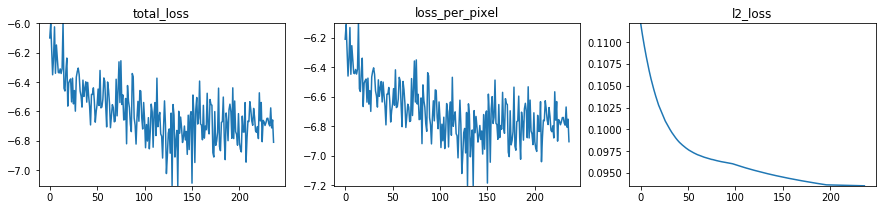


100%|██████████| 1000/1000 [03:16<00:00,  5.08it/s]


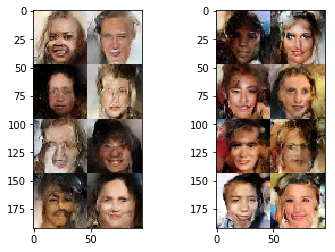


  5%|▌         | 51/1000 [00:09<03:02,  5.21it/s]

total_loss -6.7641973
loss_per_pixel -6.857722
l2_loss 0.09352428



 10%|█         | 100/1000 [00:19<02:53,  5.18it/s]

total_loss -6.466365
loss_per_pixel -6.5598865
l2_loss 0.093521364



 15%|█▌        | 151/1000 [00:29<02:43,  5.21it/s]

total_loss -6.8792715
loss_per_pixel -6.9727902
l2_loss 0.093518876



 20%|██        | 201/1000 [00:38<02:34,  5.16it/s]

total_loss -6.8882875
loss_per_pixel -6.981804
l2_loss 0.09351653



 25%|██▌       | 250/1000 [00:48<02:25,  5.16it/s]

total_loss -6.4926147
loss_per_pixel -6.5861287
l2_loss 0.09351413



 30%|███       | 301/1000 [00:58<02:15,  5.17it/s]

total_loss -6.7398396
loss_per_pixel -6.8333507
l2_loss 0.093511336



 35%|███▌      | 351/1000 [01:08<02:06,  5.15it/s]

total_loss -6.9556746
loss_per_pixel -7.0491834
l2_loss 0.09350851



 40%|████      | 401/1000 [01:17<01:56,  5.15it/s]

total_loss -6.7785873
loss_per_pixel -6.8720937
l2_loss 0.09350612



 45%|████▌     | 450/1000 [01:27<01:47,  5.13it/s]

total_loss -6.742066
loss_per_pixel -6.8355694
l2_loss 0.09350354



 50%|█████     | 500/1000 [01:37<01:37,  5.12it/s]

total_loss -6.655292
loss_per_pixel -6.7487926
l2_loss 0.09350081



 55%|█████▌    | 551/1000 [01:47<01:27,  5.13it/s]

total_loss -6.6777425
loss_per_pixel -6.7712407
l2_loss 0.093498394



 60%|██████    | 600/1000 [01:56<01:17,  5.13it/s]

total_loss -6.5753307
loss_per_pixel -6.6688266
l2_loss 0.093495935



 65%|██████▌   | 651/1000 [02:06<01:07,  5.14it/s]

total_loss -6.83448
loss_per_pixel -6.927973
l2_loss 0.09349289



 70%|███████   | 701/1000 [02:16<00:58,  5.13it/s]

total_loss -6.6614747
loss_per_pixel -6.7549653
l2_loss 0.0934904



 75%|███████▌  | 751/1000 [02:26<00:48,  5.12it/s]

total_loss -6.7365046
loss_per_pixel -6.829992
l2_loss 0.09348739



 80%|████████  | 801/1000 [02:36<00:38,  5.13it/s]

total_loss -6.6652045
loss_per_pixel -6.7586894
l2_loss 0.0934851



 85%|████████▌ | 851/1000 [02:46<00:29,  5.11it/s]

total_loss -6.8497434
loss_per_pixel -6.9432254
l2_loss 0.09348224



 90%|█████████ | 900/1000 [02:56<00:19,  5.10it/s]

total_loss -6.8772907
loss_per_pixel -6.97077
l2_loss 0.09347938



 95%|█████████▌| 951/1000 [03:06<00:09,  5.11it/s]

total_loss -6.8500066
loss_per_pixel -6.9434834
l2_loss 0.09347689



100%|█████████▉| 999/1000 [03:15<00:00,  5.11it/s]

total_loss -6.510023
loss_per_pixel -6.603497
l2_loss 0.09347396


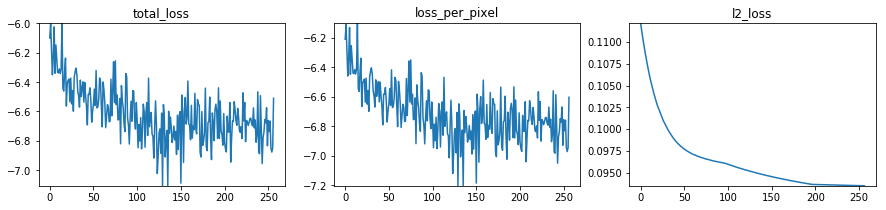


100%|██████████| 1000/1000 [03:16<00:00,  5.10it/s]


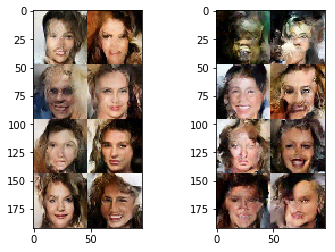


  5%|▌         | 51/1000 [00:10<03:11,  4.95it/s]

total_loss -6.81734
loss_per_pixel -6.910812
l2_loss 0.09347179



 10%|█         | 101/1000 [00:19<02:56,  5.10it/s]

total_loss -6.900136
loss_per_pixel -6.993605
l2_loss 0.093469225



 15%|█▌        | 151/1000 [00:29<02:46,  5.11it/s]

total_loss -7.0103765
loss_per_pixel -7.103843
l2_loss 0.09346668



 20%|██        | 201/1000 [00:39<02:36,  5.10it/s]

total_loss -6.6798024
loss_per_pixel -6.7732663
l2_loss 0.09346379



 25%|██▌       | 250/1000 [00:49<02:28,  5.06it/s]

total_loss -6.8419676
loss_per_pixel -6.935429
l2_loss 0.093461454



 30%|███       | 301/1000 [00:59<02:17,  5.10it/s]

total_loss -6.8002543
loss_per_pixel -6.893713
l2_loss 0.09345856



 35%|███▌      | 351/1000 [01:08<02:07,  5.10it/s]

total_loss -6.672938
loss_per_pixel -6.7663937
l2_loss 0.093456



 40%|████      | 400/1000 [01:18<01:57,  5.09it/s]

total_loss -6.8425436
loss_per_pixel -6.935997
l2_loss 0.093453474



 45%|████▌     | 451/1000 [01:29<01:48,  5.06it/s]

total_loss -6.935823
loss_per_pixel -7.029274
l2_loss 0.09345115



 50%|█████     | 500/1000 [01:38<01:38,  5.06it/s]

total_loss -6.822792
loss_per_pixel -6.91624
l2_loss 0.09344832



 55%|█████▌    | 550/1000 [01:48<01:29,  5.06it/s]

total_loss -6.5922456
loss_per_pixel -6.6856914
l2_loss 0.093445644



 60%|██████    | 601/1000 [01:58<01:18,  5.06it/s]

total_loss -6.707157
loss_per_pixel -6.8006005
l2_loss 0.09344355



 65%|██████▌   | 650/1000 [02:08<01:09,  5.07it/s]

total_loss -6.854072
loss_per_pixel -6.947513
l2_loss 0.093440786



 70%|███████   | 701/1000 [02:18<00:58,  5.07it/s]

total_loss -6.542502
loss_per_pixel -6.63594
l2_loss 0.09343814



 75%|███████▌  | 750/1000 [02:28<00:49,  5.07it/s]


total_loss -6.7627316
loss_per_pixel -6.8561673
l2_loss 0.0934357


 80%|████████  | 800/1000 [02:37<00:39,  5.07it/s]

total_loss -6.4590063
loss_per_pixel -6.552439
l2_loss 0.093432665



 85%|████████▌ | 850/1000 [02:47<00:29,  5.07it/s]

total_loss -6.4734035
loss_per_pixel -6.566834
l2_loss 0.093430385



 90%|█████████ | 901/1000 [02:57<00:19,  5.07it/s]

total_loss -6.8693075
loss_per_pixel -6.9627357
l2_loss 0.0934279



 95%|█████████▌| 951/1000 [03:07<00:09,  5.07it/s]

total_loss -6.6474752
loss_per_pixel -6.7409
l2_loss 0.09342503



100%|█████████▉| 999/1000 [03:17<00:00,  5.07it/s]

total_loss -6.7781024
loss_per_pixel -6.8715253
l2_loss 0.09342275


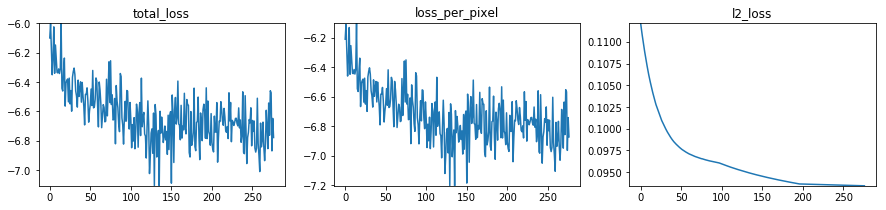


100%|██████████| 1000/1000 [03:17<00:00,  5.06it/s]


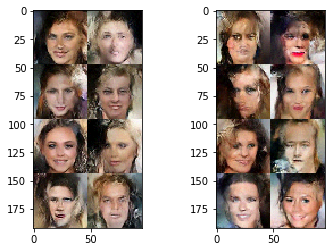


  5%|▌         | 50/1000 [00:09<03:05,  5.11it/s]

total_loss -6.7593923
loss_per_pixel -6.8528123
l2_loss 0.09342004



 10%|█         | 101/1000 [00:20<02:58,  5.04it/s]

total_loss -6.675345
loss_per_pixel -6.7687626
l2_loss 0.09341771



 15%|█▌        | 150/1000 [00:29<02:49,  5.01it/s]

total_loss -6.612157
loss_per_pixel -6.7055717
l2_loss 0.09341494



 20%|██        | 200/1000 [00:39<02:39,  5.01it/s]

total_loss -6.5790396
loss_per_pixel -6.6724524
l2_loss 0.09341277



 25%|██▌       | 251/1000 [00:49<02:28,  5.04it/s]

total_loss -6.4977264
loss_per_pixel -6.5911365
l2_loss 0.093409926



 30%|███       | 300/1000 [00:59<02:18,  5.06it/s]

total_loss -6.7928915
loss_per_pixel -6.8862987
l2_loss 0.09340722



 35%|███▌      | 350/1000 [01:09<02:08,  5.04it/s]

total_loss -6.450215
loss_per_pixel -6.543619
l2_loss 0.09340448



 40%|████      | 401/1000 [01:19<01:59,  5.03it/s]

total_loss -6.5712533
loss_per_pixel -6.6646557
l2_loss 0.093402445



 45%|████▌     | 450/1000 [01:29<01:48,  5.05it/s]

total_loss -6.635106
loss_per_pixel -6.728506
l2_loss 0.09340001



 50%|█████     | 501/1000 [01:39<01:39,  5.03it/s]

total_loss -6.760158
loss_per_pixel -6.8535557
l2_loss 0.093397506



 55%|█████▌    | 551/1000 [01:49<01:29,  5.03it/s]

total_loss -6.5453744
loss_per_pixel -6.638769
l2_loss 0.09339484



 60%|██████    | 601/1000 [01:59<01:19,  5.02it/s]

total_loss -6.940453
loss_per_pixel -7.0338454
l2_loss 0.093392245



 65%|██████▌   | 651/1000 [02:09<01:09,  5.05it/s]

total_loss -6.5906878
loss_per_pixel -6.6840777
l2_loss 0.09338983



 70%|███████   | 700/1000 [02:18<00:59,  5.05it/s]

total_loss -6.5811224
loss_per_pixel -6.6745095
l2_loss 0.093387105



 75%|███████▌  | 751/1000 [02:28<00:49,  5.06it/s]

total_loss -6.669217
loss_per_pixel -6.7626014
l2_loss 0.09338449



 80%|████████  | 800/1000 [02:37<00:39,  5.06it/s]

total_loss -6.7290926
loss_per_pixel -6.822475
l2_loss 0.0933822



 85%|████████▌ | 851/1000 [02:48<00:29,  5.06it/s]

total_loss -6.8038754
loss_per_pixel -6.897255
l2_loss 0.09337949



 90%|█████████ | 900/1000 [02:57<00:19,  5.06it/s]

total_loss -6.6644106
loss_per_pixel -6.7577877
l2_loss 0.09337705



 95%|█████████▌| 950/1000 [03:08<00:09,  5.05it/s]

total_loss -6.731008
loss_per_pixel -6.824383
l2_loss 0.09337468



100%|█████████▉| 999/1000 [03:18<00:00,  5.04it/s]

total_loss -6.7298183
loss_per_pixel -6.82319
l2_loss 0.093371905


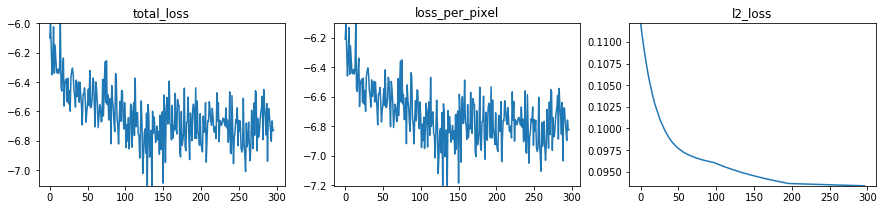


100%|██████████| 1000/1000 [03:18<00:00,  5.03it/s]


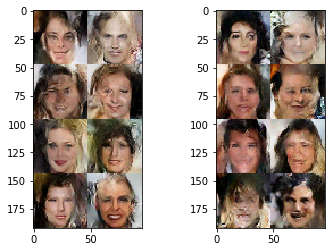

In [49]:
for i in range(5):
    utils.trainer(
        sess, 
        num_steps=1000, 
        train_op=train_op, 
        feed_dict_fn=lambda: {lr_ph: 0.00001, beta_ph: 1.0}, 
        metrics=[metrics], 
        hooks=[plot_metrics_hook]
    )
    
    plt.subplot(121)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))
    plt.subplot(122)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 1.0}))
    plt.show()


  5%|▌         | 50/1000 [00:09<03:07,  5.06it/s]

total_loss -6.7297297
loss_per_pixel -6.823086
l2_loss 0.09335623



 10%|█         | 101/1000 [00:19<02:56,  5.09it/s]

total_loss -6.7695503
loss_per_pixel -6.8628926
l2_loss 0.093342274



 15%|█▌        | 150/1000 [00:29<02:48,  5.06it/s]

total_loss -6.4011536
loss_per_pixel -6.494482
l2_loss 0.09332825



 20%|██        | 201/1000 [00:39<02:37,  5.08it/s]

total_loss -6.800393
loss_per_pixel -6.8937078
l2_loss 0.09331466



 25%|██▌       | 251/1000 [00:49<02:26,  5.11it/s]

total_loss -6.7820387
loss_per_pixel -6.8753414
l2_loss 0.09330262



 30%|███       | 301/1000 [00:58<02:16,  5.12it/s]

total_loss -6.845054
loss_per_pixel -6.9383435
l2_loss 0.09328958



 35%|███▌      | 351/1000 [01:09<02:07,  5.08it/s]

total_loss -6.6093683
loss_per_pixel -6.702645
l2_loss 0.093276635



 40%|████      | 401/1000 [01:18<01:57,  5.10it/s]

total_loss -6.8550153
loss_per_pixel -6.948281
l2_loss 0.093265645



 45%|████▌     | 451/1000 [01:28<01:47,  5.10it/s]

total_loss -6.63076
loss_per_pixel -6.724014
l2_loss 0.09325374



 50%|█████     | 500/1000 [01:37<01:37,  5.10it/s]

total_loss -6.628275
loss_per_pixel -6.721514
l2_loss 0.093239315



 55%|█████▌    | 550/1000 [01:48<01:28,  5.08it/s]

total_loss -6.5452065
loss_per_pixel -6.6384315
l2_loss 0.093225054



 60%|██████    | 601/1000 [01:58<01:18,  5.07it/s]

total_loss -6.7136703
loss_per_pixel -6.8068824
l2_loss 0.09321203



 65%|██████▌   | 651/1000 [02:08<01:08,  5.06it/s]

total_loss -6.778782
loss_per_pixel -6.8719807
l2_loss 0.09319866



 70%|███████   | 701/1000 [02:18<00:58,  5.07it/s]

total_loss -6.85599
loss_per_pixel -6.949175
l2_loss 0.09318483



 75%|███████▌  | 751/1000 [02:28<00:49,  5.07it/s]

total_loss -6.780794
loss_per_pixel -6.8739643
l2_loss 0.09317026



 80%|████████  | 801/1000 [02:37<00:39,  5.08it/s]

total_loss -6.6530037
loss_per_pixel -6.746162
l2_loss 0.093158364



 85%|████████▌ | 851/1000 [02:47<00:29,  5.08it/s]

total_loss -6.8033314
loss_per_pixel -6.896477
l2_loss 0.09314571



 90%|█████████ | 901/1000 [02:57<00:19,  5.08it/s]

total_loss -6.4406967
loss_per_pixel -6.5338283
l2_loss 0.09313152



 95%|█████████▌| 950/1000 [03:07<00:09,  5.08it/s]


total_loss -6.620537
loss_per_pixel -6.713654
l2_loss 0.09311711


100%|█████████▉| 999/1000 [03:16<00:00,  5.08it/s]

total_loss -6.8904657
loss_per_pixel -6.9835696
l2_loss 0.09310398


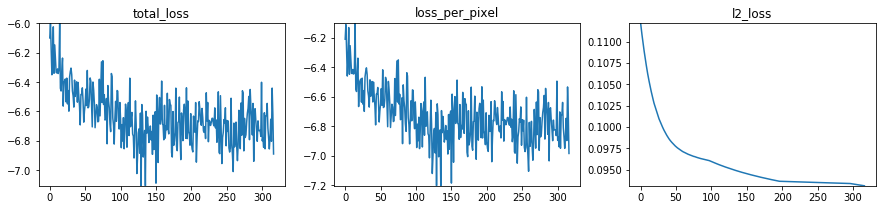


100%|██████████| 1000/1000 [03:17<00:00,  5.07it/s]


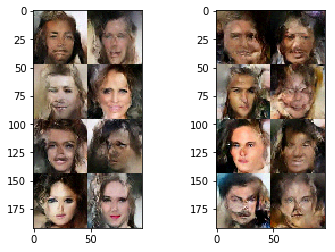


  5%|▌         | 51/1000 [00:10<03:11,  4.96it/s]

total_loss -6.647315
loss_per_pixel -6.7404046
l2_loss 0.093089774



 10%|█         | 100/1000 [00:20<03:00,  4.97it/s]

total_loss -6.548939
loss_per_pixel -6.6420155
l2_loss 0.093076445



 15%|█▌        | 151/1000 [00:30<02:49,  5.00it/s]

total_loss -6.3973923
loss_per_pixel -6.490454
l2_loss 0.09306199



 20%|██        | 200/1000 [00:40<02:40,  4.99it/s]

total_loss -6.6948385
loss_per_pixel -6.787888
l2_loss 0.09304936



 25%|██▌       | 251/1000 [00:50<02:30,  4.99it/s]

total_loss -6.6856594
loss_per_pixel -6.7786937
l2_loss 0.09303449



 30%|███       | 301/1000 [01:00<02:19,  4.99it/s]

total_loss -6.771656
loss_per_pixel -6.8646793
l2_loss 0.09302326



 35%|███▌      | 350/1000 [01:09<02:09,  5.01it/s]

total_loss -6.8829446
loss_per_pixel -6.9759555
l2_loss 0.09301093



 40%|████      | 401/1000 [01:20<02:00,  4.99it/s]

total_loss -6.632089
loss_per_pixel -6.7250876
l2_loss 0.09299865



 45%|████▌     | 451/1000 [01:30<01:49,  5.00it/s]

total_loss -6.8055186
loss_per_pixel -6.898504
l2_loss 0.09298496



 50%|█████     | 501/1000 [01:39<01:39,  5.02it/s]

total_loss -6.7879553
loss_per_pixel -6.880928
l2_loss 0.09297255



 55%|█████▌    | 551/1000 [01:50<01:29,  5.01it/s]

total_loss -6.6505127
loss_per_pixel -6.7434726
l2_loss 0.09295993



 60%|██████    | 601/1000 [01:59<01:19,  5.01it/s]

total_loss -6.5995073
loss_per_pixel -6.6924534
l2_loss 0.09294612



 65%|██████▌   | 651/1000 [02:09<01:09,  5.02it/s]

total_loss -6.7760487
loss_per_pixel -6.8689837
l2_loss 0.0929353



 70%|███████   | 701/1000 [02:19<00:59,  5.01it/s]

total_loss -6.756437
loss_per_pixel -6.8493595
l2_loss 0.09292288



 75%|███████▌  | 751/1000 [02:29<00:49,  5.01it/s]

total_loss -6.697183
loss_per_pixel -6.7900944
l2_loss 0.09291125



 80%|████████  | 801/1000 [02:39<00:39,  5.01it/s]

total_loss -6.720091
loss_per_pixel -6.812988
l2_loss 0.09289689



 85%|████████▌ | 851/1000 [02:49<00:29,  5.01it/s]

total_loss -6.837992
loss_per_pixel -6.930877
l2_loss 0.09288483



 90%|█████████ | 901/1000 [02:59<00:19,  5.02it/s]

total_loss -6.5617323
loss_per_pixel -6.654604
l2_loss 0.09287147



 95%|█████████▌| 950/1000 [03:08<00:09,  5.03it/s]

total_loss -6.7211685
loss_per_pixel -6.8140283
l2_loss 0.09285976



100%|█████████▉| 999/1000 [03:18<00:00,  5.03it/s]

total_loss -6.6625147
loss_per_pixel -6.7553616
l2_loss 0.09284676


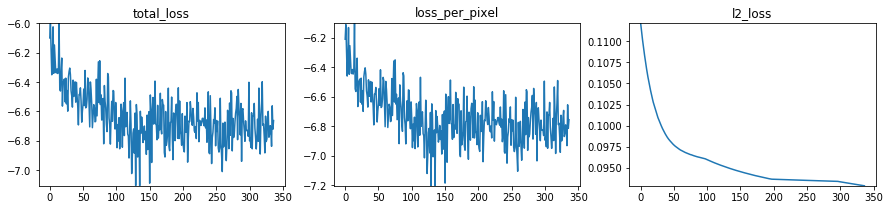


100%|██████████| 1000/1000 [03:19<00:00,  5.02it/s]


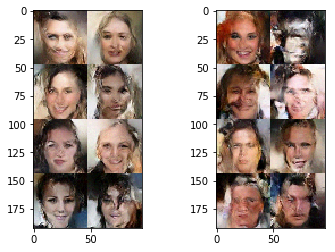


  5%|▌         | 51/1000 [00:09<03:03,  5.18it/s]

total_loss -6.6746254
loss_per_pixel -6.7674575
l2_loss 0.092832185



 10%|█         | 101/1000 [00:19<02:56,  5.08it/s]

total_loss -6.8560543
loss_per_pixel -6.948875
l2_loss 0.09282065



 15%|█▌        | 151/1000 [00:29<02:46,  5.11it/s]

total_loss -7.109079
loss_per_pixel -7.201887
l2_loss 0.092808165



 20%|██        | 200/1000 [00:39<02:37,  5.09it/s]

total_loss -6.5387864
loss_per_pixel -6.6315837
l2_loss 0.09279715



 25%|██▌       | 251/1000 [00:49<02:27,  5.06it/s]

total_loss -6.781414
loss_per_pixel -6.874199
l2_loss 0.092784755



 30%|███       | 301/1000 [00:59<02:18,  5.04it/s]

total_loss -6.766196
loss_per_pixel -6.858969
l2_loss 0.09277367



 35%|███▌      | 351/1000 [01:09<02:09,  5.02it/s]

total_loss -6.9949913
loss_per_pixel -7.087751
l2_loss 0.09275954



 40%|████      | 400/1000 [01:19<01:59,  5.04it/s]

total_loss -6.785986
loss_per_pixel -6.878734
l2_loss 0.092747994



 45%|████▌     | 450/1000 [01:29<01:49,  5.03it/s]

total_loss -6.655911
loss_per_pixel -6.74865
l2_loss 0.09273903



 50%|█████     | 501/1000 [01:39<01:39,  5.01it/s]

total_loss -6.7419724
loss_per_pixel -6.8346972
l2_loss 0.09272495



 55%|█████▌    | 550/1000 [01:49<01:29,  5.02it/s]

total_loss -6.864956
loss_per_pixel -6.957669
l2_loss 0.092712715



 60%|██████    | 601/1000 [01:59<01:19,  5.04it/s]

total_loss -6.4855666
loss_per_pixel -6.5782647
l2_loss 0.09269808



 65%|██████▌   | 651/1000 [02:09<01:09,  5.04it/s]

total_loss -6.7637
loss_per_pixel -6.8563876
l2_loss 0.09268742



 70%|███████   | 701/1000 [02:18<00:59,  5.05it/s]

total_loss -6.59923
loss_per_pixel -6.6919055
l2_loss 0.09267565



 75%|███████▌  | 751/1000 [02:28<00:49,  5.05it/s]

total_loss -6.6919546
loss_per_pixel -6.78462
l2_loss 0.09266532



 80%|████████  | 801/1000 [02:38<00:39,  5.06it/s]

total_loss -6.6298814
loss_per_pixel -6.7225347
l2_loss 0.0926531



 85%|████████▌ | 850/1000 [02:48<00:29,  5.05it/s]

total_loss -6.689623
loss_per_pixel -6.782264
l2_loss 0.092641234



 90%|█████████ | 900/1000 [02:57<00:19,  5.06it/s]

total_loss -6.4172897
loss_per_pixel -6.5099187
l2_loss 0.092628986



 95%|█████████▌| 950/1000 [03:07<00:09,  5.06it/s]

total_loss -6.7358737
loss_per_pixel -6.8284917
l2_loss 0.092618056



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.5833964
loss_per_pixel -6.6760025
l2_loss 0.09260589


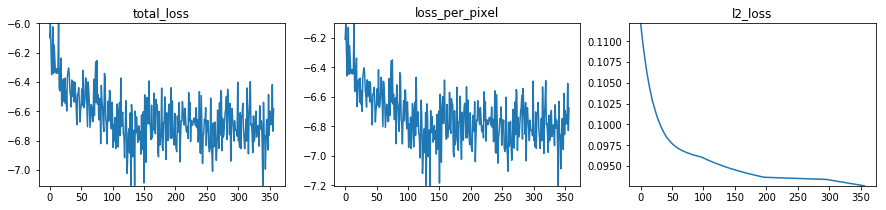


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


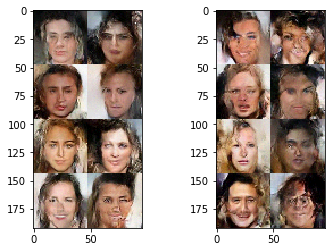


  5%|▌         | 50/1000 [00:10<03:10,  4.98it/s]

total_loss -6.6005626
loss_per_pixel -6.6931553
l2_loss 0.092592694



 10%|█         | 100/1000 [00:20<03:02,  4.92it/s]

total_loss -6.6798177
loss_per_pixel -6.7723994
l2_loss 0.09258156



 15%|█▌        | 151/1000 [00:30<02:51,  4.95it/s]

total_loss -6.698139
loss_per_pixel -6.7907104
l2_loss 0.09257126



 20%|██        | 200/1000 [00:40<02:40,  4.97it/s]

total_loss -6.7201734
loss_per_pixel -6.812734
l2_loss 0.09256072



 25%|██▌       | 251/1000 [00:50<02:30,  4.98it/s]

total_loss -6.5456553
loss_per_pixel -6.6382046
l2_loss 0.09254952



 30%|███       | 301/1000 [01:00<02:19,  5.00it/s]

total_loss -6.830793
loss_per_pixel -6.923332
l2_loss 0.09253953



 35%|███▌      | 350/1000 [01:09<02:09,  5.01it/s]

total_loss -6.517652
loss_per_pixel -6.6101794
l2_loss 0.09252754



 40%|████      | 401/1000 [01:20<01:59,  5.00it/s]

total_loss -6.670686
loss_per_pixel -6.7632008
l2_loss 0.09251493



 45%|████▌     | 451/1000 [01:29<01:49,  5.03it/s]

total_loss -6.8507156
loss_per_pixel -6.94322
l2_loss 0.09250447



 50%|█████     | 501/1000 [01:39<01:38,  5.04it/s]

total_loss -6.986436
loss_per_pixel -7.078928
l2_loss 0.092491865



 55%|█████▌    | 550/1000 [01:49<01:29,  5.04it/s]

total_loss -6.6349006
loss_per_pixel -6.7273784
l2_loss 0.092477754



 60%|██████    | 600/1000 [01:58<01:19,  5.06it/s]

total_loss -6.5110035
loss_per_pixel -6.603468
l2_loss 0.092464685



 65%|██████▌   | 650/1000 [02:08<01:09,  5.06it/s]

total_loss -6.818018
loss_per_pixel -6.910471
l2_loss 0.092453204



 70%|███████   | 700/1000 [02:18<00:59,  5.06it/s]

total_loss -6.9076905
loss_per_pixel -7.0001335
l2_loss 0.09244284



 75%|███████▌  | 750/1000 [02:28<00:49,  5.06it/s]

total_loss -6.7064967
loss_per_pixel -6.7989297
l2_loss 0.09243286



 80%|████████  | 801/1000 [02:38<00:39,  5.07it/s]

total_loss -6.811959
loss_per_pixel -6.9043813
l2_loss 0.09242261



 85%|████████▌ | 850/1000 [02:47<00:29,  5.07it/s]


total_loss -6.7141232
loss_per_pixel -6.8065343
l2_loss 0.09241095


 90%|█████████ | 900/1000 [02:57<00:19,  5.06it/s]

total_loss -6.666294
loss_per_pixel -6.758697
l2_loss 0.09240302



 95%|█████████▌| 950/1000 [03:08<00:09,  5.05it/s]

total_loss -6.6574306
loss_per_pixel -6.749824
l2_loss 0.09239359



100%|█████████▉| 999/1000 [03:18<00:00,  5.04it/s]

total_loss -6.7500157
loss_per_pixel -6.8423953
l2_loss 0.09237973


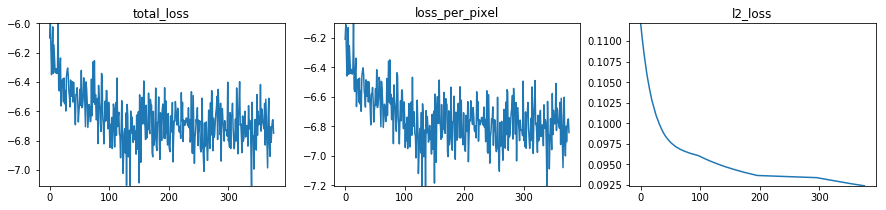


100%|██████████| 1000/1000 [03:18<00:00,  5.03it/s]


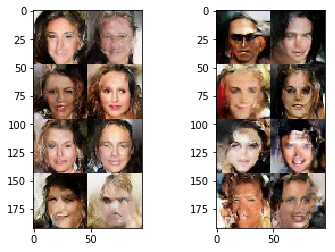


  5%|▌         | 51/1000 [00:10<03:07,  5.07it/s]

total_loss -6.684707
loss_per_pixel -6.777077
l2_loss 0.0923698



 10%|█         | 100/1000 [00:19<02:59,  5.00it/s]

total_loss -6.7022567
loss_per_pixel -6.7946167
l2_loss 0.09236



 15%|█▌        | 151/1000 [00:30<02:48,  5.02it/s]

total_loss -6.5122943
loss_per_pixel -6.604643
l2_loss 0.09234856



 20%|██        | 201/1000 [00:39<02:38,  5.03it/s]

total_loss -6.713549
loss_per_pixel -6.805885
l2_loss 0.09233579



 25%|██▌       | 251/1000 [00:49<02:28,  5.06it/s]

total_loss -6.4870205
loss_per_pixel -6.579348
l2_loss 0.09232759



 30%|███       | 300/1000 [00:59<02:18,  5.05it/s]

total_loss -6.624623
loss_per_pixel -6.716942
l2_loss 0.09231914



 35%|███▌      | 351/1000 [01:09<02:08,  5.04it/s]

total_loss -6.832704
loss_per_pixel -6.9250126
l2_loss 0.092308745



 40%|████      | 401/1000 [01:19<01:58,  5.05it/s]

total_loss -6.69716
loss_per_pixel -6.7894588
l2_loss 0.092299014



 45%|████▌     | 451/1000 [01:29<01:48,  5.04it/s]

total_loss -6.6648703
loss_per_pixel -6.7571564
l2_loss 0.09228608



 50%|█████     | 500/1000 [01:38<01:38,  5.06it/s]

total_loss -6.676618
loss_per_pixel -6.7688937
l2_loss 0.09227558



 55%|█████▌    | 550/1000 [01:49<01:29,  5.04it/s]

total_loss -6.9248896
loss_per_pixel -7.017154
l2_loss 0.09226479



 60%|██████    | 601/1000 [01:59<01:19,  5.04it/s]

total_loss -6.5035567
loss_per_pixel -6.5958104
l2_loss 0.092253536



 65%|██████▌   | 651/1000 [02:08<01:09,  5.06it/s]

total_loss -6.554325
loss_per_pixel -6.6465683
l2_loss 0.09224312



 70%|███████   | 701/1000 [02:18<00:59,  5.05it/s]

total_loss -6.622153
loss_per_pixel -6.7143865
l2_loss 0.09223344



 75%|███████▌  | 750/1000 [02:28<00:49,  5.06it/s]

total_loss -6.871411
loss_per_pixel -6.9636326
l2_loss 0.092221774



 80%|████████  | 801/1000 [02:38<00:39,  5.06it/s]

total_loss -6.82742
loss_per_pixel -6.91963
l2_loss 0.09220993



 85%|████████▌ | 851/1000 [02:48<00:29,  5.06it/s]

total_loss -6.423003
loss_per_pixel -6.515205
l2_loss 0.09220162



 90%|█████████ | 901/1000 [02:58<00:19,  5.06it/s]

total_loss -6.730681
loss_per_pixel -6.8228736
l2_loss 0.09219268



 95%|█████████▌| 951/1000 [03:08<00:09,  5.05it/s]

total_loss -6.816394
loss_per_pixel -6.908575
l2_loss 0.09218113



100%|█████████▉| 999/1000 [03:17<00:00,  5.05it/s]

total_loss -6.6308856
loss_per_pixel -6.7230563
l2_loss 0.0921707


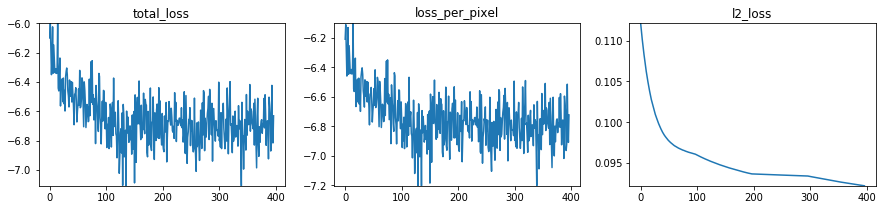


100%|██████████| 1000/1000 [03:18<00:00,  5.04it/s]


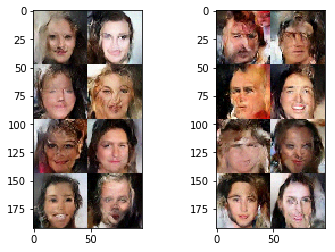

In [50]:
for i in range(5):
    utils.trainer(
        sess, 
        num_steps=1000, 
        train_op=train_op, 
        feed_dict_fn=lambda: {lr_ph: 0.0001, beta_ph: 1.0}, 
        metrics=[metrics], 
        hooks=[plot_metrics_hook]
    )
    
    plt.subplot(121)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))
    plt.subplot(122)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 1.0}))
    plt.show()

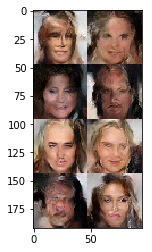

In [37]:
plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))

  5%|▌         | 51/1000 [00:08<02:32,  6.21it/s]

total_loss -6.4994445
loss_per_pixel -6.822346
l2_loss 0.32290152


 10%|█         | 101/1000 [00:16<02:24,  6.24it/s]

total_loss -6.4954486
loss_per_pixel -6.8182144
l2_loss 0.32276577


 15%|█▌        | 151/1000 [00:24<02:15,  6.28it/s]

total_loss -6.599801
loss_per_pixel -6.9224057
l2_loss 0.3226047


 20%|██        | 201/1000 [00:32<02:07,  6.25it/s]

total_loss -6.4177938
loss_per_pixel -6.740268
l2_loss 0.32247442


 25%|██▌       | 251/1000 [00:40<01:59,  6.27it/s]

total_loss -6.3678236
loss_per_pixel -6.690125
l2_loss 0.32230145


 30%|███       | 301/1000 [00:48<01:51,  6.26it/s]

total_loss -6.6445737
loss_per_pixel -6.966718
l2_loss 0.32214466


 35%|███▌      | 351/1000 [00:56<01:44,  6.24it/s]

total_loss -6.4323883
loss_per_pixel -6.7544026
l2_loss 0.32201448


 40%|████      | 401/1000 [01:04<01:35,  6.26it/s]

total_loss -6.7719774
loss_per_pixel -7.093845
l2_loss 0.32186767


 45%|████▌     | 451/1000 [01:11<01:27,  6.26it/s]

total_loss -6.5214243
loss_per_pixel -6.8431525
l2_loss 0.3217282


 50%|█████     | 501/1000 [01:19<01:19,  6.27it/s]

total_loss -6.4768286
loss_per_pixel -6.798399
l2_loss 0.32157063


 55%|█████▌    | 551/1000 [01:27<01:11,  6.29it/s]

total_loss -6.461611
loss_per_pixel -6.783037
l2_loss 0.32142618


 60%|██████    | 601/1000 [01:35<01:03,  6.30it/s]

total_loss -6.6135855
loss_per_pixel -6.9348598
l2_loss 0.3212741


 65%|██████▌   | 651/1000 [01:43<00:55,  6.28it/s]

total_loss -6.3833227
loss_per_pixel -6.704452
l2_loss 0.32112935


 70%|███████   | 701/1000 [01:51<00:47,  6.27it/s]

total_loss -6.393701
loss_per_pixel -6.7146854
l2_loss 0.32098445


 75%|███████▌  | 751/1000 [01:59<00:39,  6.28it/s]

total_loss -6.42241
loss_per_pixel -6.7432323
l2_loss 0.3208221


 80%|████████  | 801/1000 [02:07<00:31,  6.29it/s]

total_loss -6.6639085
loss_per_pixel -6.9845777
l2_loss 0.32066914


 85%|████████▌ | 851/1000 [02:15<00:23,  6.29it/s]

total_loss -6.3996015
loss_per_pixel -6.720121
l2_loss 0.32051933


 90%|█████████ | 901/1000 [02:23<00:15,  6.29it/s]

total_loss -6.464943
loss_per_pixel -6.785322
l2_loss 0.32037938


 95%|█████████▌| 951/1000 [02:31<00:07,  6.30it/s]

total_loss -6.3534446
loss_per_pixel -6.6736774
l2_loss 0.32023278


100%|█████████▉| 999/1000 [02:38<00:00,  6.31it/s]

total_loss -6.400695
loss_per_pixel -6.720781
l2_loss 0.32008588


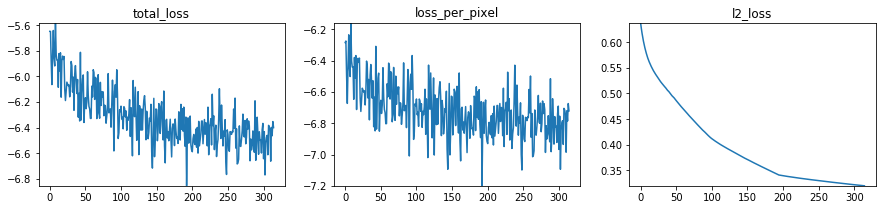

100%|██████████| 1000/1000 [02:38<00:00,  6.29it/s]


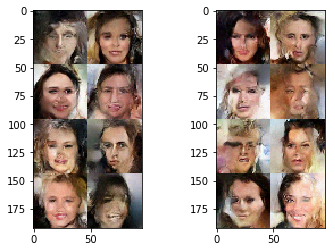

  5%|▌         | 51/1000 [00:08<02:31,  6.26it/s]

total_loss -6.707268
loss_per_pixel -7.027188
l2_loss 0.31991976


 10%|█         | 101/1000 [00:15<02:21,  6.36it/s]

total_loss -6.485985
loss_per_pixel -6.8057656
l2_loss 0.31978095


 15%|█▌        | 151/1000 [00:23<02:13,  6.36it/s]

total_loss -6.4512258
loss_per_pixel -6.770853
l2_loss 0.3196274


 20%|██        | 201/1000 [00:31<02:06,  6.29it/s]

total_loss -6.4804454
loss_per_pixel -6.7999187
l2_loss 0.31947315


 25%|██▌       | 251/1000 [00:39<01:58,  6.31it/s]

total_loss -6.7100506
loss_per_pixel -7.029384
l2_loss 0.31933358


 30%|███       | 301/1000 [00:47<01:50,  6.32it/s]

total_loss -6.347275
loss_per_pixel -6.666473
l2_loss 0.3191982


 35%|███▌      | 351/1000 [00:55<01:42,  6.32it/s]

total_loss -6.310313
loss_per_pixel -6.629372
l2_loss 0.31905913


 40%|████      | 401/1000 [01:03<01:34,  6.32it/s]

total_loss -6.589927
loss_per_pixel -6.9088383
l2_loss 0.3189111


 45%|████▌     | 451/1000 [01:11<01:26,  6.33it/s]

total_loss -6.4179263
loss_per_pixel -6.7366967
l2_loss 0.3187702


 50%|█████     | 501/1000 [01:19<01:18,  6.32it/s]

total_loss -6.2681127
loss_per_pixel -6.5867467
l2_loss 0.31863388


 55%|█████▌    | 551/1000 [01:27<01:11,  6.32it/s]

total_loss -6.401114
loss_per_pixel -6.719609
l2_loss 0.3184947


 60%|██████    | 601/1000 [01:34<01:03,  6.33it/s]

total_loss -6.5084577
loss_per_pixel -6.826803
l2_loss 0.31834567


 65%|██████▌   | 651/1000 [01:42<00:55,  6.34it/s]

total_loss -6.289813
loss_per_pixel -6.6080227
l2_loss 0.3182096


 70%|███████   | 701/1000 [01:50<00:47,  6.33it/s]

total_loss -6.8794003
loss_per_pixel -7.1974673
l2_loss 0.31806725


 75%|███████▌  | 751/1000 [01:58<00:39,  6.32it/s]

total_loss -6.397027
loss_per_pixel -6.714955
l2_loss 0.31792787


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.341627
loss_per_pixel -6.6594105
l2_loss 0.31778345


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.581016
loss_per_pixel -6.898657
l2_loss 0.31764075


 90%|█████████ | 901/1000 [02:22<00:15,  6.33it/s]

total_loss -6.6795745
loss_per_pixel -6.997071
l2_loss 0.3174961


 95%|█████████▌| 951/1000 [02:30<00:07,  6.33it/s]

total_loss -6.6618805
loss_per_pixel -6.979237
l2_loss 0.3173566


100%|█████████▉| 999/1000 [02:37<00:00,  6.33it/s]

total_loss -6.243618
loss_per_pixel -6.5608373
l2_loss 0.31721935


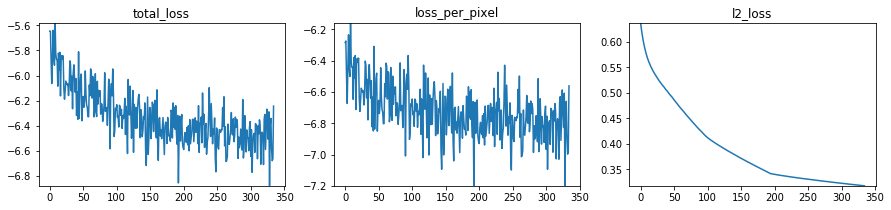

100%|██████████| 1000/1000 [02:38<00:00,  6.32it/s]


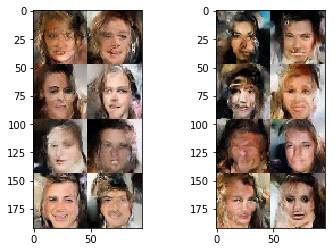

  5%|▌         | 51/1000 [00:08<02:31,  6.28it/s]

total_loss -6.5443482
loss_per_pixel -6.861426
l2_loss 0.31707758


 10%|█         | 101/1000 [00:15<02:22,  6.32it/s]

total_loss -6.6528277
loss_per_pixel -6.969763
l2_loss 0.3169352


 15%|█▌        | 151/1000 [00:24<02:15,  6.26it/s]

total_loss -6.33912
loss_per_pixel -6.655911
l2_loss 0.31679094


 20%|██        | 201/1000 [00:32<02:07,  6.28it/s]

total_loss -6.5559316
loss_per_pixel -6.872586
l2_loss 0.31665418


 25%|██▌       | 251/1000 [00:39<01:58,  6.29it/s]

total_loss -6.4248624
loss_per_pixel -6.741369
l2_loss 0.31650648


 30%|███       | 301/1000 [00:47<01:51,  6.28it/s]

total_loss -6.441101
loss_per_pixel -6.757459
l2_loss 0.31635803


 35%|███▌      | 351/1000 [00:55<01:42,  6.30it/s]

total_loss -6.6099305
loss_per_pixel -6.9261646
l2_loss 0.316234


 40%|████      | 401/1000 [01:03<01:35,  6.29it/s]

total_loss -6.5297604
loss_per_pixel -6.845846
l2_loss 0.31608605


 45%|████▌     | 451/1000 [01:11<01:27,  6.31it/s]

total_loss -6.257441
loss_per_pixel -6.5733924
l2_loss 0.31595147


 50%|█████     | 501/1000 [01:19<01:19,  6.30it/s]

total_loss -6.4577017
loss_per_pixel -6.773514
l2_loss 0.31581232


 55%|█████▌    | 551/1000 [01:27<01:11,  6.31it/s]

total_loss -6.444983
loss_per_pixel -6.760664
l2_loss 0.315681


 60%|██████    | 601/1000 [01:35<01:03,  6.31it/s]

total_loss -6.5112677
loss_per_pixel -6.8268046
l2_loss 0.31553718


 65%|██████▌   | 651/1000 [01:43<00:55,  6.32it/s]

total_loss -6.2363153
loss_per_pixel -6.551723
l2_loss 0.3154079


 70%|███████   | 701/1000 [01:50<00:47,  6.33it/s]

total_loss -6.135035
loss_per_pixel -6.4503055
l2_loss 0.31527057


 75%|███████▌  | 751/1000 [01:58<00:39,  6.33it/s]

total_loss -6.3989077
loss_per_pixel -6.7140307
l2_loss 0.31512308


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.4128766
loss_per_pixel -6.72786
l2_loss 0.3149834


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.526831
loss_per_pixel -6.841681
l2_loss 0.31485006


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.2557774
loss_per_pixel -6.570486
l2_loss 0.31470856


 95%|█████████▌| 951/1000 [02:30<00:07,  6.33it/s]

total_loss -6.5929284
loss_per_pixel -6.907497
l2_loss 0.31456837


100%|█████████▉| 999/1000 [02:38<00:00,  6.32it/s]

total_loss -6.6058936
loss_per_pixel -6.9203267
l2_loss 0.3144333


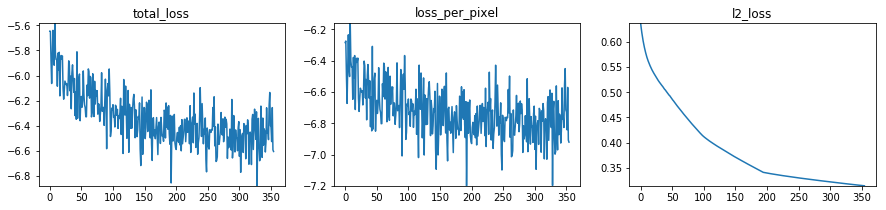

100%|██████████| 1000/1000 [02:38<00:00,  6.31it/s]


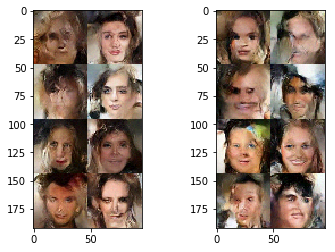

  5%|▌         | 51/1000 [00:08<02:33,  6.19it/s]

total_loss -6.3544383
loss_per_pixel -6.668722
l2_loss 0.314284


 10%|█         | 101/1000 [00:16<02:23,  6.28it/s]

total_loss -6.2744584
loss_per_pixel -6.5886
l2_loss 0.31414163


 15%|█▌        | 151/1000 [00:23<02:13,  6.34it/s]

total_loss -6.4972153
loss_per_pixel -6.811216
l2_loss 0.31400084


 20%|██        | 201/1000 [00:31<02:06,  6.32it/s]

total_loss -6.315846
loss_per_pixel -6.6297107
l2_loss 0.31386468


 25%|██▌       | 251/1000 [00:39<01:58,  6.33it/s]

total_loss -6.5257273
loss_per_pixel -6.839455
l2_loss 0.31372765


 30%|███       | 301/1000 [00:47<01:50,  6.34it/s]

total_loss -6.7089095
loss_per_pixel -7.022495
l2_loss 0.3135854


 35%|███▌      | 351/1000 [00:55<01:42,  6.35it/s]

total_loss -6.511737
loss_per_pixel -6.825187
l2_loss 0.31345022


 40%|████      | 401/1000 [01:03<01:34,  6.35it/s]

total_loss -6.421682
loss_per_pixel -6.735
l2_loss 0.3133184


 45%|████▌     | 451/1000 [01:10<01:26,  6.36it/s]

total_loss -6.2922235
loss_per_pixel -6.6054053
l2_loss 0.31318203


 50%|█████     | 501/1000 [01:18<01:18,  6.35it/s]

total_loss -6.571216
loss_per_pixel -6.884264
l2_loss 0.31304803


 55%|█████▌    | 551/1000 [01:26<01:10,  6.36it/s]

total_loss -6.59501
loss_per_pixel -6.907921
l2_loss 0.31291088


 60%|██████    | 601/1000 [01:34<01:02,  6.36it/s]

total_loss -6.775278
loss_per_pixel -7.0880527
l2_loss 0.31277457


 65%|██████▌   | 651/1000 [01:42<00:54,  6.36it/s]

total_loss -6.5636897
loss_per_pixel -6.8763275
l2_loss 0.31263795


 70%|███████   | 701/1000 [01:50<00:46,  6.37it/s]

total_loss -6.25502
loss_per_pixel -6.567528
l2_loss 0.31250766


 75%|███████▌  | 751/1000 [01:57<00:39,  6.37it/s]

total_loss -6.551623
loss_per_pixel -6.8639903
l2_loss 0.31236723


 80%|████████  | 801/1000 [02:05<00:31,  6.36it/s]

total_loss -6.442085
loss_per_pixel -6.7543125
l2_loss 0.31222755


 85%|████████▌ | 851/1000 [02:13<00:23,  6.36it/s]

total_loss -6.6489773
loss_per_pixel -6.961082
l2_loss 0.31210464


 90%|█████████ | 901/1000 [02:21<00:15,  6.36it/s]

total_loss -6.507834
loss_per_pixel -6.819778
l2_loss 0.31194422


 95%|█████████▌| 951/1000 [02:29<00:07,  6.36it/s]

total_loss -6.502996
loss_per_pixel -6.814815
l2_loss 0.31181914


100%|█████████▉| 999/1000 [02:37<00:00,  6.36it/s]

total_loss -6.625872
loss_per_pixel -6.9375596
l2_loss 0.3116875


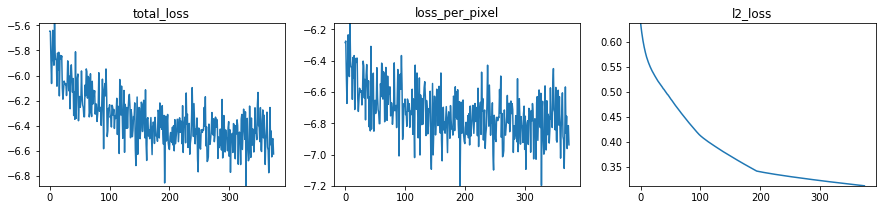

100%|██████████| 1000/1000 [02:37<00:00,  6.34it/s]


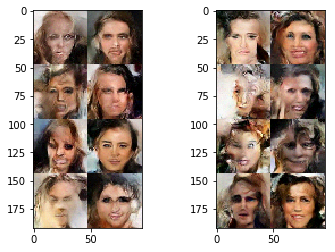

  5%|▌         | 51/1000 [00:08<02:32,  6.23it/s]

total_loss -6.5247097
loss_per_pixel -6.836258
l2_loss 0.3115482


 10%|█         | 101/1000 [00:15<02:22,  6.32it/s]

total_loss -6.4735456
loss_per_pixel -6.7849655
l2_loss 0.31142008


 15%|█▌        | 151/1000 [00:23<02:14,  6.30it/s]

total_loss -6.441156
loss_per_pixel -6.752442
l2_loss 0.31128606


 20%|██        | 201/1000 [00:31<02:05,  6.34it/s]

total_loss -6.372037
loss_per_pixel -6.683187
l2_loss 0.31114984


 25%|██▌       | 251/1000 [00:39<01:58,  6.34it/s]

total_loss -6.3941503
loss_per_pixel -6.705169
l2_loss 0.3110191


 30%|███       | 301/1000 [00:47<01:50,  6.34it/s]

total_loss -6.5299883
loss_per_pixel -6.840868
l2_loss 0.31087983


 35%|███▌      | 351/1000 [00:55<01:42,  6.32it/s]

total_loss -6.6768484
loss_per_pixel -6.9875913
l2_loss 0.31074268


 40%|████      | 401/1000 [01:03<01:34,  6.32it/s]

total_loss -6.5149856
loss_per_pixel -6.825605
l2_loss 0.31061926


 45%|████▌     | 451/1000 [01:11<01:26,  6.32it/s]

total_loss -6.5246906
loss_per_pixel -6.8351727
l2_loss 0.310482


 50%|█████     | 501/1000 [01:19<01:18,  6.32it/s]

total_loss -6.3996625
loss_per_pixel -6.7100124
l2_loss 0.31035003


 55%|█████▌    | 551/1000 [01:27<01:11,  6.32it/s]

total_loss -6.606586
loss_per_pixel -6.9167843
l2_loss 0.31019837


 60%|██████    | 601/1000 [01:34<01:03,  6.33it/s]

total_loss -6.317782
loss_per_pixel -6.627844
l2_loss 0.3100621


 65%|██████▌   | 651/1000 [01:43<00:55,  6.32it/s]

total_loss -6.464426
loss_per_pixel -6.7743573
l2_loss 0.30993143


 70%|███████   | 701/1000 [01:50<00:47,  6.32it/s]

total_loss -6.61792
loss_per_pixel -6.9277244
l2_loss 0.3098042


 75%|███████▌  | 751/1000 [01:58<00:39,  6.32it/s]

total_loss -6.4518976
loss_per_pixel -6.761572
l2_loss 0.30967444


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.3877954
loss_per_pixel -6.6973376
l2_loss 0.30954197


 85%|████████▌ | 851/1000 [02:14<00:23,  6.33it/s]

total_loss -6.4431458
loss_per_pixel -6.7525563
l2_loss 0.30941033


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.5372534
loss_per_pixel -6.8465385
l2_loss 0.309285


 95%|█████████▌| 951/1000 [02:30<00:07,  6.32it/s]

total_loss -6.7822294
loss_per_pixel -7.0913754
l2_loss 0.30914614


100%|█████████▉| 999/1000 [02:38<00:00,  6.32it/s]

total_loss -6.5761666
loss_per_pixel -6.885185
l2_loss 0.3090181


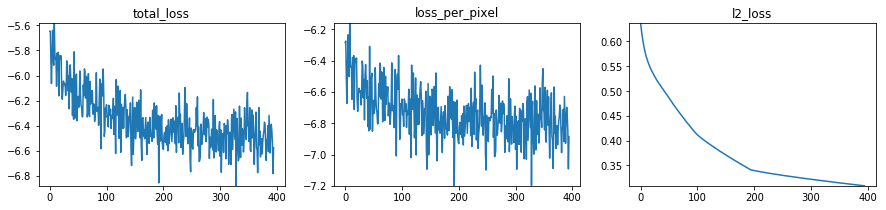

100%|██████████| 1000/1000 [02:38<00:00,  6.30it/s]


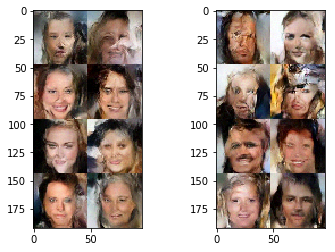

  5%|▌         | 51/1000 [00:08<02:32,  6.24it/s]

total_loss -6.4264045
loss_per_pixel -6.7352996
l2_loss 0.30889502


 10%|█         | 101/1000 [00:16<02:24,  6.22it/s]

total_loss -6.508659
loss_per_pixel -6.817423
l2_loss 0.3087639


 15%|█▌        | 151/1000 [00:24<02:16,  6.21it/s]

total_loss -6.518997
loss_per_pixel -6.8276334
l2_loss 0.30863595


 20%|██        | 201/1000 [00:32<02:07,  6.27it/s]

total_loss -6.225042
loss_per_pixel -6.5335407
l2_loss 0.3084987


 25%|██▌       | 251/1000 [00:40<01:59,  6.27it/s]

total_loss -6.6393843
loss_per_pixel -6.947766
l2_loss 0.30838177


 30%|███       | 301/1000 [00:48<01:51,  6.26it/s]

total_loss -6.4512277
loss_per_pixel -6.7594743
l2_loss 0.30824664


 35%|███▌      | 351/1000 [00:56<01:43,  6.25it/s]

total_loss -6.448728
loss_per_pixel -6.7568583
l2_loss 0.30813015


 40%|████      | 401/1000 [01:04<01:35,  6.25it/s]

total_loss -6.351058
loss_per_pixel -6.6590576
l2_loss 0.30799946


 45%|████▌     | 451/1000 [01:11<01:27,  6.27it/s]

total_loss -6.4853983
loss_per_pixel -6.793268
l2_loss 0.3078701


 50%|█████     | 501/1000 [01:19<01:19,  6.27it/s]

total_loss -6.6399264
loss_per_pixel -6.9476604
l2_loss 0.307734


 55%|█████▌    | 551/1000 [01:27<01:11,  6.28it/s]

total_loss -6.4975185
loss_per_pixel -6.805132
l2_loss 0.30761352


 60%|██████    | 601/1000 [01:35<01:03,  6.29it/s]

total_loss -6.597757
loss_per_pixel -6.905243
l2_loss 0.30748588


 65%|██████▌   | 651/1000 [01:43<00:55,  6.29it/s]

total_loss -6.2510676
loss_per_pixel -6.558416
l2_loss 0.30734843


 70%|███████   | 701/1000 [01:51<00:47,  6.29it/s]

total_loss -6.435955
loss_per_pixel -6.7431736
l2_loss 0.30721834


 75%|███████▌  | 751/1000 [01:59<00:39,  6.31it/s]

total_loss -6.3616133
loss_per_pixel -6.668703
l2_loss 0.30709004


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.181233
loss_per_pixel -6.4881916
l2_loss 0.30695876


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.238356
loss_per_pixel -6.545183
l2_loss 0.30682728


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.601664
loss_per_pixel -6.9083695
l2_loss 0.3067054


 95%|█████████▌| 951/1000 [02:30<00:07,  6.30it/s]

total_loss -6.412863
loss_per_pixel -6.7194347
l2_loss 0.30657178


100%|█████████▉| 999/1000 [02:38<00:00,  6.31it/s]

total_loss -6.4404945
loss_per_pixel -6.7469277
l2_loss 0.30643302


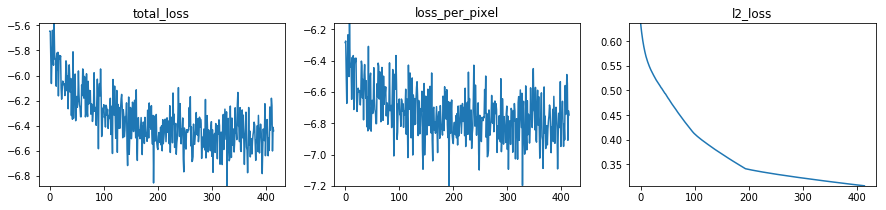

100%|██████████| 1000/1000 [02:38<00:00,  6.29it/s]


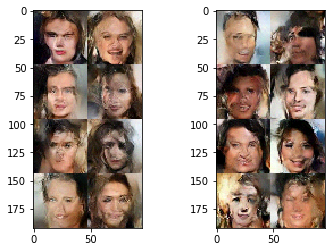

  5%|▌         | 51/1000 [00:08<02:30,  6.32it/s]

total_loss -6.6498947
loss_per_pixel -6.956205
l2_loss 0.30631024


 10%|█         | 101/1000 [00:16<02:23,  6.28it/s]

total_loss -6.347692
loss_per_pixel -6.6538773
l2_loss 0.3061853


 15%|█▌        | 151/1000 [00:24<02:15,  6.26it/s]

total_loss -6.3561544
loss_per_pixel -6.662212
l2_loss 0.30605733


 20%|██        | 201/1000 [00:31<02:06,  6.30it/s]

total_loss -6.386441
loss_per_pixel -6.692383
l2_loss 0.3059417


 25%|██▌       | 251/1000 [00:39<01:58,  6.30it/s]

total_loss -6.373367
loss_per_pixel -6.6791825
l2_loss 0.3058157


 30%|███       | 301/1000 [00:47<01:50,  6.30it/s]

total_loss -6.6016397
loss_per_pixel -6.907328
l2_loss 0.30568823


 35%|███▌      | 351/1000 [00:55<01:43,  6.30it/s]

total_loss -6.4799347
loss_per_pixel -6.7855
l2_loss 0.30556533


 40%|████      | 401/1000 [01:03<01:35,  6.30it/s]

total_loss -6.4589763
loss_per_pixel -6.764423
l2_loss 0.30544662


 45%|████▌     | 451/1000 [01:11<01:27,  6.30it/s]

total_loss -6.4151196
loss_per_pixel -6.7204247
l2_loss 0.3053049


 50%|█████     | 501/1000 [01:19<01:19,  6.31it/s]

total_loss -6.668613
loss_per_pixel -6.9737835
l2_loss 0.3051707


 55%|█████▌    | 551/1000 [01:27<01:11,  6.31it/s]

total_loss -6.6262784
loss_per_pixel -6.9313245
l2_loss 0.3050463


 60%|██████    | 601/1000 [01:35<01:03,  6.31it/s]

total_loss -6.501364
loss_per_pixel -6.806284
l2_loss 0.30491957


 65%|██████▌   | 651/1000 [01:43<00:55,  6.30it/s]

total_loss -6.672465
loss_per_pixel -6.9772525
l2_loss 0.30478752


 70%|███████   | 701/1000 [01:51<00:47,  6.30it/s]

total_loss -6.2898693
loss_per_pixel -6.5945277
l2_loss 0.3046586


 75%|███████▌  | 751/1000 [01:59<00:39,  6.29it/s]

total_loss -6.3853583
loss_per_pixel -6.6898837
l2_loss 0.30452538


 80%|████████  | 801/1000 [02:07<00:31,  6.29it/s]

total_loss -6.52077
loss_per_pixel -6.825173
l2_loss 0.3044026


 85%|████████▌ | 851/1000 [02:15<00:23,  6.29it/s]

total_loss -6.476988
loss_per_pixel -6.781265
l2_loss 0.3042769


 90%|█████████ | 901/1000 [02:23<00:15,  6.29it/s]

total_loss -6.630369
loss_per_pixel -6.9345126
l2_loss 0.30414367


 95%|█████████▌| 951/1000 [02:31<00:07,  6.30it/s]

total_loss -6.703708
loss_per_pixel -7.0077267
l2_loss 0.30401856


100%|█████████▉| 999/1000 [02:38<00:00,  6.31it/s]

total_loss -6.6748414
loss_per_pixel -6.9787297
l2_loss 0.30388853


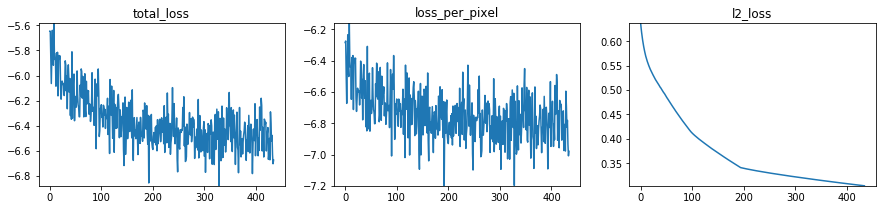

100%|██████████| 1000/1000 [02:38<00:00,  6.29it/s]


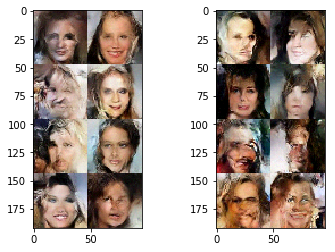

  5%|▌         | 51/1000 [00:08<02:28,  6.37it/s]

total_loss -6.5334315
loss_per_pixel -6.8371887
l2_loss 0.30375716


 10%|█         | 101/1000 [00:16<02:23,  6.26it/s]

total_loss -6.6638045
loss_per_pixel -6.967434
l2_loss 0.3036294


 15%|█▌        | 151/1000 [00:24<02:16,  6.24it/s]

total_loss -6.5176945
loss_per_pixel -6.821205
l2_loss 0.30351043


 20%|██        | 201/1000 [00:31<02:06,  6.30it/s]

total_loss -6.598352
loss_per_pixel -6.9017377
l2_loss 0.30338562


 25%|██▌       | 251/1000 [00:39<01:58,  6.30it/s]

total_loss -6.524295
loss_per_pixel -6.8275623
l2_loss 0.30326763


 30%|███       | 301/1000 [00:47<01:50,  6.32it/s]

total_loss -6.5880537
loss_per_pixel -6.8912034
l2_loss 0.30314967


 35%|███▌      | 351/1000 [00:55<01:42,  6.30it/s]

total_loss -6.710766
loss_per_pixel -7.013796
l2_loss 0.3030301


 40%|████      | 401/1000 [01:03<01:35,  6.30it/s]

total_loss -6.478475
loss_per_pixel -6.781378
l2_loss 0.30290252


 45%|████▌     | 451/1000 [01:11<01:26,  6.32it/s]

total_loss -6.4100895
loss_per_pixel -6.7128735
l2_loss 0.3027842


 50%|█████     | 501/1000 [01:19<01:18,  6.33it/s]

total_loss -6.7772202
loss_per_pixel -7.079874
l2_loss 0.30265382


 55%|█████▌    | 551/1000 [01:26<01:10,  6.34it/s]

total_loss -6.6027164
loss_per_pixel -6.90525
l2_loss 0.3025337


 60%|██████    | 601/1000 [01:34<01:02,  6.36it/s]

total_loss -6.479295
loss_per_pixel -6.781696
l2_loss 0.30240127


 65%|██████▌   | 651/1000 [01:42<00:54,  6.36it/s]

total_loss -6.3864136
loss_per_pixel -6.6886997
l2_loss 0.30228597


 70%|███████   | 701/1000 [01:50<00:46,  6.36it/s]

total_loss -6.4663057
loss_per_pixel -6.768469
l2_loss 0.30216295


 75%|███████▌  | 751/1000 [01:58<00:39,  6.36it/s]

total_loss -6.4946237
loss_per_pixel -6.7966685
l2_loss 0.30204475


 80%|████████  | 801/1000 [02:06<00:31,  6.35it/s]

total_loss -6.3013916
loss_per_pixel -6.6033044
l2_loss 0.30191293


 85%|████████▌ | 851/1000 [02:13<00:23,  6.36it/s]

total_loss -6.4012265
loss_per_pixel -6.703012
l2_loss 0.30178544


 90%|█████████ | 901/1000 [02:21<00:15,  6.35it/s]

total_loss -6.575672
loss_per_pixel -6.8773303
l2_loss 0.30165818


 95%|█████████▌| 951/1000 [02:29<00:07,  6.35it/s]

total_loss -6.6430917
loss_per_pixel -6.9446354
l2_loss 0.3015438


100%|█████████▉| 999/1000 [02:37<00:00,  6.35it/s]

total_loss -6.758684
loss_per_pixel -7.0601025
l2_loss 0.30141807


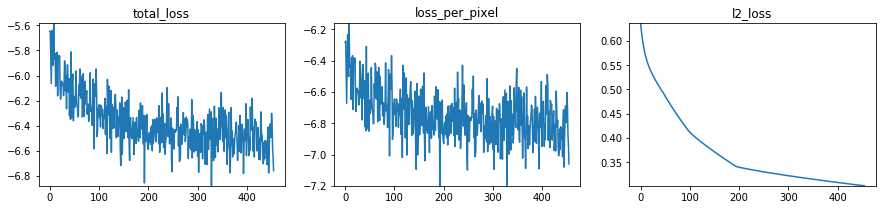

100%|██████████| 1000/1000 [02:37<00:00,  6.34it/s]


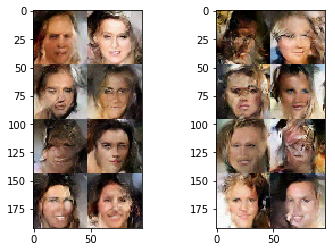

  5%|▌         | 51/1000 [00:08<02:33,  6.18it/s]

total_loss -6.5445
loss_per_pixel -6.845799
l2_loss 0.30129927


 10%|█         | 101/1000 [00:16<02:24,  6.22it/s]

total_loss -6.51111
loss_per_pixel -6.812286
l2_loss 0.30117586


 15%|█▌        | 151/1000 [00:24<02:16,  6.24it/s]

total_loss -6.533002
loss_per_pixel -6.8340564
l2_loss 0.30105445


 20%|██        | 201/1000 [00:32<02:07,  6.25it/s]

total_loss -6.574112
loss_per_pixel -6.875044
l2_loss 0.30093208


 25%|██▌       | 251/1000 [00:40<01:59,  6.27it/s]

total_loss -6.5524745
loss_per_pixel -6.8532844
l2_loss 0.3008098


 30%|███       | 301/1000 [00:48<01:51,  6.26it/s]

total_loss -6.531677
loss_per_pixel -6.832369
l2_loss 0.30069217


 35%|███▌      | 351/1000 [00:55<01:43,  6.28it/s]

total_loss -6.5719132
loss_per_pixel -6.8724847
l2_loss 0.30057156


 40%|████      | 401/1000 [01:03<01:35,  6.27it/s]

total_loss -6.5779386
loss_per_pixel -6.8783803
l2_loss 0.30044177


 45%|████▌     | 451/1000 [01:11<01:27,  6.27it/s]

total_loss -6.6208143
loss_per_pixel -6.9211316
l2_loss 0.30031747


 50%|█████     | 501/1000 [01:19<01:19,  6.27it/s]

total_loss -6.512764
loss_per_pixel -6.8129597
l2_loss 0.30019554


 55%|█████▌    | 551/1000 [01:27<01:11,  6.28it/s]

total_loss -6.4476223
loss_per_pixel -6.7476983
l2_loss 0.3000759


 60%|██████    | 601/1000 [01:35<01:03,  6.27it/s]

total_loss -6.615471
loss_per_pixel -6.9154263
l2_loss 0.29995543


 65%|██████▌   | 651/1000 [01:43<00:55,  6.27it/s]

total_loss -6.224432
loss_per_pixel -6.524267
l2_loss 0.2998351


 70%|███████   | 701/1000 [01:51<00:47,  6.28it/s]

total_loss -6.351029
loss_per_pixel -6.6507397
l2_loss 0.2997108


 75%|███████▌  | 751/1000 [01:59<00:39,  6.28it/s]

total_loss -6.607636
loss_per_pixel -6.907226
l2_loss 0.29959017


 80%|████████  | 801/1000 [02:07<00:31,  6.28it/s]

total_loss -6.2821617
loss_per_pixel -6.581638
l2_loss 0.29947615


 85%|████████▌ | 851/1000 [02:15<00:23,  6.28it/s]

total_loss -6.5235157
loss_per_pixel -6.8228583
l2_loss 0.29934248


 90%|█████████ | 901/1000 [02:23<00:15,  6.28it/s]

total_loss -6.6268296
loss_per_pixel -6.926058
l2_loss 0.29922813


 95%|█████████▌| 951/1000 [02:31<00:07,  6.29it/s]

total_loss -6.4077377
loss_per_pixel -6.7068386
l2_loss 0.2991008


100%|█████████▉| 999/1000 [02:38<00:00,  6.30it/s]

total_loss -6.2865033
loss_per_pixel -6.585493
l2_loss 0.29898977


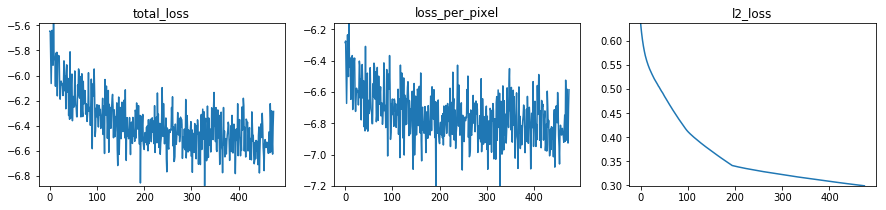

100%|██████████| 1000/1000 [02:39<00:00,  6.29it/s]


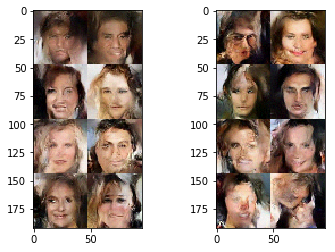

  5%|▌         | 51/1000 [00:08<02:33,  6.17it/s]

total_loss -6.518275
loss_per_pixel -6.817127
l2_loss 0.29885232


 10%|█         | 101/1000 [00:16<02:26,  6.14it/s]

total_loss -6.4555826
loss_per_pixel -6.754314
l2_loss 0.29873157


 15%|█▌        | 151/1000 [00:24<02:16,  6.23it/s]

total_loss -6.3273115
loss_per_pixel -6.6259303
l2_loss 0.29861897


 20%|██        | 201/1000 [00:32<02:07,  6.26it/s]

total_loss -6.902008
loss_per_pixel -7.200508
l2_loss 0.29849988


 25%|██▌       | 251/1000 [00:39<01:59,  6.29it/s]

total_loss -6.906852
loss_per_pixel -7.2052236
l2_loss 0.29837155


 30%|███       | 301/1000 [00:47<01:50,  6.31it/s]

total_loss -6.3075447
loss_per_pixel -6.605791
l2_loss 0.29824635


 35%|███▌      | 351/1000 [00:55<01:42,  6.31it/s]

total_loss -6.403248
loss_per_pixel -6.701381
l2_loss 0.2981333


 40%|████      | 401/1000 [01:03<01:35,  6.30it/s]

total_loss -6.5416446
loss_per_pixel -6.8396573
l2_loss 0.29801264


 45%|████▌     | 451/1000 [01:11<01:27,  6.31it/s]

total_loss -6.616555
loss_per_pixel -6.914442
l2_loss 0.2978871


 50%|█████     | 501/1000 [01:19<01:19,  6.30it/s]

total_loss -6.3830056
loss_per_pixel -6.680776
l2_loss 0.29777062


 55%|█████▌    | 551/1000 [01:27<01:11,  6.29it/s]

total_loss -6.5326257
loss_per_pixel -6.8302765
l2_loss 0.29765078


 60%|██████    | 601/1000 [01:35<01:03,  6.29it/s]

total_loss -6.5062714
loss_per_pixel -6.8038096
l2_loss 0.29753822


 65%|██████▌   | 651/1000 [01:43<00:55,  6.29it/s]

total_loss -6.5401435
loss_per_pixel -6.8375554
l2_loss 0.2974118


 70%|███████   | 701/1000 [01:51<00:47,  6.29it/s]

total_loss -6.373502
loss_per_pixel -6.6708055
l2_loss 0.29730356


 75%|███████▌  | 751/1000 [01:59<00:39,  6.30it/s]

total_loss -6.3907523
loss_per_pixel -6.687938
l2_loss 0.29718587


 80%|████████  | 801/1000 [02:06<00:31,  6.31it/s]

total_loss -6.4995117
loss_per_pixel -6.7965693
l2_loss 0.29705763


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.6281767
loss_per_pixel -6.9251246
l2_loss 0.29694778


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.4796777
loss_per_pixel -6.776518
l2_loss 0.2968401


 95%|█████████▌| 951/1000 [02:30<00:07,  6.32it/s]

total_loss -6.503459
loss_per_pixel -6.800176
l2_loss 0.29671702


100%|█████████▉| 999/1000 [02:38<00:00,  6.32it/s]

total_loss -6.327904
loss_per_pixel -6.624506
l2_loss 0.2966018


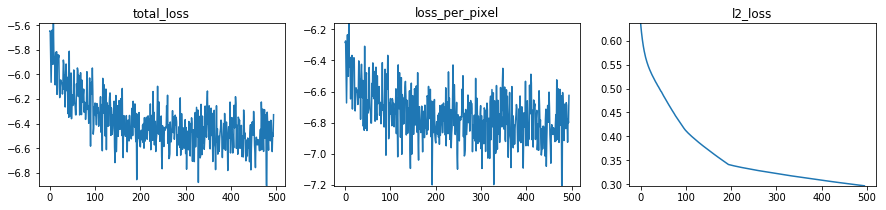

100%|██████████| 1000/1000 [02:38<00:00,  6.30it/s]


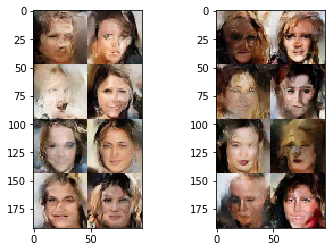

  5%|▌         | 51/1000 [00:07<02:28,  6.41it/s]

total_loss -6.4137354
loss_per_pixel -6.710216
l2_loss 0.29648077


 10%|█         | 101/1000 [00:15<02:21,  6.34it/s]

total_loss -6.710406
loss_per_pixel -7.006764
l2_loss 0.29635805


 15%|█▌        | 151/1000 [00:23<02:13,  6.34it/s]

total_loss -6.6040177
loss_per_pixel -6.9002666
l2_loss 0.29624888


 20%|██        | 201/1000 [00:31<02:06,  6.31it/s]

total_loss -6.406984
loss_per_pixel -6.703112
l2_loss 0.2961282


 25%|██▌       | 251/1000 [00:39<01:58,  6.31it/s]

total_loss -6.594865
loss_per_pixel -6.89088
l2_loss 0.29601514


 30%|███       | 301/1000 [00:47<01:50,  6.33it/s]

total_loss -6.8789835
loss_per_pixel -7.1748757
l2_loss 0.29589212


 35%|███▌      | 351/1000 [00:55<01:42,  6.32it/s]

total_loss -6.6277647
loss_per_pixel -6.923549
l2_loss 0.29578456


 40%|████      | 401/1000 [01:03<01:34,  6.33it/s]

total_loss -6.5747256
loss_per_pixel -6.870395
l2_loss 0.29566973


 45%|████▌     | 451/1000 [01:11<01:26,  6.32it/s]

total_loss -6.5294237
loss_per_pixel -6.824972
l2_loss 0.2955486


 50%|█████     | 501/1000 [01:19<01:18,  6.33it/s]

total_loss -6.5438743
loss_per_pixel -6.839317
l2_loss 0.29544237


 55%|█████▌    | 551/1000 [01:27<01:10,  6.33it/s]

total_loss -6.7021055
loss_per_pixel -6.9974294
l2_loss 0.29532367


 60%|██████    | 601/1000 [01:34<01:03,  6.33it/s]

total_loss -6.323062
loss_per_pixel -6.6182704
l2_loss 0.29520828


 65%|██████▌   | 651/1000 [01:42<00:55,  6.32it/s]

total_loss -6.4753404
loss_per_pixel -6.7704434
l2_loss 0.2951029


 70%|███████   | 701/1000 [01:50<00:47,  6.33it/s]

total_loss -6.5130076
loss_per_pixel -6.8079762
l2_loss 0.2949685


 75%|███████▌  | 751/1000 [01:58<00:39,  6.32it/s]

total_loss -6.7328873
loss_per_pixel -7.027746
l2_loss 0.29485893


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.55529
loss_per_pixel -6.850027
l2_loss 0.294737


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.4509664
loss_per_pixel -6.745586
l2_loss 0.29461977


 90%|█████████ | 901/1000 [02:22<00:15,  6.33it/s]

total_loss -6.691815
loss_per_pixel -6.986319
l2_loss 0.2945041


 95%|█████████▌| 951/1000 [02:30<00:07,  6.32it/s]

total_loss -6.462485
loss_per_pixel -6.75687
l2_loss 0.29438487


100%|█████████▉| 999/1000 [02:37<00:00,  6.33it/s]

total_loss -6.5855565
loss_per_pixel -6.879826
l2_loss 0.29426965


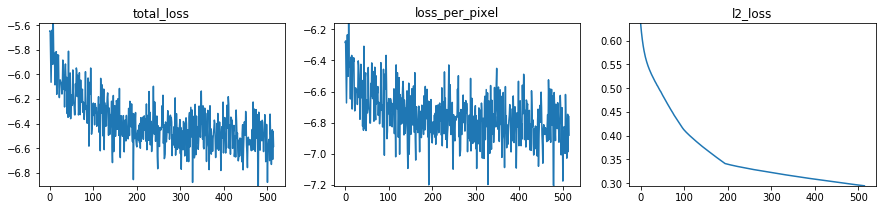

100%|██████████| 1000/1000 [02:38<00:00,  6.31it/s]


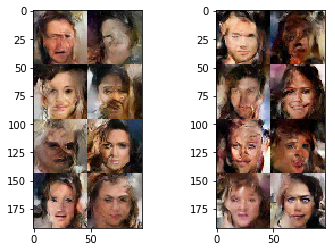

  5%|▌         | 51/1000 [00:08<02:32,  6.23it/s]

total_loss -6.298203
loss_per_pixel -6.592361
l2_loss 0.2941578


 10%|█         | 101/1000 [00:16<02:23,  6.26it/s]

total_loss -6.671744
loss_per_pixel -6.965777
l2_loss 0.29403305


 15%|█▌        | 151/1000 [00:24<02:15,  6.28it/s]

total_loss -6.3982077
loss_per_pixel -6.6921306
l2_loss 0.2939228


 20%|██        | 201/1000 [00:31<02:06,  6.32it/s]

total_loss -6.5035343
loss_per_pixel -6.7973447
l2_loss 0.29381043


 25%|██▌       | 251/1000 [00:39<01:58,  6.30it/s]

total_loss -6.6443987
loss_per_pixel -6.9380913
l2_loss 0.2936925


 30%|███       | 301/1000 [00:47<01:50,  6.34it/s]

total_loss -6.4129434
loss_per_pixel -6.7065244
l2_loss 0.29358116


 35%|███▌      | 351/1000 [00:55<01:42,  6.33it/s]

total_loss -6.2067127
loss_per_pixel -6.500185
l2_loss 0.2934721


 40%|████      | 401/1000 [01:03<01:34,  6.32it/s]

total_loss -6.5090256
loss_per_pixel -6.8023815
l2_loss 0.2933557


 45%|████▌     | 451/1000 [01:11<01:26,  6.31it/s]

total_loss -6.6562495
loss_per_pixel -6.9494853
l2_loss 0.2932356


 50%|█████     | 501/1000 [01:19<01:19,  6.31it/s]

total_loss -6.5700436
loss_per_pixel -6.863165
l2_loss 0.29312134


 55%|█████▌    | 551/1000 [01:27<01:11,  6.32it/s]

total_loss -6.456669
loss_per_pixel -6.749681
l2_loss 0.29301226


 60%|██████    | 601/1000 [01:35<01:03,  6.32it/s]

total_loss -6.624082
loss_per_pixel -6.9169765
l2_loss 0.29289445


 65%|██████▌   | 651/1000 [01:43<00:55,  6.31it/s]

total_loss -6.4315405
loss_per_pixel -6.7243266
l2_loss 0.29278636


 70%|███████   | 701/1000 [01:51<00:47,  6.30it/s]

total_loss -6.3203335
loss_per_pixel -6.613001
l2_loss 0.2926674


 75%|███████▌  | 751/1000 [01:59<00:39,  6.30it/s]

total_loss -6.3295975
loss_per_pixel -6.6221523
l2_loss 0.29255503


 80%|████████  | 801/1000 [02:06<00:31,  6.31it/s]

total_loss -6.4165587
loss_per_pixel -6.709007
l2_loss 0.29244807


 85%|████████▌ | 851/1000 [02:15<00:23,  6.30it/s]

total_loss -6.3786354
loss_per_pixel -6.6709614
l2_loss 0.292326


 90%|█████████ | 901/1000 [02:23<00:15,  6.30it/s]

total_loss -6.551312
loss_per_pixel -6.8435287
l2_loss 0.2922169


 95%|█████████▌| 951/1000 [02:30<00:07,  6.30it/s]

total_loss -6.4020805
loss_per_pixel -6.6941686
l2_loss 0.2920881


100%|█████████▉| 999/1000 [02:38<00:00,  6.30it/s]

total_loss -6.6631427
loss_per_pixel -6.955116
l2_loss 0.2919733


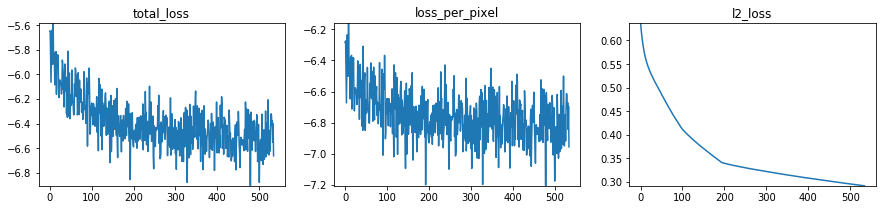

100%|██████████| 1000/1000 [02:39<00:00,  6.29it/s]


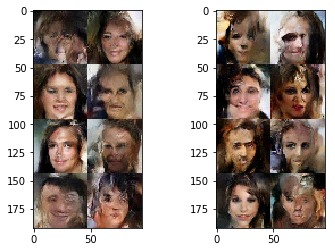

  5%|▌         | 51/1000 [00:08<02:29,  6.34it/s]

total_loss -6.652732
loss_per_pixel -6.944595
l2_loss 0.29186308


 10%|█         | 101/1000 [00:15<02:21,  6.34it/s]

total_loss -6.3929377
loss_per_pixel -6.6846867
l2_loss 0.2917488


 15%|█▌        | 151/1000 [00:23<02:14,  6.34it/s]

total_loss -6.508744
loss_per_pixel -6.800377
l2_loss 0.2916333


 20%|██        | 201/1000 [00:31<02:06,  6.33it/s]

total_loss -6.6615057
loss_per_pixel -6.9530263
l2_loss 0.2915208


 25%|██▌       | 251/1000 [00:39<01:58,  6.31it/s]

total_loss -6.562468
loss_per_pixel -6.85387
l2_loss 0.291402


 30%|███       | 301/1000 [00:47<01:51,  6.28it/s]

total_loss -6.304079
loss_per_pixel -6.5953746
l2_loss 0.29129553


 35%|███▌      | 351/1000 [00:55<01:43,  6.29it/s]

total_loss -6.509823
loss_per_pixel -6.801005
l2_loss 0.29118216


 40%|████      | 401/1000 [01:03<01:34,  6.31it/s]

total_loss -6.454015
loss_per_pixel -6.7450833
l2_loss 0.29106864


 45%|████▌     | 451/1000 [01:11<01:26,  6.32it/s]

total_loss -6.476824
loss_per_pixel -6.7677765
l2_loss 0.29095268


 50%|█████     | 501/1000 [01:19<01:19,  6.32it/s]

total_loss -6.43303
loss_per_pixel -6.723866
l2_loss 0.29083565


 55%|█████▌    | 551/1000 [01:27<01:11,  6.32it/s]

total_loss -6.47999
loss_per_pixel -6.770721
l2_loss 0.2907312


 60%|██████    | 601/1000 [01:34<01:03,  6.33it/s]

total_loss -6.5841937
loss_per_pixel -6.8748116
l2_loss 0.29061797


 65%|██████▌   | 651/1000 [01:42<00:55,  6.33it/s]

total_loss -6.5047255
loss_per_pixel -6.795219
l2_loss 0.29049352


 70%|███████   | 701/1000 [01:50<00:47,  6.32it/s]

total_loss -6.5178394
loss_per_pixel -6.8082166
l2_loss 0.29037723


 75%|███████▌  | 751/1000 [01:58<00:39,  6.32it/s]

total_loss -6.617268
loss_per_pixel -6.9075236
l2_loss 0.2902557


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.594432
loss_per_pixel -6.884577
l2_loss 0.29014477


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.434156
loss_per_pixel -6.724186
l2_loss 0.2900299


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.5103025
loss_per_pixel -6.800225
l2_loss 0.28992206


 95%|█████████▌| 951/1000 [02:30<00:07,  6.31it/s]

total_loss -6.2694755
loss_per_pixel -6.55929
l2_loss 0.2898145


100%|█████████▉| 999/1000 [02:38<00:00,  6.31it/s]

total_loss -6.309694
loss_per_pixel -6.599394
l2_loss 0.28970003


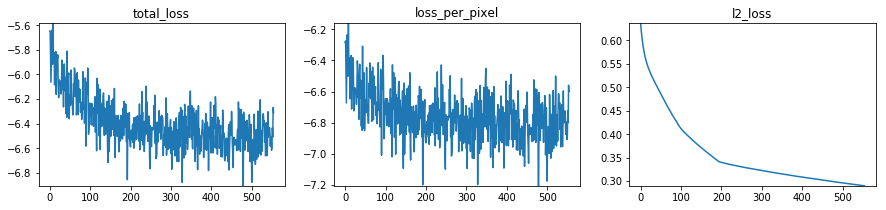

100%|██████████| 1000/1000 [02:38<00:00,  6.30it/s]


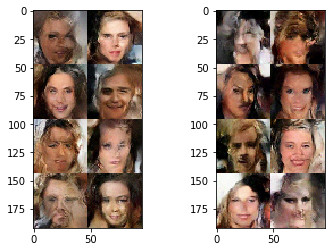

  5%|▌         | 50/1000 [00:07<02:28,  6.41it/s]

total_loss -6.3740807
loss_per_pixel -6.66366
l2_loss 0.28957918


 10%|█         | 101/1000 [00:15<02:22,  6.33it/s]

total_loss -6.4393144
loss_per_pixel -6.728787
l2_loss 0.28947252


 15%|█▌        | 151/1000 [00:23<02:14,  6.30it/s]

total_loss -6.46685
loss_per_pixel -6.7562175
l2_loss 0.28936753


 20%|██        | 201/1000 [00:31<02:06,  6.31it/s]

total_loss -6.3699055
loss_per_pixel -6.659166
l2_loss 0.28926063


 25%|██▌       | 251/1000 [00:39<01:58,  6.30it/s]

total_loss -6.7723165
loss_per_pixel -7.0614753
l2_loss 0.28915867


 30%|███       | 301/1000 [00:47<01:50,  6.31it/s]

total_loss -6.4563127
loss_per_pixel -6.745377
l2_loss 0.28906435


 35%|███▌      | 351/1000 [00:55<01:42,  6.33it/s]

total_loss -6.7915473
loss_per_pixel -7.080503
l2_loss 0.28895572


 40%|████      | 401/1000 [01:03<01:34,  6.34it/s]

total_loss -6.489293
loss_per_pixel -6.7781296
l2_loss 0.2888366


 45%|████▌     | 451/1000 [01:11<01:26,  6.35it/s]

total_loss -6.536518
loss_per_pixel -6.825247
l2_loss 0.2887288


 50%|█████     | 501/1000 [01:18<01:18,  6.35it/s]

total_loss -6.511958
loss_per_pixel -6.8005733
l2_loss 0.28861535


 55%|█████▌    | 551/1000 [01:26<01:10,  6.33it/s]

total_loss -6.4627867
loss_per_pixel -6.7512975
l2_loss 0.28851077


 60%|██████    | 601/1000 [01:35<01:03,  6.32it/s]

total_loss -6.6045294
loss_per_pixel -6.892925
l2_loss 0.28839532


 65%|██████▌   | 651/1000 [01:43<00:55,  6.31it/s]

total_loss -6.3716645
loss_per_pixel -6.659952
l2_loss 0.28828785


 70%|███████   | 701/1000 [01:51<00:47,  6.31it/s]

total_loss -6.6317143
loss_per_pixel -6.919891
l2_loss 0.28817654


 75%|███████▌  | 751/1000 [01:59<00:39,  6.31it/s]

total_loss -6.532886
loss_per_pixel -6.8209476
l2_loss 0.2880617


 80%|████████  | 801/1000 [02:06<00:31,  6.31it/s]

total_loss -6.6453056
loss_per_pixel -6.9332633
l2_loss 0.28795773


 85%|████████▌ | 851/1000 [02:14<00:23,  6.31it/s]

total_loss -6.550039
loss_per_pixel -6.837891
l2_loss 0.2878522


 90%|█████████ | 901/1000 [02:22<00:15,  6.31it/s]

total_loss -6.4578896
loss_per_pixel -6.745627
l2_loss 0.2877376


 95%|█████████▌| 951/1000 [02:30<00:07,  6.32it/s]

total_loss -6.4771447
loss_per_pixel -6.7647724
l2_loss 0.28762755


100%|█████████▉| 999/1000 [02:38<00:00,  6.32it/s]

total_loss -6.3793383
loss_per_pixel -6.6668487
l2_loss 0.2875105


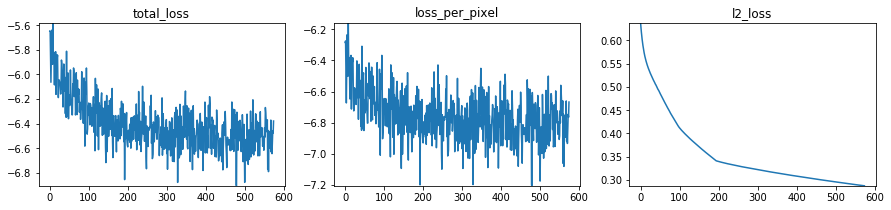

100%|██████████| 1000/1000 [02:38<00:00,  6.31it/s]


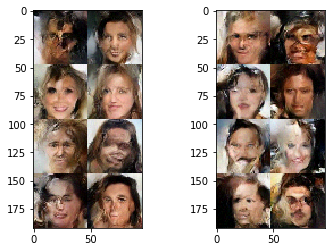

  5%|▌         | 51/1000 [00:08<02:31,  6.26it/s]

total_loss -6.3858185
loss_per_pixel -6.673222
l2_loss 0.28740382


 10%|█         | 101/1000 [00:16<02:26,  6.13it/s]

total_loss -6.5036526
loss_per_pixel -6.790941
l2_loss 0.28728873


 15%|█▌        | 151/1000 [00:24<02:17,  6.19it/s]

total_loss -6.3897815
loss_per_pixel -6.676954
l2_loss 0.28717247


 20%|██        | 201/1000 [00:32<02:08,  6.20it/s]

total_loss -6.504137
loss_per_pixel -6.7912025
l2_loss 0.28706557


 25%|██▌       | 251/1000 [00:40<01:59,  6.24it/s]

total_loss -6.7504525
loss_per_pixel -7.0374064
l2_loss 0.286954


 30%|███       | 301/1000 [00:47<01:51,  6.28it/s]

total_loss -6.163678
loss_per_pixel -6.4505277
l2_loss 0.28684956


 35%|███▌      | 351/1000 [00:55<01:43,  6.28it/s]

total_loss -6.510389
loss_per_pixel -6.7971168
l2_loss 0.28672773


 40%|████      | 401/1000 [01:03<01:35,  6.29it/s]

total_loss -6.5338945
loss_per_pixel -6.8205166
l2_loss 0.2866221


 45%|████▌     | 451/1000 [01:11<01:27,  6.30it/s]

total_loss -6.481073
loss_per_pixel -6.7675877
l2_loss 0.28651464


 50%|█████     | 501/1000 [01:19<01:19,  6.31it/s]

total_loss -6.550595
loss_per_pixel -6.837004
l2_loss 0.28640917


 55%|█████▌    | 551/1000 [01:27<01:11,  6.31it/s]

total_loss -6.4810886
loss_per_pixel -6.7673836
l2_loss 0.28629494


 60%|██████    | 601/1000 [01:35<01:03,  6.31it/s]

total_loss -6.5666714
loss_per_pixel -6.852857
l2_loss 0.2861857


 65%|██████▌   | 651/1000 [01:43<00:55,  6.32it/s]

total_loss -6.3630843
loss_per_pixel -6.649164
l2_loss 0.28608003


 70%|███████   | 701/1000 [01:50<00:47,  6.32it/s]

total_loss -6.7260475
loss_per_pixel -7.01203
l2_loss 0.2859827


 75%|███████▌  | 751/1000 [01:58<00:39,  6.32it/s]

total_loss -6.6408257
loss_per_pixel -6.9266872
l2_loss 0.2858614


 80%|████████  | 801/1000 [02:06<00:31,  6.33it/s]

total_loss -6.6570406
loss_per_pixel -6.9427915
l2_loss 0.28575101


 85%|████████▌ | 851/1000 [02:14<00:23,  6.33it/s]

total_loss -6.415725
loss_per_pixel -6.7013626
l2_loss 0.2856373


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.610735
loss_per_pixel -6.8962684
l2_loss 0.28553352


 95%|█████████▌| 951/1000 [02:30<00:07,  6.32it/s]

total_loss -6.3295336
loss_per_pixel -6.6149526
l2_loss 0.28541893


100%|█████████▉| 999/1000 [02:37<00:00,  6.32it/s]

total_loss -6.5498977
loss_per_pixel -6.835211
l2_loss 0.28531307


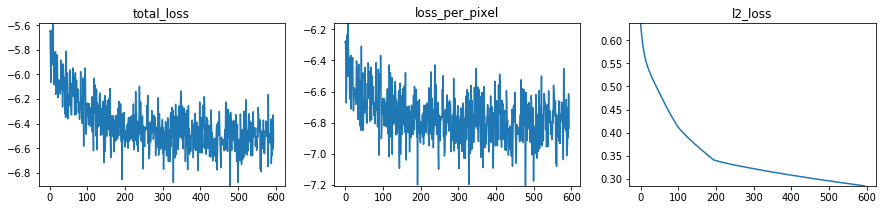

100%|██████████| 1000/1000 [02:38<00:00,  6.31it/s]


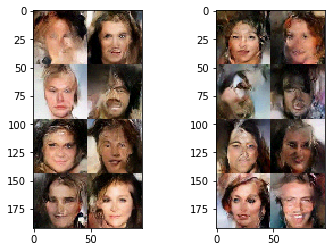

  5%|▌         | 51/1000 [00:07<02:27,  6.43it/s]

total_loss -6.381462
loss_per_pixel -6.6666694
l2_loss 0.28520715


 10%|█         | 101/1000 [00:15<02:21,  6.37it/s]

total_loss -6.801852
loss_per_pixel -7.0869503
l2_loss 0.28509796


 15%|█▌        | 151/1000 [00:23<02:14,  6.31it/s]

total_loss -6.5140123
loss_per_pixel -6.7989902
l2_loss 0.2849779


 20%|██        | 201/1000 [00:31<02:05,  6.36it/s]

total_loss -6.5175123
loss_per_pixel -6.802386
l2_loss 0.28487328


 25%|██▌       | 251/1000 [00:39<01:57,  6.35it/s]

total_loss -6.5849295
loss_per_pixel -6.8696804
l2_loss 0.28475115


 30%|███       | 301/1000 [00:47<01:50,  6.34it/s]

total_loss -6.3531833
loss_per_pixel -6.637842
l2_loss 0.28465873


 35%|███▌      | 351/1000 [00:55<01:42,  6.35it/s]

total_loss -6.863684
loss_per_pixel -7.148236
l2_loss 0.28455162


 40%|████      | 401/1000 [01:03<01:34,  6.34it/s]

total_loss -6.5147376
loss_per_pixel -6.799185
l2_loss 0.28444722


 45%|████▌     | 451/1000 [01:11<01:26,  6.32it/s]

total_loss -6.4677525
loss_per_pixel -6.7521
l2_loss 0.2843473


 50%|█████     | 501/1000 [01:19<01:18,  6.33it/s]

total_loss -6.681248
loss_per_pixel -6.9654803
l2_loss 0.28423202


 55%|█████▌    | 551/1000 [01:26<01:10,  6.34it/s]

total_loss -6.3708644
loss_per_pixel -6.6549907
l2_loss 0.28412637


 60%|██████    | 601/1000 [01:34<01:02,  6.34it/s]

total_loss -6.647684
loss_per_pixel -6.931701
l2_loss 0.28401688


 65%|██████▌   | 651/1000 [01:42<00:55,  6.34it/s]

total_loss -6.6750507
loss_per_pixel -6.958956
l2_loss 0.28390518


 70%|███████   | 701/1000 [01:50<00:47,  6.33it/s]

total_loss -6.3696995
loss_per_pixel -6.653498
l2_loss 0.28379893


 75%|███████▌  | 751/1000 [01:58<00:39,  6.33it/s]

total_loss -6.618994
loss_per_pixel -6.9026837
l2_loss 0.28368965


 80%|████████  | 801/1000 [02:06<00:31,  6.32it/s]

total_loss -6.6518826
loss_per_pixel -6.9354687
l2_loss 0.28358623


 85%|████████▌ | 851/1000 [02:14<00:23,  6.32it/s]

total_loss -6.4612346
loss_per_pixel -6.7447186
l2_loss 0.28348407


 90%|█████████ | 901/1000 [02:22<00:15,  6.32it/s]

total_loss -6.4650183
loss_per_pixel -6.748388
l2_loss 0.28336948


 95%|█████████▌| 951/1000 [02:30<00:07,  6.31it/s]

total_loss -6.4887567
loss_per_pixel -6.7720222
l2_loss 0.2832654


100%|█████████▉| 999/1000 [02:38<00:00,  6.31it/s]

total_loss -6.213274
loss_per_pixel -6.496432
l2_loss 0.2831579


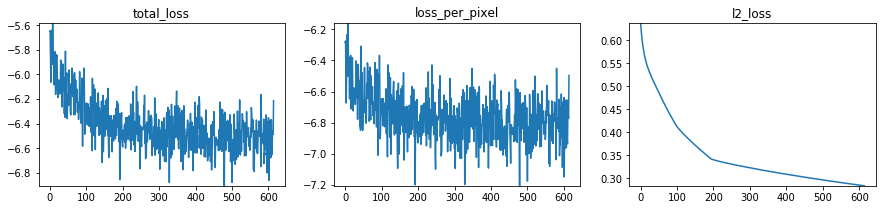

100%|██████████| 1000/1000 [02:38<00:00,  6.30it/s]


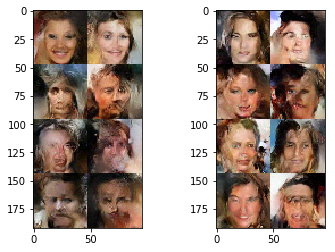

  5%|▌         | 51/1000 [00:08<02:34,  6.16it/s]

total_loss -6.2892823
loss_per_pixel -6.572327
l2_loss 0.2830448


 10%|█         | 101/1000 [00:16<02:24,  6.24it/s]

total_loss -6.7669363
loss_per_pixel -7.049869
l2_loss 0.28293294


 15%|█▌        | 151/1000 [00:24<02:16,  6.21it/s]

total_loss -6.4920707
loss_per_pixel -6.7748947
l2_loss 0.28282392


 20%|██        | 201/1000 [00:32<02:09,  6.18it/s]

total_loss -6.328619
loss_per_pixel -6.6113453
l2_loss 0.28272635


 25%|██▌       | 251/1000 [00:40<02:00,  6.21it/s]

total_loss -6.6236444
loss_per_pixel -6.9062614
l2_loss 0.2826169


 30%|███       | 301/1000 [00:48<01:52,  6.19it/s]

total_loss -6.587087
loss_per_pixel -6.869592
l2_loss 0.2825049


 35%|███▌      | 351/1000 [00:56<01:44,  6.20it/s]

total_loss -6.6442285
loss_per_pixel -6.926623
l2_loss 0.28239462


 40%|████      | 401/1000 [01:04<01:36,  6.19it/s]

total_loss -6.4692698
loss_per_pixel -6.7515583
l2_loss 0.2822883


 45%|████▌     | 451/1000 [01:12<01:28,  6.22it/s]

total_loss -6.6135798
loss_per_pixel -6.895759
l2_loss 0.28217953


 50%|█████     | 501/1000 [01:20<01:20,  6.22it/s]

total_loss -6.445032
loss_per_pixel -6.7271156
l2_loss 0.28208372


 55%|█████▌    | 551/1000 [01:28<01:12,  6.22it/s]

total_loss -6.571134
loss_per_pixel -6.853104
l2_loss 0.28197008


 60%|██████    | 601/1000 [01:36<01:04,  6.22it/s]

total_loss -6.526361
loss_per_pixel -6.808225
l2_loss 0.28186426


 65%|██████▌   | 651/1000 [01:44<00:56,  6.23it/s]

total_loss -6.874376
loss_per_pixel -7.156135
l2_loss 0.28175908


 70%|███████   | 701/1000 [01:52<00:47,  6.24it/s]

total_loss -6.2701526
loss_per_pixel -6.551798
l2_loss 0.2816452


 75%|███████▌  | 751/1000 [02:00<00:39,  6.23it/s]

total_loss -6.5085154
loss_per_pixel -6.79006
l2_loss 0.28154445


 80%|████████  | 801/1000 [02:08<00:31,  6.24it/s]

total_loss -6.5310583
loss_per_pixel -6.812504
l2_loss 0.28144556


 85%|████████▌ | 851/1000 [02:16<00:23,  6.25it/s]

total_loss -6.292797
loss_per_pixel -6.5741343
l2_loss 0.28133702


 90%|█████████ | 901/1000 [02:23<00:15,  6.26it/s]

total_loss -6.4586854
loss_per_pixel -6.7399216
l2_loss 0.2812363


 95%|█████████▌| 951/1000 [02:31<00:07,  6.28it/s]

total_loss -6.6947427
loss_per_pixel -6.975866
l2_loss 0.28112322


100%|█████████▉| 999/1000 [02:38<00:00,  6.29it/s]

total_loss -6.396915
loss_per_pixel -6.6779366
l2_loss 0.28102168


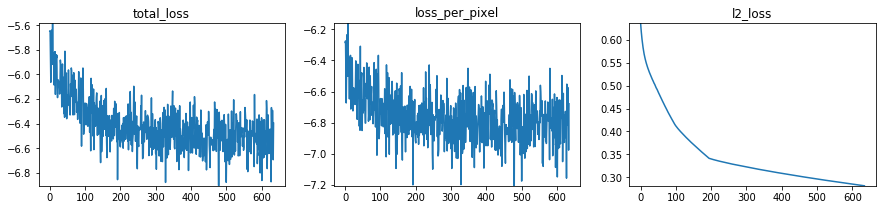

100%|██████████| 1000/1000 [02:39<00:00,  6.27it/s]


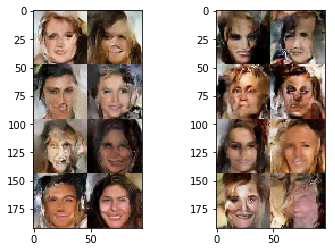

  5%|▌         | 51/1000 [00:07<02:24,  6.57it/s]

total_loss -6.334414
loss_per_pixel -6.615351
l2_loss 0.2809371


 10%|█         | 101/1000 [00:15<02:16,  6.58it/s]

total_loss -6.4422894
loss_per_pixel -6.723124
l2_loss 0.28083482


 15%|█▌        | 151/1000 [00:22<02:07,  6.64it/s]

total_loss -6.453647
loss_per_pixel -6.734382
l2_loss 0.28073487


 20%|██        | 201/1000 [00:30<02:00,  6.64it/s]

total_loss -6.334498
loss_per_pixel -6.6151237
l2_loss 0.28062582


 25%|██▌       | 251/1000 [00:37<01:52,  6.64it/s]

total_loss -6.3060813
loss_per_pixel -6.586607
l2_loss 0.28052557


 30%|███       | 301/1000 [00:45<01:44,  6.68it/s]

total_loss -6.528197
loss_per_pixel -6.8086095
l2_loss 0.28041273


 35%|███▌      | 351/1000 [00:52<01:37,  6.65it/s]

total_loss -6.469408
loss_per_pixel -6.7497096
l2_loss 0.28030145


 40%|████      | 401/1000 [01:00<01:30,  6.63it/s]

total_loss -6.488722
loss_per_pixel -6.7689157
l2_loss 0.28019366


 45%|████▌     | 451/1000 [01:08<01:22,  6.62it/s]

total_loss -6.517167
loss_per_pixel -6.7972617
l2_loss 0.2800947


 50%|█████     | 501/1000 [01:15<01:15,  6.63it/s]

total_loss -6.2847567
loss_per_pixel -6.564756
l2_loss 0.27999935


 55%|█████▌    | 551/1000 [01:22<01:07,  6.66it/s]

total_loss -6.674717
loss_per_pixel -6.9546084
l2_loss 0.27989173


 60%|██████    | 601/1000 [01:30<00:59,  6.67it/s]

total_loss -6.436866
loss_per_pixel -6.7166495
l2_loss 0.2797837


 65%|██████▌   | 651/1000 [01:37<00:52,  6.68it/s]

total_loss -6.46102
loss_per_pixel -6.7406926
l2_loss 0.27967247


 70%|███████   | 701/1000 [01:45<00:44,  6.67it/s]

total_loss -6.539693
loss_per_pixel -6.8192616
l2_loss 0.2795689


 75%|███████▌  | 751/1000 [01:52<00:37,  6.67it/s]

total_loss -6.562386
loss_per_pixel -6.8418427
l2_loss 0.27945653


 80%|████████  | 801/1000 [02:00<00:29,  6.67it/s]

total_loss -6.548637
loss_per_pixel -6.8279915
l2_loss 0.27935442


 85%|████████▌ | 851/1000 [02:07<00:22,  6.67it/s]

total_loss -6.694454
loss_per_pixel -6.973705
l2_loss 0.2792507


 90%|█████████ | 901/1000 [02:15<00:14,  6.63it/s]

total_loss -6.5079284
loss_per_pixel -6.787068
l2_loss 0.27913958


 95%|█████████▌| 951/1000 [02:23<00:07,  6.63it/s]

total_loss -6.634069
loss_per_pixel -6.913103
l2_loss 0.279034


100%|█████████▉| 999/1000 [02:30<00:00,  6.62it/s]

total_loss -6.4438777
loss_per_pixel -6.722803
l2_loss 0.2789253


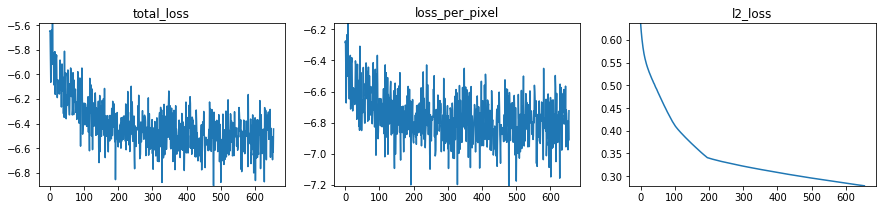

100%|██████████| 1000/1000 [02:31<00:00,  6.61it/s]


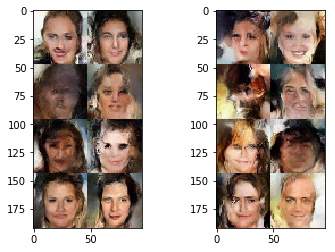

  5%|▌         | 51/1000 [00:07<02:26,  6.50it/s]

total_loss -6.621999
loss_per_pixel -6.9008126
l2_loss 0.27881402


 10%|█         | 101/1000 [00:15<02:21,  6.36it/s]

total_loss -6.690528
loss_per_pixel -6.9692383
l2_loss 0.2787103


 15%|█▌        | 151/1000 [00:23<02:12,  6.41it/s]

total_loss -6.378936
loss_per_pixel -6.6575427
l2_loss 0.2786071


 20%|██        | 201/1000 [00:31<02:04,  6.44it/s]

total_loss -6.4996557
loss_per_pixel -6.778169
l2_loss 0.27851358


 25%|██▌       | 251/1000 [00:39<01:56,  6.43it/s]

total_loss -6.665465
loss_per_pixel -6.9438653
l2_loss 0.27840063


 30%|███       | 301/1000 [00:46<01:49,  6.41it/s]

total_loss -6.6675177
loss_per_pixel -6.945822
l2_loss 0.2783041


 35%|███▌      | 351/1000 [00:54<01:41,  6.41it/s]

total_loss -6.498913
loss_per_pixel -6.7771125
l2_loss 0.27819982


 40%|████      | 401/1000 [01:02<01:33,  6.43it/s]

total_loss -6.3111115
loss_per_pixel -6.5892024
l2_loss 0.2780909


 45%|████▌     | 451/1000 [01:09<01:24,  6.47it/s]

total_loss -6.5506907
loss_per_pixel -6.8286743
l2_loss 0.27798358


 50%|█████     | 501/1000 [01:17<01:16,  6.49it/s]

total_loss -6.5812325
loss_per_pixel -6.8591228
l2_loss 0.27789035


 55%|█████▌    | 551/1000 [01:24<01:08,  6.52it/s]

total_loss -6.41626
loss_per_pixel -6.6940455
l2_loss 0.2777856


 60%|██████    | 601/1000 [01:31<01:01,  6.53it/s]

total_loss -6.4804235
loss_per_pixel -6.7581067
l2_loss 0.27768308


 65%|██████▌   | 651/1000 [01:39<00:53,  6.53it/s]

total_loss -6.677509
loss_per_pixel -6.955076
l2_loss 0.27756757


 70%|███████   | 701/1000 [01:47<00:45,  6.54it/s]

total_loss -6.1823497
loss_per_pixel -6.459826
l2_loss 0.27747628


 75%|███████▌  | 751/1000 [01:54<00:38,  6.55it/s]

total_loss -6.344695
loss_per_pixel -6.622068
l2_loss 0.2773727


 80%|████████  | 801/1000 [02:02<00:30,  6.56it/s]

total_loss -6.752894
loss_per_pixel -7.0301666
l2_loss 0.27727276


 85%|████████▌ | 851/1000 [02:09<00:22,  6.55it/s]

total_loss -6.7026606
loss_per_pixel -6.979835
l2_loss 0.27717468


 90%|█████████ | 901/1000 [02:17<00:15,  6.56it/s]

total_loss -6.551967
loss_per_pixel -6.829043
l2_loss 0.27707562


 95%|█████████▌| 951/1000 [02:24<00:07,  6.57it/s]

total_loss -6.3126616
loss_per_pixel -6.5896354
l2_loss 0.27697358


100%|█████████▉| 999/1000 [02:31<00:00,  6.58it/s]

total_loss -6.461975
loss_per_pixel -6.7388387
l2_loss 0.27686334


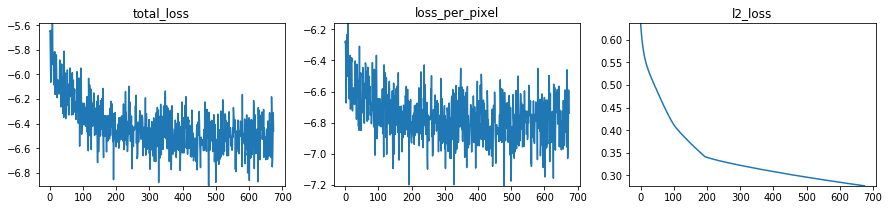

100%|██████████| 1000/1000 [02:32<00:00,  6.57it/s]


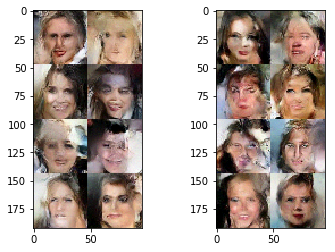

  5%|▌         | 51/1000 [00:07<02:27,  6.44it/s]

total_loss -6.549424
loss_per_pixel -6.826182
l2_loss 0.2767576


 10%|█         | 101/1000 [00:15<02:15,  6.62it/s]

total_loss -6.278831
loss_per_pixel -6.555488
l2_loss 0.27665693


 15%|█▌        | 151/1000 [00:22<02:08,  6.63it/s]

total_loss -6.7534566
loss_per_pixel -7.0300097
l2_loss 0.27655315


 20%|██        | 201/1000 [00:30<02:00,  6.62it/s]

total_loss -6.586231
loss_per_pixel -6.8626685
l2_loss 0.2764375


 25%|██▌       | 251/1000 [00:38<01:54,  6.55it/s]

total_loss -6.505457
loss_per_pixel -6.7817883
l2_loss 0.2763315


 30%|███       | 301/1000 [00:45<01:46,  6.56it/s]

total_loss -6.533609
loss_per_pixel -6.809835
l2_loss 0.2762261


 35%|███▌      | 351/1000 [00:53<01:39,  6.54it/s]

total_loss -6.4115977
loss_per_pixel -6.687729
l2_loss 0.27613127


 40%|████      | 401/1000 [01:01<01:31,  6.56it/s]

total_loss -6.644665
loss_per_pixel -6.9206967
l2_loss 0.2760318


 45%|████▌     | 451/1000 [01:08<01:23,  6.54it/s]

total_loss -6.443823
loss_per_pixel -6.7197604
l2_loss 0.2759375


 50%|█████     | 501/1000 [01:16<01:16,  6.52it/s]

total_loss -6.520118
loss_per_pixel -6.79596
l2_loss 0.27584192


 55%|█████▌    | 551/1000 [01:24<01:08,  6.52it/s]

total_loss -6.449175
loss_per_pixel -6.7249103
l2_loss 0.2757352


 60%|██████    | 601/1000 [01:32<01:01,  6.52it/s]

total_loss -6.5779166
loss_per_pixel -6.853556
l2_loss 0.27563933


 65%|██████▌   | 651/1000 [01:39<00:53,  6.52it/s]

total_loss -6.4301
loss_per_pixel -6.7056317
l2_loss 0.27553168


 70%|███████   | 701/1000 [01:47<00:45,  6.51it/s]

total_loss -6.56504
loss_per_pixel -6.8404584
l2_loss 0.27541807


 75%|███████▌  | 751/1000 [01:55<00:38,  6.53it/s]

total_loss -6.1891823
loss_per_pixel -6.464506
l2_loss 0.2753241


 80%|████████  | 801/1000 [02:02<00:30,  6.53it/s]

total_loss -6.6135755
loss_per_pixel -6.8887963
l2_loss 0.27522102


 85%|████████▌ | 851/1000 [02:10<00:22,  6.53it/s]

total_loss -6.4201875
loss_per_pixel -6.695307
l2_loss 0.27511936


 90%|█████████ | 901/1000 [02:17<00:15,  6.55it/s]

total_loss -6.388709
loss_per_pixel -6.6637325
l2_loss 0.27502364


 95%|█████████▌| 951/1000 [02:25<00:07,  6.55it/s]

total_loss -6.671905
loss_per_pixel -6.946833
l2_loss 0.27492815


100%|█████████▉| 999/1000 [02:32<00:00,  6.55it/s]

total_loss -6.501411
loss_per_pixel -6.776238
l2_loss 0.2748272


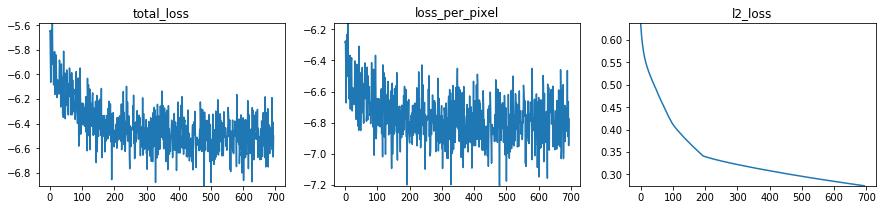

100%|██████████| 1000/1000 [02:32<00:00,  6.54it/s]


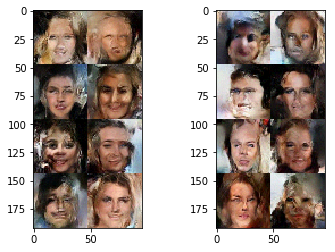

  5%|▌         | 51/1000 [00:08<02:30,  6.29it/s]

total_loss -6.4860716
loss_per_pixel -6.76079
l2_loss 0.2747183


 10%|█         | 101/1000 [00:15<02:21,  6.36it/s]

total_loss -6.6807957
loss_per_pixel -6.955417
l2_loss 0.27462134


 15%|█▌        | 151/1000 [00:23<02:12,  6.43it/s]

total_loss -6.427825
loss_per_pixel -6.702335
l2_loss 0.2745097


 20%|██        | 201/1000 [00:31<02:03,  6.47it/s]

total_loss -6.512296
loss_per_pixel -6.786712
l2_loss 0.27441606


 25%|██▌       | 251/1000 [00:39<01:56,  6.41it/s]

total_loss -6.5723743
loss_per_pixel -6.8466926
l2_loss 0.2743184


 30%|███       | 301/1000 [00:46<01:49,  6.41it/s]

total_loss -6.679308
loss_per_pixel -6.9535165
l2_loss 0.2742085


 35%|███▌      | 351/1000 [00:54<01:41,  6.41it/s]

total_loss -6.7812138
loss_per_pixel -7.0553246
l2_loss 0.2741109


 40%|████      | 401/1000 [01:02<01:33,  6.41it/s]

total_loss -6.4814005
loss_per_pixel -6.7554193
l2_loss 0.2740186


 45%|████▌     | 451/1000 [01:10<01:25,  6.43it/s]

total_loss -6.413387
loss_per_pixel -6.6873074
l2_loss 0.27392066


 50%|█████     | 501/1000 [01:17<01:17,  6.45it/s]

total_loss -6.619877
loss_per_pixel -6.893699
l2_loss 0.27382207


 55%|█████▌    | 551/1000 [01:25<01:09,  6.43it/s]

total_loss -6.657762
loss_per_pixel -6.9314938
l2_loss 0.27373174


 60%|██████    | 601/1000 [01:33<01:01,  6.45it/s]

total_loss -6.6101604
loss_per_pixel -6.883782
l2_loss 0.2736215


 65%|██████▌   | 651/1000 [01:41<00:54,  6.43it/s]

total_loss -6.619082
loss_per_pixel -6.8926053
l2_loss 0.27352336


 70%|███████   | 701/1000 [01:48<00:46,  6.44it/s]

total_loss -6.5980844
loss_per_pixel -6.8715177
l2_loss 0.27343333


 75%|███████▌  | 751/1000 [01:56<00:38,  6.45it/s]

total_loss -6.443802
loss_per_pixel -6.717125
l2_loss 0.27332294


 80%|████████  | 801/1000 [02:03<00:30,  6.47it/s]

total_loss -6.4822903
loss_per_pixel -6.755516
l2_loss 0.27322578


 85%|████████▌ | 851/1000 [02:11<00:22,  6.49it/s]

total_loss -6.6263685
loss_per_pixel -6.8995
l2_loss 0.2731315


 90%|█████████ | 901/1000 [02:18<00:15,  6.51it/s]

total_loss -6.6168103
loss_per_pixel -6.8898435
l2_loss 0.27303305


 95%|█████████▌| 951/1000 [02:25<00:07,  6.52it/s]

total_loss -6.501452
loss_per_pixel -6.7743955
l2_loss 0.27294365


100%|█████████▉| 999/1000 [02:32<00:00,  6.53it/s]

total_loss -6.7156577
loss_per_pixel -6.988498
l2_loss 0.2728407


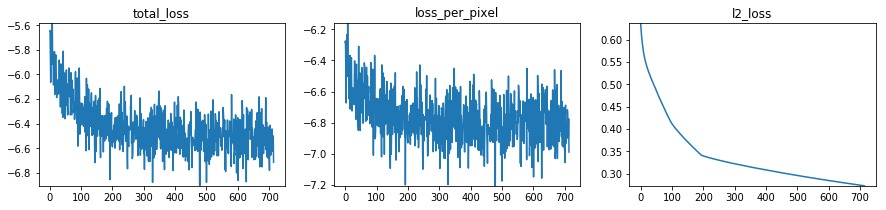

100%|██████████| 1000/1000 [02:33<00:00,  6.52it/s]


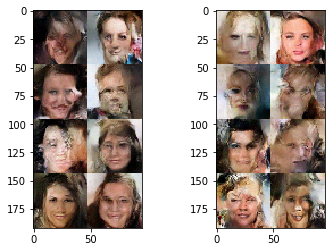

  5%|▌         | 51/1000 [00:08<02:29,  6.35it/s]

total_loss -6.6405296
loss_per_pixel -6.9132595
l2_loss 0.27273005


 10%|█         | 101/1000 [00:15<02:20,  6.42it/s]

total_loss -6.5643234
loss_per_pixel -6.8369546
l2_loss 0.27263105


 15%|█▌        | 151/1000 [00:23<02:11,  6.46it/s]

total_loss -6.3310122
loss_per_pixel -6.603544
l2_loss 0.27253193


 20%|██        | 201/1000 [00:31<02:04,  6.41it/s]

total_loss -6.6398864
loss_per_pixel -6.9123178
l2_loss 0.27243155


 25%|██▌       | 251/1000 [00:39<01:58,  6.34it/s]

total_loss -6.5646706
loss_per_pixel -6.836983
l2_loss 0.27231276


 30%|███       | 301/1000 [00:47<01:49,  6.35it/s]

total_loss -6.4389334
loss_per_pixel -6.711153
l2_loss 0.27221942


 35%|███▌      | 351/1000 [00:55<01:41,  6.36it/s]

total_loss -6.5530276
loss_per_pixel -6.8251443
l2_loss 0.27211678


 40%|████      | 401/1000 [01:02<01:33,  6.38it/s]

total_loss -6.363309
loss_per_pixel -6.635327
l2_loss 0.2720179


 45%|████▌     | 451/1000 [01:10<01:25,  6.40it/s]

total_loss -6.519565
loss_per_pixel -6.791491
l2_loss 0.2719259


 50%|█████     | 501/1000 [01:17<01:17,  6.43it/s]

total_loss -6.5408306
loss_per_pixel -6.81265
l2_loss 0.27181938


 55%|█████▌    | 551/1000 [01:25<01:09,  6.44it/s]

total_loss -6.5263014
loss_per_pixel -6.7980175
l2_loss 0.271716


 60%|██████    | 601/1000 [01:33<01:02,  6.42it/s]

total_loss -6.492689
loss_per_pixel -6.764315
l2_loss 0.27162585


 65%|██████▌   | 651/1000 [01:41<00:54,  6.43it/s]

total_loss -6.517864
loss_per_pixel -6.78939
l2_loss 0.271526


 70%|███████   | 701/1000 [01:49<00:46,  6.42it/s]

total_loss -6.610225
loss_per_pixel -6.881653
l2_loss 0.27142772


 75%|███████▌  | 751/1000 [01:57<00:38,  6.41it/s]

total_loss -6.551896
loss_per_pixel -6.823235
l2_loss 0.27133918


 80%|████████  | 801/1000 [02:05<00:31,  6.41it/s]

total_loss -6.470199
loss_per_pixel -6.741438
l2_loss 0.27123874


 85%|████████▌ | 851/1000 [02:13<00:23,  6.40it/s]

total_loss -6.292181
loss_per_pixel -6.563326
l2_loss 0.27114475


 90%|█████████ | 901/1000 [02:20<00:15,  6.39it/s]

total_loss -6.629388
loss_per_pixel -6.900436
l2_loss 0.27104798


 95%|█████████▌| 951/1000 [02:28<00:07,  6.40it/s]

total_loss -6.3927283
loss_per_pixel -6.663696
l2_loss 0.2709674


100%|█████████▉| 999/1000 [02:36<00:00,  6.39it/s]

total_loss -6.5225334
loss_per_pixel -6.793407
l2_loss 0.27087364


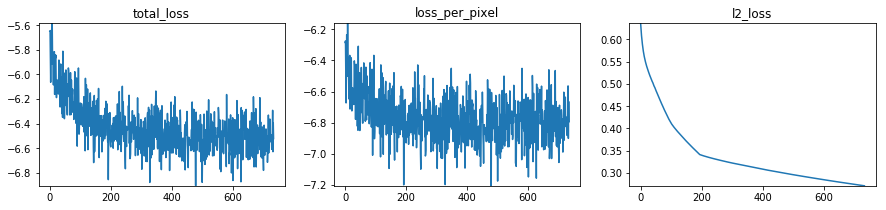

100%|██████████| 1000/1000 [02:36<00:00,  6.38it/s]


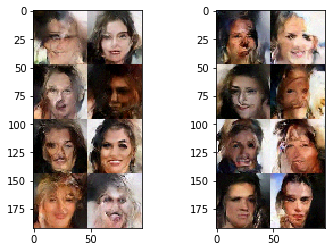

  5%|▌         | 51/1000 [00:07<02:26,  6.48it/s]

total_loss -6.3263497
loss_per_pixel -6.5971127
l2_loss 0.27076304


 10%|█         | 101/1000 [00:15<02:20,  6.41it/s]

total_loss -6.525473
loss_per_pixel -6.7961354
l2_loss 0.2706625


 15%|█▌        | 151/1000 [00:23<02:10,  6.51it/s]

total_loss -6.548213
loss_per_pixel -6.818787
l2_loss 0.27057394


 20%|██        | 201/1000 [00:31<02:03,  6.48it/s]

total_loss -6.366595
loss_per_pixel -6.637073
l2_loss 0.27047837


 25%|██▌       | 251/1000 [00:38<01:55,  6.47it/s]

total_loss -6.4635
loss_per_pixel -6.7338796
l2_loss 0.27037933


 30%|███       | 301/1000 [00:46<01:47,  6.48it/s]

total_loss -6.408512
loss_per_pixel -6.6787906
l2_loss 0.27027857


 35%|███▌      | 351/1000 [00:54<01:40,  6.45it/s]

total_loss -6.5689306
loss_per_pixel -6.839112
l2_loss 0.27018142


 40%|████      | 401/1000 [01:02<01:33,  6.43it/s]

total_loss -6.749645
loss_per_pixel -7.019732
l2_loss 0.27008656


 45%|████▌     | 451/1000 [01:10<01:25,  6.42it/s]

total_loss -6.6462197
loss_per_pixel -6.9161983
l2_loss 0.26997837


 50%|█████     | 501/1000 [01:17<01:17,  6.43it/s]

total_loss -6.614406
loss_per_pixel -6.8842874
l2_loss 0.26988143


 55%|█████▌    | 551/1000 [01:25<01:09,  6.43it/s]

total_loss -6.477405
loss_per_pixel -6.7471886
l2_loss 0.26978356


 60%|██████    | 601/1000 [01:33<01:02,  6.43it/s]

total_loss -6.527927
loss_per_pixel -6.79761
l2_loss 0.26968268


 65%|██████▌   | 651/1000 [01:41<00:54,  6.42it/s]

total_loss -6.653554
loss_per_pixel -6.92314
l2_loss 0.26958624


 70%|███████   | 701/1000 [01:49<00:46,  6.43it/s]

total_loss -6.7395134
loss_per_pixel -7.009007
l2_loss 0.26949346


 75%|███████▌  | 751/1000 [01:57<00:38,  6.41it/s]

total_loss -6.6912146
loss_per_pixel -6.960612
l2_loss 0.26939705


 80%|████████  | 801/1000 [02:05<00:31,  6.40it/s]

total_loss -6.457436
loss_per_pixel -6.726731
l2_loss 0.26929456


 85%|████████▌ | 851/1000 [02:12<00:23,  6.40it/s]

total_loss -6.4775505
loss_per_pixel -6.746755
l2_loss 0.2692046


 90%|█████████ | 901/1000 [02:20<00:15,  6.41it/s]

total_loss -6.209086
loss_per_pixel -6.478195
l2_loss 0.26910943


 95%|█████████▌| 951/1000 [02:28<00:07,  6.41it/s]

total_loss -6.413735
loss_per_pixel -6.682754
l2_loss 0.26901892


100%|█████████▉| 999/1000 [02:35<00:00,  6.40it/s]

total_loss -6.7215285
loss_per_pixel -6.990448
l2_loss 0.26891944


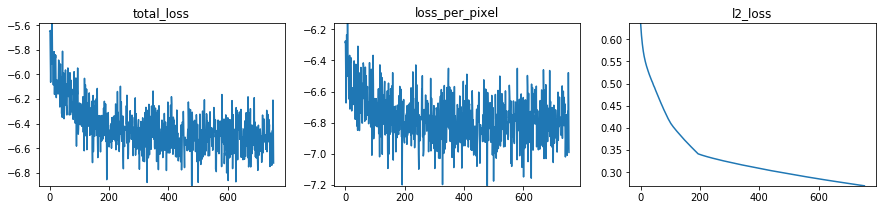

100%|██████████| 1000/1000 [02:37<00:00,  6.34it/s]


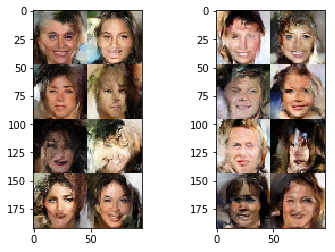

  5%|▌         | 51/1000 [00:07<02:25,  6.54it/s]

total_loss -6.5263743
loss_per_pixel -6.7951946
l2_loss 0.2688204


 10%|█         | 101/1000 [00:15<02:16,  6.58it/s]

total_loss -6.416137
loss_per_pixel -6.684856
l2_loss 0.26871857


 15%|█▌        | 151/1000 [00:22<02:08,  6.59it/s]

total_loss -6.616944
loss_per_pixel -6.8855686
l2_loss 0.2686248


 20%|██        | 201/1000 [00:30<02:00,  6.61it/s]

total_loss -6.7924833
loss_per_pixel -7.061014
l2_loss 0.26853076


 25%|██▌       | 251/1000 [00:38<01:53,  6.59it/s]

total_loss -6.6167107
loss_per_pixel -6.8851314
l2_loss 0.2684205


 30%|███       | 301/1000 [00:45<01:46,  6.59it/s]

total_loss -6.714259
loss_per_pixel -6.9825864
l2_loss 0.26832744


 35%|███▌      | 351/1000 [00:53<01:38,  6.56it/s]

total_loss -6.4397936
loss_per_pixel -6.7080226
l2_loss 0.2682292


 40%|████      | 401/1000 [01:01<01:31,  6.57it/s]

total_loss -6.655342
loss_per_pixel -6.9234715
l2_loss 0.2681295


 45%|████▌     | 451/1000 [01:08<01:23,  6.56it/s]

total_loss -6.751204
loss_per_pixel -7.0192356
l2_loss 0.26803163


 50%|█████     | 501/1000 [01:16<01:16,  6.51it/s]

total_loss -6.5269766
loss_per_pixel -6.794911
l2_loss 0.2679342


 55%|█████▌    | 551/1000 [01:24<01:09,  6.50it/s]

total_loss -6.508955
loss_per_pixel -6.7767825
l2_loss 0.26782736


 60%|██████    | 601/1000 [01:32<01:01,  6.49it/s]

total_loss -6.5417595
loss_per_pixel -6.8094845
l2_loss 0.26772508


 65%|██████▌   | 651/1000 [01:40<00:53,  6.49it/s]

total_loss -6.483167
loss_per_pixel -6.7508035
l2_loss 0.26763627


 70%|███████   | 701/1000 [01:48<00:46,  6.48it/s]

total_loss -6.3909388
loss_per_pixel -6.6584835
l2_loss 0.26754463


 75%|███████▌  | 751/1000 [01:55<00:38,  6.48it/s]

total_loss -6.461094
loss_per_pixel -6.728541
l2_loss 0.26744717


 80%|████████  | 801/1000 [02:03<00:30,  6.47it/s]

total_loss -6.3176317
loss_per_pixel -6.5849805
l2_loss 0.26734862


 85%|████████▌ | 851/1000 [02:11<00:23,  6.48it/s]

total_loss -6.309827
loss_per_pixel -6.577083
l2_loss 0.26725608


 90%|█████████ | 901/1000 [02:19<00:15,  6.47it/s]

total_loss -6.404861
loss_per_pixel -6.672014
l2_loss 0.26715323


 95%|█████████▌| 951/1000 [02:27<00:07,  6.46it/s]

total_loss -6.4135137
loss_per_pixel -6.680568
l2_loss 0.26705462


100%|█████████▉| 999/1000 [02:34<00:00,  6.46it/s]

total_loss -6.524157
loss_per_pixel -6.7911263
l2_loss 0.2669694


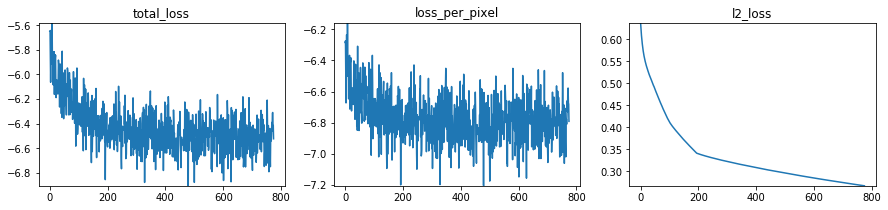

100%|██████████| 1000/1000 [02:35<00:00,  6.44it/s]


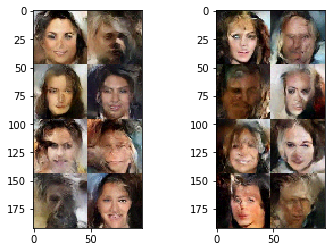

  5%|▌         | 51/1000 [00:08<02:29,  6.36it/s]

total_loss -6.6148386
loss_per_pixel -6.8817143
l2_loss 0.26687568


 10%|█         | 101/1000 [00:15<02:22,  6.32it/s]

total_loss -6.568057
loss_per_pixel -6.834842
l2_loss 0.26678532


 15%|█▌        | 151/1000 [00:23<02:14,  6.33it/s]

total_loss -6.5337167
loss_per_pixel -6.8004
l2_loss 0.2666832


 20%|██        | 201/1000 [00:31<02:04,  6.42it/s]

total_loss -6.6076174
loss_per_pixel -6.874211
l2_loss 0.26659364


 25%|██▌       | 251/1000 [00:38<01:56,  6.45it/s]

total_loss -6.5113463
loss_per_pixel -6.777847
l2_loss 0.26650035


 30%|███       | 301/1000 [00:46<01:48,  6.46it/s]

total_loss -6.7084975
loss_per_pixel -6.9749017
l2_loss 0.26640436


 35%|███▌      | 351/1000 [00:54<01:40,  6.47it/s]

total_loss -6.473545
loss_per_pixel -6.739868
l2_loss 0.26632303


 40%|████      | 400/1000 [01:01<01:32,  6.45it/s]

total_loss -6.370383
loss_per_pixel -6.6366024
l2_loss 0.2662197


 45%|████▌     | 451/1000 [01:09<01:24,  6.47it/s]

total_loss -6.4923744
loss_per_pixel -6.7584844
l2_loss 0.26610994


 50%|█████     | 501/1000 [01:17<01:16,  6.48it/s]

total_loss -6.414511
loss_per_pixel -6.680534
l2_loss 0.26602262


 55%|█████▌    | 551/1000 [01:24<01:09,  6.49it/s]

total_loss -6.2875805
loss_per_pixel -6.553505
l2_loss 0.26592445


 60%|██████    | 601/1000 [01:32<01:01,  6.48it/s]

total_loss -6.3817124
loss_per_pixel -6.6475444
l2_loss 0.265832


 65%|██████▌   | 651/1000 [01:40<00:53,  6.49it/s]

total_loss -6.7351575
loss_per_pixel -7.0008965
l2_loss 0.2657389


 70%|███████   | 701/1000 [01:47<00:46,  6.50it/s]

total_loss -6.475681
loss_per_pixel -6.74132
l2_loss 0.2656392


 75%|███████▌  | 751/1000 [01:55<00:38,  6.49it/s]

total_loss -6.2423806
loss_per_pixel -6.507921
l2_loss 0.26554048


 80%|████████  | 801/1000 [02:03<00:30,  6.47it/s]

total_loss -6.7365646
loss_per_pixel -7.0020084
l2_loss 0.2654439


 85%|████████▌ | 851/1000 [02:11<00:23,  6.47it/s]

total_loss -6.6806383
loss_per_pixel -6.9459815
l2_loss 0.26534325


 90%|█████████ | 901/1000 [02:19<00:15,  6.48it/s]

total_loss -6.579634
loss_per_pixel -6.8448834
l2_loss 0.2652491


 95%|█████████▌| 951/1000 [02:26<00:07,  6.48it/s]

total_loss -6.528408
loss_per_pixel -6.793556
l2_loss 0.26514813


100%|█████████▉| 999/1000 [02:34<00:00,  6.48it/s]

total_loss -6.303177
loss_per_pixel -6.5682263
l2_loss 0.2650497


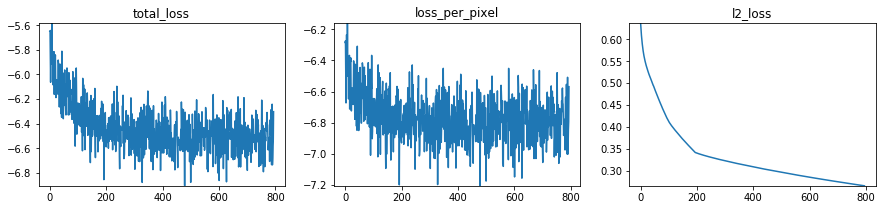

100%|██████████| 1000/1000 [02:34<00:00,  6.46it/s]


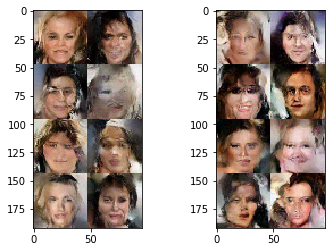

In [38]:
for i in range(25):
    utils.trainer(
        sess, 
        num_steps=1000, 
        train_op=train_op, 
        feed_dict_fn=lambda: {lr_ph: 0.0001, beta_ph: 1.0}, 
        metrics=[metrics], 
        hooks=[plot_metrics_hook]
    )
    
    plt.subplot(121)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 0.9}))
    plt.subplot(122)
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: 1.0}))
    plt.show()

## Generate samples for different temperatures

We start from zero T i.e. the input standard deviation is zero. We can see simialar 
conclusion as in paper, sampling from reduced temperature yield in better results.

beta=    0.0000


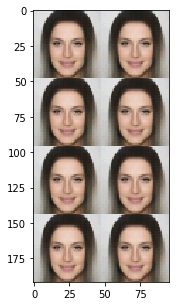

beta=    0.1667


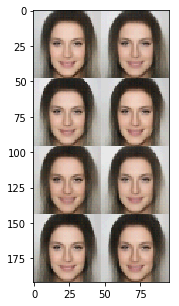

beta=    0.3333


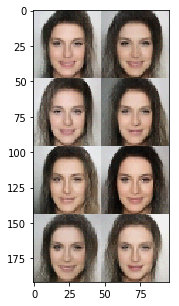

beta=    0.5000


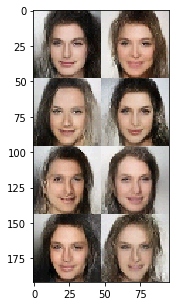

beta=    0.6667


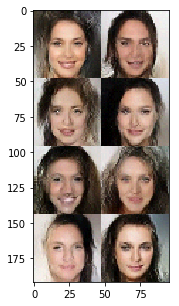

beta=    0.8333


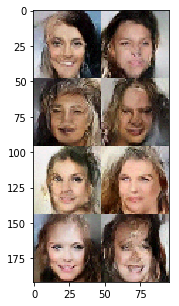

beta=    1.0000


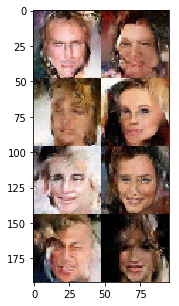

beta=    1.1667


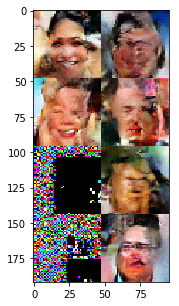

beta=    1.3333


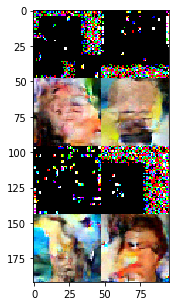

beta=    1.5000


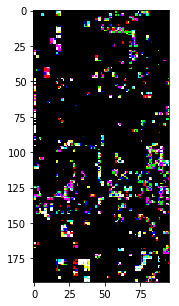

In [55]:
for beta in np.linspace(0.0, 1.5, 10):
    print(f"beta={beta:10.4f}")
    plt.figure(figsize=(5, 5))
    plt.imshow(utils.plot_grid(x_flow_sampled_uint).eval({lr_ph: 0.0, beta_ph: beta}))
    plt.show()

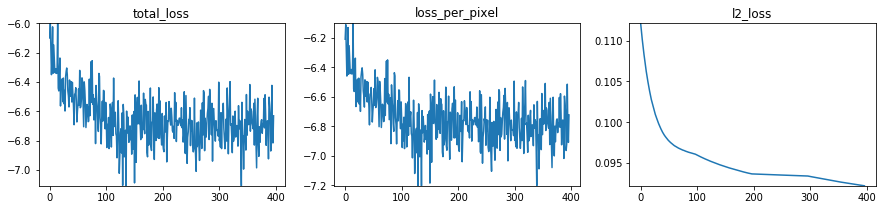

In [56]:
plot_metrics_hook.run()

## Investigate latent space statistics
Check whether the distribution of the latent variables fits the prior distribution. We should observe gaussian

In [57]:
y_flatten_np = np.concatenate([y_flatten.eval({lr_ph: 0.0, beta_ph: 1.0}) for i in range(100)])
y_flatten_np.shape

(800, 864)

### 2D scatter plot for 0-th and 1-st latent variable

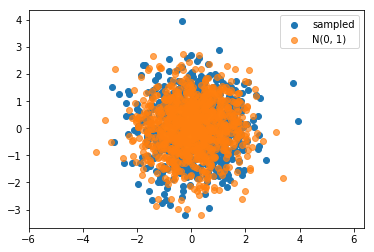

In [58]:
plt.scatter(y_flatten_np[:, 0], y_flatten_np[:, 1], label="sampled")
plt.scatter(*np.random.randn(2, 1000), alpha=0.7, label="N(0, 1)")
plt.axis("equal")
plt.legend()

### Histogram of all activations of Y latent variable

(-4, 4)

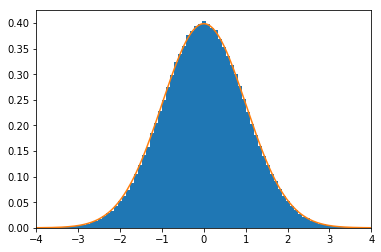

In [59]:
_ = plt.hist(y_flatten_np.reshape([-1]), 100, normed=True)
x_axis = np.arange(-4, 4, 0.01)
plt.plot(x_axis, norm.pdf(x_axis, 0, 1))
plt.xlim([-4, 4])

### Histogram of all activations of Z latent variable

(-4, 4)

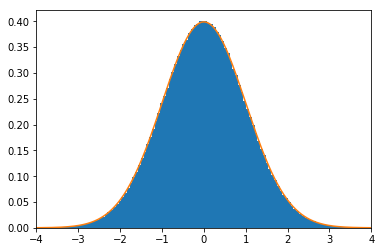

In [60]:
z_flatten_np = np.concatenate([z_flatten.eval({lr_ph: 0.0, beta_ph: 1.0}) for i in range(100)])
_ = plt.hist(z_flatten_np.reshape([-1]), 200, normed=True)
x_axis = np.arange(-4, 4, 0.01)
plt.plot(x_axis, norm.pdf(x_axis, 0, 1))
plt.xlim([-4, 4])

## Tuning temperature separatelly for Y and Z latent variables

This seems to generate the best results when the temperature of the distribution of the Z variable is close 
or equal zero. 

In [61]:
beta_y_ph = tf.placeholder(tf.float32, [])
beta_z_ph = tf.placeholder(tf.float32, [])
prior_y_prim = tfd.MultivariateNormalDiag(
    loc=tf.zeros_like(y_flatten), scale_diag=beta_y_ph * tf.ones_like(y_flatten))
prior_z_prim = tfd.MultivariateNormalDiag(
    loc=tf.zeros_like(z_flatten), scale_diag=beta_z_ph * tf.ones_like(z_flatten))

In [62]:
sample_y_flatten_prim = prior_y_prim.sample()
sample_y_prim = tf.reshape(sample_y_flatten_prim, y.shape.as_list())
sample_z_prim = tf.reshape(prior_z_prim.sample(), z.shape.as_list())
sampled_logdet_prim = prior_y_prim.log_prob(sample_y_flatten_prim)

In [63]:
inverse_flow_prim = sample_y_prim, sampled_logdet_prim, sample_z_prim
sampled_flow_prim = model_flow(inverse_flow_prim, forward=False)

FactorOutLayer/Backward/Scale3          : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
AffineCouplingLayer/Backward/           : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
InvertibleConv1x1Layer/Backward/        : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormScaleLayer/Backward/             : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormBiasLayer/Backward/              : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ChainLayer/Backward/                    : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormLayer/Backward/                  : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ChainLayer/Backward/Step22              : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
AffineCouplingLayer/Backward/           : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
InvertibleConv1x1Layer/Backward/        : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormScaleLayer/Backward/             : y=[8, 6, 6, 48]	z=[8, 6, 6, 144]	logdet=[8]
ActnormBiasLayer/Backward/              : y=[8, 6, 6, 

In [64]:
x_flow_sampled_prim, _, _ = sampled_flow_prim

### Efect of the temperature on the Z latent variable

beta=    0.0000


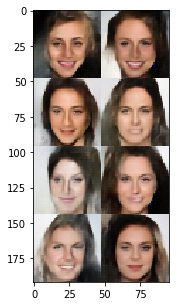

beta=    0.1111


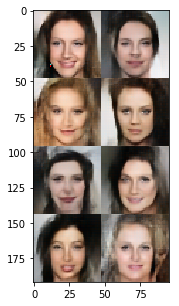

beta=    0.2222


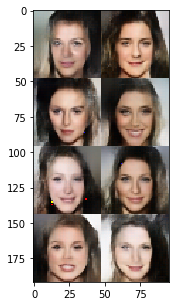

beta=    0.3333


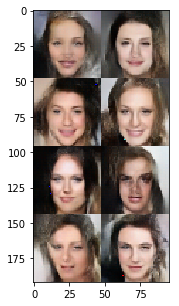

beta=    0.4444


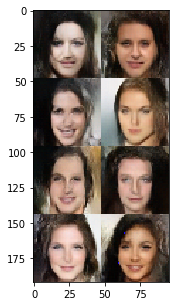

beta=    0.5556


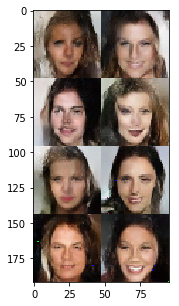

beta=    0.6667


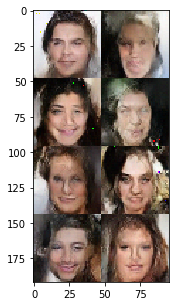

beta=    0.7778


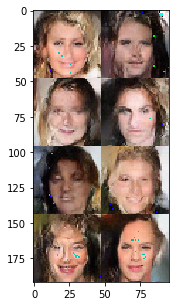

beta=    0.8889


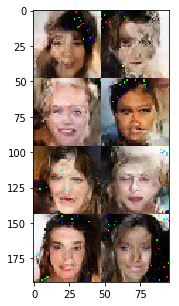

beta=    1.0000


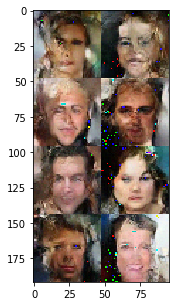

In [66]:
for beta in np.linspace(0.0, 1.0, 10):
    print(f"beta={beta:10.4f}")
    plt.figure(figsize=(5, 5))
    plt.imshow(utils.plot_grid(x_flow_sampled_prim).eval({
        lr_ph: 0.0,
        beta_y_ph: 1.0, 
        beta_z_ph: beta
    }))
    plt.show()

### Efect of the temperature on the Y latent variable when beta_z=0.1

beta=    0.0000


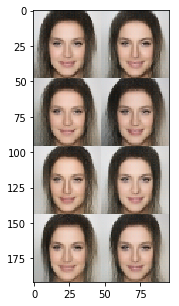

beta=    0.1111


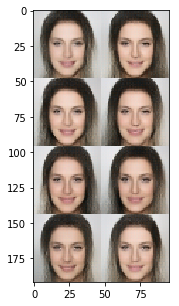

beta=    0.2222


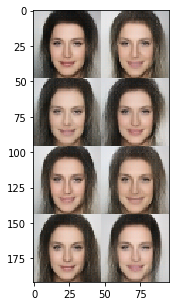

beta=    0.3333


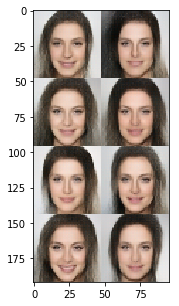

beta=    0.4444


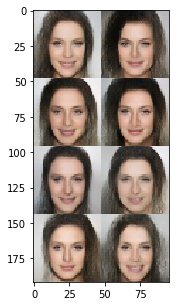

beta=    0.5556


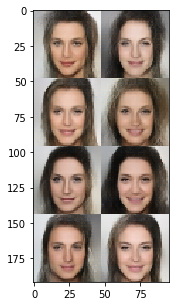

beta=    0.6667


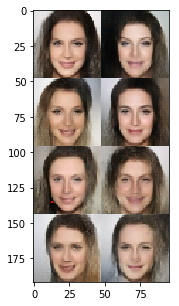

beta=    0.7778


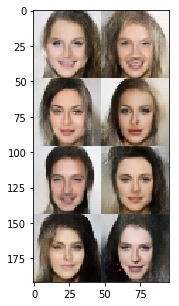

beta=    0.8889


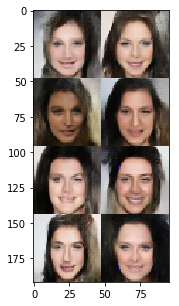

beta=    1.0000


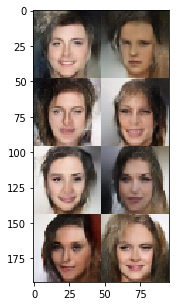

In [68]:
for beta in np.linspace(0.0, 1.0, 10):
    print(f"beta={beta:10.4f}")
    plt.figure(figsize=(7, 7))
    plt.imshow(utils.plot_grid(x_flow_sampled_prim).eval({
        lr_ph: 0.0,
        beta_y_ph: beta, 
        beta_z_ph: 0.3
    }))
    plt.show()

# Save model

In [72]:
saver = tf.train.Saver()
save_path = saver.save(sess, "./experiments/celeba48x48_22steps.ckpt")
print("Model saved in path: %s" % save_path)

Model saved in path: ./experiments/celeba48x48_22steps.ckpt
